In [2]:
#All libraries import here
import torch
import torch.nn as nn
import torch.optim as optim
import requests
import json
import pandas as pd
import datetime as dt
import seaborn as sns
import time
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import ray
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import shapiro, normaltest, jarque_bera
from hurst import compute_Hc
from functools import partial
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
from scipy.stats import normaltest
import optuna
from optuna.samplers import TPESampler
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import random
import time
from scipy.optimize import curve_fit
from scipy.special import expit


## Data loading

In [3]:
df = pd.read_csv('BTCUSDT_full_features.csv', index_col='Date', parse_dates=True)
df

,log_return,ETH_LogReturns,Volatility,RSI_14,ATR_14,blocksize,cost_per_transaction,difficulty,hash_rate,n_payments_per_block,n_transactions_per_block,n_transactions_total,avgblocksize
Date,,,,,,,,,,,,,
2018-01-16,-0.216880,0.425497,0.468509,0.305204,0.316867,0.000000,0.301796,0.000000,0.001913,0.262038,0.229748,0.000000,0.295511
2018-01-17,0.008113,0.716421,0.188175,0.295717,0.334373,0.000286,0.264873,0.000000,0.002600,0.253494,0.225611,0.000288,0.301318
2018-01-18,-0.002444,0.709120,0.047973,0.286157,0.335334,0.000590,0.306980,0.000000,0.003115,0.233811,0.203865,0.000588,0.295890
2018-01-19,0.045737,0.762522,0.048095,0.186188,0.321884,0.000902,0.364494,0.000000,0.002428,0.158291,0.137143,0.000882,0.294700
2018-01-20,0.109271,0.850073,0.054298,0.275093,0.328421,0.001198,0.423503,0.000000,0.003544,0.129746,0.110513,0.001112,0.322508
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-04-22,0.023845,0.740642,0.005239,0.676593,0.409602,0.998542,0.147500,0.867455,0.672572,0.540845,0.706638,0.997949,0.551124
2026-04-23,0.001013,0.693824,0.001336,0.665020,0.398095,0.998898,0.169929,0.867455,0.620335,0.510756,0.617384,0.998461,0.533958
2026-04-24,-0.010538,0.708445,0.000785,0.609541,0.389963,0.999219,0.157646,0.867455,0.766599,0.525360,0.666746,0.998889,0.543127


Normalising all features except log returns

## Data split - train val test

Train: 2018-01-16 to 2023-11-01 (2116 rows)
Val:   2023-11-02 to 2025-01-27 (453 rows)
Test:  2025-01-28 to 2026-04-26 (454 rows)


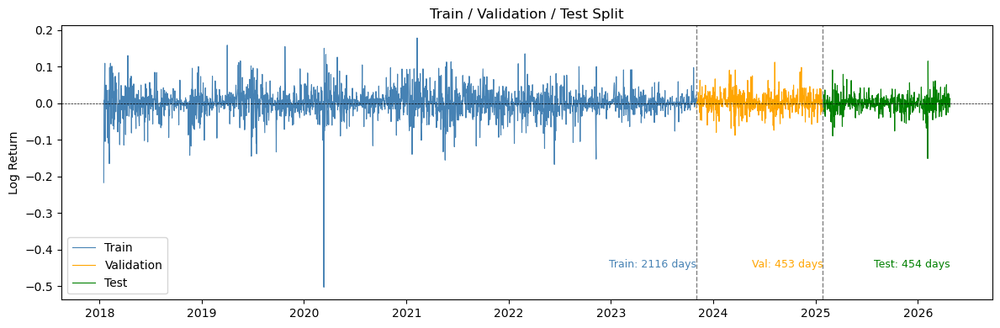

In [4]:
# Train/Val/Test split 70/15/15
train_size = int(len(df) * 0.70)
val_size = int(len(df) * 0.15)
test_size = len(df) - train_size - val_size

train_df = df.iloc[:train_size]
val_df = df.iloc[train_size:train_size + val_size]
test_df = df.iloc[train_size + val_size:]

print(f"Train: {train_df.index[0].date()} to {train_df.index[-1].date()} ({len(train_df)} rows)")
print(f"Val:   {val_df.index[0].date()} to {val_df.index[-1].date()} ({len(val_df)} rows)")
print(f"Test:  {test_df.index[0].date()} to {test_df.index[-1].date()} ({len(test_df)} rows)")

# Plot split
fig, ax = plt.subplots(figsize=(12, 4))

ax.plot(train_df.index, train_df['log_return'], color='steelblue', linewidth=0.8, label='Train')
ax.plot(val_df.index, val_df['log_return'], color='orange', linewidth=0.8, label='Validation')
ax.plot(test_df.index, test_df['log_return'], color='green', linewidth=0.8, label='Test')

ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', linewidth=1)
ax.axvline(x=val_df.index[-1], color='gray', linestyle='--', linewidth=1)
ax.axhline(0, color='black', linewidth=0.5, linestyle='--')

# Labels at bottom right of each block
y_label_pos = ax.get_ylim()[0] * 0.85
ax.text(train_df.index[-1], y_label_pos,
        f'Train: {len(train_df)} days',
        ha='right', va='bottom', fontsize=9, color='steelblue')
ax.text(val_df.index[-1], y_label_pos,
        f'Val: {len(val_df)} days',
        ha='right', va='bottom', fontsize=9, color='orange')
ax.text(test_df.index[-1], y_label_pos,
        f'Test: {len(test_df)} days',
        ha='right', va='bottom', fontsize=9, color='green')

ax.set_title('Train / Validation / Test Split')
ax.set_ylabel('Log Return')
ax.legend()
plt.tight_layout()
plt.savefig('data_split.png', dpi=150)
plt.show()

we still used 70-15-15 train val test splits, with 2116 days in the training, 453 days inthe validaton and 454 days in the test period

In [112]:
train_df

,log_return,ETH_LogReturns,Volatility,RSI_14,ATR_14,blocksize,cost_per_transaction,difficulty,hash_rate,n_payments_per_block,n_transactions_per_block,n_transactions_total,avgblocksize
Date,,,,,,,,,,,,,
2018-01-16,-0.216880,0.425497,0.468509,0.305204,0.316867,0.000000,0.301796,0.000000,0.001913,0.262038,0.229748,0.000000,0.295511
2018-01-17,0.008113,0.716421,0.188175,0.295717,0.334373,0.000286,0.264873,0.000000,0.002600,0.253494,0.225611,0.000288,0.301318
2018-01-18,-0.002444,0.709120,0.047973,0.286157,0.335334,0.000590,0.306980,0.000000,0.003115,0.233811,0.203865,0.000588,0.295890
2018-01-19,0.045737,0.762522,0.048095,0.186188,0.321884,0.000902,0.364494,0.000000,0.002428,0.158291,0.137143,0.000882,0.294700
2018-01-20,0.109271,0.850073,0.054298,0.275093,0.328421,0.001198,0.423503,0.000000,0.003544,0.129746,0.110513,0.001112,0.322508
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-28,0.005560,0.714237,0.000949,0.911632,0.223427,0.632573,0.154481,0.382469,0.364454,0.711637,0.575018,0.586096,0.591239
2023-10-29,0.012969,0.729288,0.001598,0.913145,0.227376,0.633031,0.191981,0.382469,0.310377,0.592108,0.461312,0.586632,0.585887
2023-10-30,-0.001483,0.725778,0.001482,0.890316,0.202696,0.633419,0.197880,0.390235,0.362225,0.588258,0.455852,0.587021,0.602425


In [85]:
val_df

,log_return,ETH_LogReturns,Volatility,RSI_14,ATR_14,blocksize,cost_per_transaction,difficulty,hash_rate,n_payments_per_block,n_transactions_per_block,n_transactions_total,avgblocksize
Date,,,,,,,,,,,,,
2023-11-02,-0.013639,0.685695,0.006544,0.864664,0.222318,0.634725,0.222014,0.391789,0.334783,0.613021,0.420224,0.588313,0.572047
2023-11-03,-0.006455,0.737730,0.001605,0.820724,0.212858,0.635127,0.175282,0.391789,0.315533,0.750304,0.532049,0.588696,0.557528
2023-11-04,0.009897,0.731440,0.001019,0.823185,0.209966,0.635500,0.135726,0.391789,0.392536,0.889801,0.710128,0.589128,0.599660
2023-11-05,-0.001432,0.739841,0.002005,0.815650,0.213784,0.635986,0.137401,0.391789,0.380504,0.808971,0.703919,0.589791,0.617674
2023-11-06,0.000977,0.722332,0.000674,0.694822,0.163016,0.636467,0.181565,0.391789,0.293875,0.736009,0.560460,0.590429,0.594364
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-23,0.001962,0.751674,0.008218,0.726383,0.755678,0.821915,0.423760,0.703918,0.566959,0.409542,0.333705,0.810765,0.604066
2025-01-24,0.009198,0.706158,0.004929,0.711542,0.764399,0.822310,0.383221,0.703918,0.583979,0.462042,0.385013,0.811074,0.605133
2025-01-25,-0.001180,0.719598,0.000331,0.711625,0.763942,0.822718,0.378049,0.703918,0.532918,0.449366,0.387339,0.811425,0.613264


In [87]:
test_df

,log_return,ETH_LogReturns,Volatility,RSI_14,ATR_14,blocksize,cost_per_transaction,difficulty,hash_rate,n_payments_per_block,n_transactions_per_block,n_transactions_total,avgblocksize
Date,,,,,,,,,,,,,
2025-01-28,-0.007348,0.675829,0.003386,0.581212,0.770331,0.823987,0.483152,0.688656,0.604641,0.309270,0.263274,0.812355,0.707434
2025-01-29,0.023386,0.730599,0.003182,0.552348,0.761760,0.824472,0.441939,0.688656,0.633794,0.350331,0.311358,0.812646,0.648183
2025-01-30,0.009496,0.767344,0.002596,0.585104,0.757604,0.824948,0.445262,0.688656,0.592147,0.372955,0.315373,0.812982,0.626988
2025-01-31,-0.022143,0.736281,0.005231,0.435830,0.740370,0.825381,0.380415,0.688656,0.508853,0.465254,0.383310,0.813303,0.622505
2025-02-01,-0.017669,0.647053,0.001707,0.385085,0.737929,0.825752,0.523276,0.688656,0.754570,0.294107,0.236662,0.813614,0.689925
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-04-22,0.023845,0.740642,0.005239,0.676593,0.409602,0.998542,0.147500,0.867455,0.672572,0.540845,0.706638,0.997949,0.551124
2026-04-23,0.001013,0.693824,0.001336,0.665020,0.398095,0.998898,0.169929,0.867455,0.620335,0.510756,0.617384,0.998461,0.533958
2026-04-24,-0.010538,0.708445,0.000785,0.609541,0.389963,0.999219,0.157646,0.867455,0.766599,0.525360,0.666746,0.998889,0.543127


## Loss and function define

\begin{equation}
\ell_{\tau\mathrm{AGD}}(\boldsymbol{\Theta}^*)
= \sum_{t=1}^{n} \Bigg[
    \log\!\big(\sigma_{\text{AGD}}\big)
  + \log\!\left( \sqrt{\tfrac{\pi}{\tau}} + \sqrt{\tfrac{\pi}{1-\tau}} \right)
  - \log 2
  + \frac{\omega_\tau\!\big(y_t-\zeta_{t;\tau}(\boldsymbol{\Theta})\big)}{\sigma_{\text{AGD}}^{2}}
\Bigg],
\label{eq:agd_nll}
\end{equation}

In hybrid model the loss is same but we just pass in with different location parameter e, which is the hybrid component combining stats model and hybrid model

In [8]:
def hybrid_ernn_loss(y, e_hybrid, sigma, tau):
    """
    Hybrid ERNN AGD NLL Loss
    y        : observed returns (tensor), shape (T,)
    e_hybrid : hybrid expectile estimate (tensor), shape (T,)
               = psi * CARE_component + (1-psi) * FNN_component
    sigma    : scale parameter (scalar)
    tau      : expectile level in (0,1)
    """
    diff = y - e_hybrid
    omega = torch.abs(tau - (diff < 0).float()) * diff**2

    nll = (torch.log(sigma)
           + torch.log(torch.sqrt(torch.tensor(torch.pi / tau))
                       + torch.sqrt(torch.tensor(torch.pi / (1 - tau))))
           - torch.log(torch.tensor(2.0))
           + omega / sigma**2)

    return nll.mean()

Then we write up the location parameter

\begin{equation}
e_{t;\tau}^{\text{CARE}} = \gamma_1 e_{t-1;\tau} + \gamma_2 |y_{t-1}|
\end{equation}

In [10]:
def compute_hybrid_location(y, X, gamma1, gamma2, fnn_model, psi):
    """
    y      : raw log returns (T,)
    X      : normalised features (T, input_dim)
    gamma1 : expectile persistence, constrained to (0,1)
    gamma2 : magnitude impact, constrained to >0
    psi    : mixing weight, constrained to (0,1)
    """
    T = len(y)
    
    # FNN output for all timesteps at once
    fnn_out = fnn_model(X).squeeze(-1)  # shape (T,)
    
    e_care_list   = [torch.zeros(1)]
    e_hybrid_list = [torch.zeros(1)]
    
    for t in range(1, T):
        # CARE component — cross-lagged: uses previous hybrid output
        care_t = gamma1 * e_hybrid_list[t-1] + gamma2 * torch.abs(y[t-1])
        e_care_list.append(care_t)
        
        # Hybrid combination
        hybrid_t = psi * care_t + (1 - psi) * fnn_out[t]
        e_hybrid_list.append(hybrid_t)
    
    # Stack into tensors — stays in computation graph
    e_care   = torch.stack(e_care_list).squeeze(-1)
    e_hybrid = torch.stack(e_hybrid_list).squeeze(-1)
    
    return e_hybrid, e_care

we gonna estimate these parameters in the NN, and do hyperparameter tuning 

- $\gamma_1$ — persistence parameter, constrained to $[0,1)$ via sigmoid
- $\gamma_2$ — magnitude parameter, constrained to $\geq 0$ via softplus
- $\sigma_{\text{AGD}}$ — scale parameter, constrained to $> 0$ via softplus
- $\psi$ — mixing weight, constrained to $(0,1)$ via sigmoid
- $\boldsymbol{\theta}_E$ — all FNN weights and biases

## Updated Hyperparameter Search Space

**FNN Architecture**
- Number of hidden layers: (1, 2, 3)
- Hidden layer dimensions: integer in [32, 256] per layer
- Activation function: (ReLU, ELU, GELU, Tanh)
- Dropout rate: continuous in [0.0, 0.5]
- LayerNorm in hidden layers: (True, False)

**Optimisation**
- Learning rate: continuous in [1e-4, 1e-2] log scale
- Optimizer: (Adam, AdamW)
- Batch size: (32, 64, 128)
- Weight decay: continuous in [0, 1e-4]
- Gradient clipping: (0.1, 1.0, 5.0)

**Initialisation**
- γ1 init: (0.1, 0.5, 0.9)
- γ2 init: (0.1, 0.3, 0.5)
- Weight initialisation: (glorot, he)

**Training**
- Early stopping patience: (10, 20, 30)

**Fixed**
- FNN input dimension: 12 (all features)
- CARE lag: 1 day
- Max epochs: 200
- Train/Val/Test split: 70/15/15
- Trials per tau level: 200

In [12]:
# Feature columns for FNN input
feature_cols = ['Volatility', 'RSI_14', 'ATR_14', 'ETH_LogReturns',
                'blocksize', 'cost_per_transaction', 'difficulty',
                'hash_rate', 'n_payments_per_block',
                'n_transactions_per_block', 'n_transactions_total',
                'avgblocksize']

# Convert to tensors
y_train = torch.tensor(train_df['log_return'].values, dtype=torch.float32)
y_val = torch.tensor(val_df['log_return'].values, dtype=torch.float32)
X_train = torch.tensor(train_df[feature_cols].values, dtype=torch.float32)
X_val = torch.tensor(val_df[feature_cols].values, dtype=torch.float32)

convert each period into torch

In [14]:
class HybridERNN(nn.Module):
    def __init__(self, input_dim, config):
        super().__init__()
        
        # Learnable CARE parameters
        self.gamma1_raw = nn.Parameter(torch.tensor(float(config['gamma1_init'])))
        self.gamma2_raw = nn.Parameter(torch.tensor(float(config['gamma2_init'])))
        
        # Learnable mixing weight psi
        self.psi_raw = nn.Parameter(torch.tensor(0.5))
        
        # Learnable sigma
        self.sigma_raw = nn.Parameter(torch.tensor(0.5))
        
        # Build FNN
        layers = []
        prev_dim = input_dim
        n_hidden = config['n_hidden_layers']
        
        for i in range(n_hidden):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._get_activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            prev_dim = hidden_dim
        
        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)
        
        # Weight initialisation
        for m in self.fnn.modules():
            if isinstance(m, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(m.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
    
    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())
    
    def forward(self, y, X):
        # Constrained parameters
        gamma1 = torch.sigmoid(self.gamma1_raw)
        gamma2 = torch.nn.functional.softplus(self.gamma2_raw)
        psi = torch.sigmoid(self.psi_raw)
        sigma = torch.nn.functional.softplus(self.sigma_raw)
        
        e_hybrid, e_care = compute_hybrid_location(y, X, gamma1, gamma2, self.fnn, psi)
        
        return e_hybrid, sigma


def objective(trial, tau):
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation':      trial.suggest_categorical('activation', ['relu', 'elu', 'gelu', 'tanh']),
        'dropout':         trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm':       trial.suggest_categorical('layernorm', [True, False]),
        'weight_init':     trial.suggest_categorical('weight_init', ['glorot', 'he']),
        'lr':              trial.suggest_float('lr', 1e-4, 1e-2, log=True),
        'optimizer':       trial.suggest_categorical('optimizer', ['adam', 'adamw']),
        'batch_size':      trial.suggest_categorical('batch_size', [32, 64, 128]),
        'weight_decay':    trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip':   trial.suggest_categorical('gradient_clip', [0.1, 1.0, 5.0]),
        'gamma1_init':     trial.suggest_categorical('gamma1_init', [0.1, 0.5, 0.9]),
        'gamma2_init':     trial.suggest_categorical('gamma2_init', [0.1, 0.3, 0.5]),
        'patience':        trial.suggest_categorical('patience', [10, 20, 30]),
    }

    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(f'hidden_dim_{i}', 32, 256)

    
    
    input_dim = X_train.shape[1]
    torch.manual_seed(2026)
    model = HybridERNN(input_dim, config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 20
    max_epochs = 200
    best_model_state = None
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            return float('inf')
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        scheduler.step(val_loss)
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break
    
    # Extract estimated parameters from best model
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    with torch.no_grad():
        gamma1 = torch.sigmoid(model.gamma1_raw).item()
        gamma2 = torch.nn.functional.softplus(model.gamma2_raw).item()
        psi = torch.sigmoid(model.psi_raw).item()
        sigma = torch.nn.functional.softplus(model.sigma_raw).item()
    
    print(f"  Trial {trial.number}: val_loss={best_val_loss:.4f} | "
          f"tau={tau} | lr={config['lr']:.5f} | "
          f"layers={config['n_hidden_layers']} | "
          f"activation={config['activation']} | "
          f"dropout={config['dropout']:.3f} | "
          f"psi={psi:.4f} | sigma={sigma:.4f} | "
          f"gamma1={gamma1:.4f} | gamma2={gamma2:.4f}")
    
    return best_val_loss


# Run tuning for each tau level
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
base_seed = 2026
best_configs = {}

for i, tau in enumerate(tau_levels):
    print(f"\n{'='*60}")
    print(f"Tuning for tau = {tau} (seed = {base_seed + i})")
    print(f"{'='*60}")
    
    sampler = TPESampler(seed=base_seed + i)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                   n_trials=50, show_progress_bar=True)
    
    best_trial = study.best_trial
    best_configs[tau] = best_trial.params.copy()
    best_configs[tau]['tau'] = tau
    
    # Re-run best config once to extract estimated parameters
    torch.manual_seed(2026)
    best_model = HybridERNN(X_train.shape[1], best_configs[tau])
    
    if best_configs[tau]['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(best_model.parameters(), lr=best_configs[tau]['lr'],
                                     weight_decay=best_configs[tau]['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(best_model.parameters(), lr=best_configs[tau]['lr'],
                                      weight_decay=best_configs[tau]['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None
    
    for epoch in range(200):
        best_model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = best_model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        if torch.isnan(loss) or torch.isinf(loss):
            break
        loss.backward()
        nn.utils.clip_grad_norm_(best_model.parameters(), best_configs[tau]['gradient_clip'])
        optimizer.step()
        
        best_model.eval()
        with torch.no_grad():
            e_val, sigma_val = best_model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        scheduler.step(val_loss)
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in best_model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= 20:
                break
    
    if best_model_state is not None:
        best_model.load_state_dict(best_model_state)
    
    with torch.no_grad():
        est_gamma1 = torch.sigmoid(best_model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(best_model.gamma2_raw).item()
        est_psi = torch.sigmoid(best_model.psi_raw).item()
        est_sigma = torch.nn.functional.softplus(best_model.sigma_raw).item()
    
    best_configs[tau]['est_psi'] = est_psi
    best_configs[tau]['est_sigma'] = est_sigma
    best_configs[tau]['est_gamma1'] = est_gamma1
    best_configs[tau]['est_gamma2'] = est_gamma2
    
    print(f"\nBest trial: #{best_trial.number}")
    print(f"Best val loss: {best_trial.value:.4f}")
    print(f"Best params: {best_trial.params}")
    print(f"Estimated psi:    {est_psi:.4f}")
    print(f"Estimated sigma:  {est_sigma:.4f}")
    print(f"Estimated gamma1: {est_gamma1:.4f}")
    print(f"Estimated gamma2: {est_gamma2:.4f}")

print("\n" + "="*60)
print("TUNING COMPLETE — BEST CONFIGS PER TAU")
print("="*60)
for tau, config in best_configs.items():
    print(f"tau={tau}: {config}")

[I 2026-08-23 17:43:45,631] A new study created in memory with name: no-name-44ec7c8a-ff5e-4d84-9621-701e8ff205d1



Tuning for tau = 0.025 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

[W 2026-08-23 17:43:48,213] Trial 0 failed with parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/optuna/study/_optimize.py", line 201, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/var/folders/0k/3jhs8p2d2bdd3_fvs731s4cr0000gn/T/ipykernel_18341/2389884465.py", line 167, in <lambda>
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                                        ^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/0k/3jhs8p2d2bdd3_fvs731s4cr0000gn/T/ipykernel_18341/2389884465.py", line 108, in objective
    

KeyboardInterrupt: 

In [231]:
configs_rows = []
for tau, config in best_configs.items():
    row = {'tau': tau}
    row.update(config)
    configs_rows.append(row)

configs_df = pd.DataFrame(configs_rows)
configs_df = configs_df.set_index('tau')
configs_df

,n_hidden_layers,activation,dropout,layernorm,weight_init,lr,optimizer,batch_size,weight_decay,gradient_clip,gamma1_init,gamma2_init,patience,hidden_dim_0,hidden_dim_1,est_psi,est_sigma,est_gamma1,est_gamma2,hidden_dim_2
tau,,,,,,,,,,,,,,,,,,,,
0.025,2,gelu,0.072160,True,he,0.009993,adamw,128,0.000086,1.0,0.5,0.5,10,73,82,0.667126,0.173376,0.522287,0.542821,NaN
0.050,2,relu,0.381889,True,glorot,0.009997,adamw,32,0.000012,5.0,0.1,0.3,30,180,95,0.659014,0.172342,0.433284,0.495885,NaN
0.250,2,relu,0.466367,True,he,0.009991,adamw,64,0.000094,1.0,0.9,0.3,30,224,125,0.657170,0.171969,0.617755,0.481971,NaN
0.500,3,gelu,0.235034,True,he,0.009968,adam,64,0.000037,1.0,0.5,0.3,20,53,111,0.667571,0.173503,0.506229,0.433246,178.0
0.750,2,gelu,0.473109,True,he,0.009919,adam,128,0.000014,1.0,0.9,0.3,30,187,155,0.663743,0.172377,0.630579,0.504685,NaN
0.950,3,relu,0.260639,False,he,0.009953,adam,64,0.000074,5.0,0.9,0.5,20,83,216,0.638798,0.175672,0.610262,0.531044,94.0
0.975,2,elu,0.496028,True,glorot,0.009877,adamw,32,0.000049,1.0,0.1,0.1,10,190,141,0.658699,0.172587,0.518045,0.588695,NaN


Below is a chunk for debug, just for debug

In [121]:
# Step 1: verify data is clean
print("NaN in X_train:", torch.isnan(X_train).any().item())
print("NaN in y_train:", torch.isnan(y_train).any().item())
print("Inf in X_train:", torch.isinf(X_train).any().item())
print("Inf in y_train:", torch.isinf(y_train).any().item())

# Step 2: test compute_hybrid_location directly
test_config = {
    'n_hidden_layers': 1,
    'hidden_dim_0': 32,
    'activation': 'relu',
    'dropout': 0.0,
    'layernorm': False,
    'weight_init': 'glorot',
    'gamma1_init': 0.5,
    'gamma2_init': 0.1,
}

torch.manual_seed(2025)
model = HybridERNN(X_train.shape[1], test_config)
model.eval()

with torch.no_grad():
    gamma1 = torch.sigmoid(model.gamma1_raw)
    gamma2 = torch.nn.functional.softplus(model.gamma2_raw)
    psi = torch.sigmoid(model.psi_raw)
    sigma = torch.nn.functional.softplus(model.sigma_raw)
    
    print(f"\ngamma1: {gamma1.item():.4f}")
    print(f"gamma2: {gamma2.item():.4f}")
    print(f"psi: {psi.item():.4f}")
    print(f"sigma: {sigma.item():.4f}")
    
    # Step 3: test FNN output
    fnn_out = model.fnn(X_train).squeeze(-1)
    print(f"\nfnn_out: min={fnn_out.min():.4f}, max={fnn_out.max():.4f}")
    print(f"NaN in fnn_out: {torch.isnan(fnn_out).any().item()}")
    print(f"Inf in fnn_out: {torch.isinf(fnn_out).any().item()}")
    
    # Step 4: test full forward pass
    e_hybrid, sigma = model(y_train, X_train)
    print(f"\ne_hybrid: min={e_hybrid.min():.4f}, max={e_hybrid.max():.4f}")
    print(f"NaN in e_hybrid: {torch.isnan(e_hybrid).any().item()}")
    
    # Step 5: test loss
    tau = 0.05
    loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
    print(f"\nloss: {loss.item():.4f}")
    
    # Step 6: check each loss term individually
    diff = y_train - e_hybrid
    omega = torch.abs(tau - (diff < 0).float()) * diff**2
    term1 = torch.log(sigma)
    term2 = torch.log(torch.sqrt(torch.tensor(torch.pi / tau)) + 
                      torch.sqrt(torch.tensor(torch.pi / (1 - tau))))
    term3 = -torch.log(torch.tensor(2.0))
    term4 = omega / sigma**2
    print(f"\nterm1 log(sigma): {term1.item():.4f}")
    print(f"term2 log(norm):  {term2.item():.4f}")
    print(f"term3 -log(2):    {term3.item():.4f}")
    print(f"term4 omega/s^2:  min={term4.min():.4f}, max={term4.max():.4f}")

NaN in X_train: False
NaN in y_train: False
Inf in X_train: False
Inf in y_train: False

gamma1: 0.6225
gamma2: 0.7444
psi: 0.6225
sigma: 0.9741

fnn_out: min=-0.1162, max=0.2248
NaN in fnn_out: False
Inf in fnn_out: False

e_hybrid: min=-0.0232, max=0.2862
NaN in e_hybrid: False

loss: 1.5618

term1 log(sigma): -0.0263
term2 log(norm):  2.2768
term3 -log(2):    -0.6931
term4 omega/s^2:  min=0.0000, max=0.3488


## Plot the predicted expectile line


Training final model for tau = 0.025
  Epoch 50: train=1.5107, val=1.5030
  Epoch 100: train=1.1024, val=1.0931
  Epoch 150: train=0.6399, val=0.6293
  Epoch 200: train=0.1463, val=0.1277
  Test loss: 0.1268 | Coverage ratio: 0.441

Training final model for tau = 0.05
  Epoch 50: train=1.2092, val=1.2007
  Epoch 100: train=0.7956, val=0.7860
  Epoch 150: train=0.3302, val=0.3189
  Epoch 200: train=-0.1727, val=-0.1862
  Test loss: -0.1860 | Coverage ratio: 3.084

Training final model for tau = 0.25
  Epoch 50: train=0.6628, val=0.6536
  Epoch 100: train=0.2500, val=0.2397
  Epoch 150: train=-0.2141, val=-0.2258
  Epoch 200: train=-0.7077, val=-0.7212
  Test loss: -0.7224 | Coverage ratio: 1.833

Training final model for tau = 0.5
  Epoch 50: train=0.5575, val=0.5477
  Epoch 100: train=0.1479, val=0.1365
  Epoch 150: train=-0.3112, val=-0.3253
  Epoch 200: train=-0.7995, val=-0.8168
  Test loss: -0.8159 | Coverage ratio: 1.643

Training final model for tau = 0.75
  Epoch 50: train=0.66

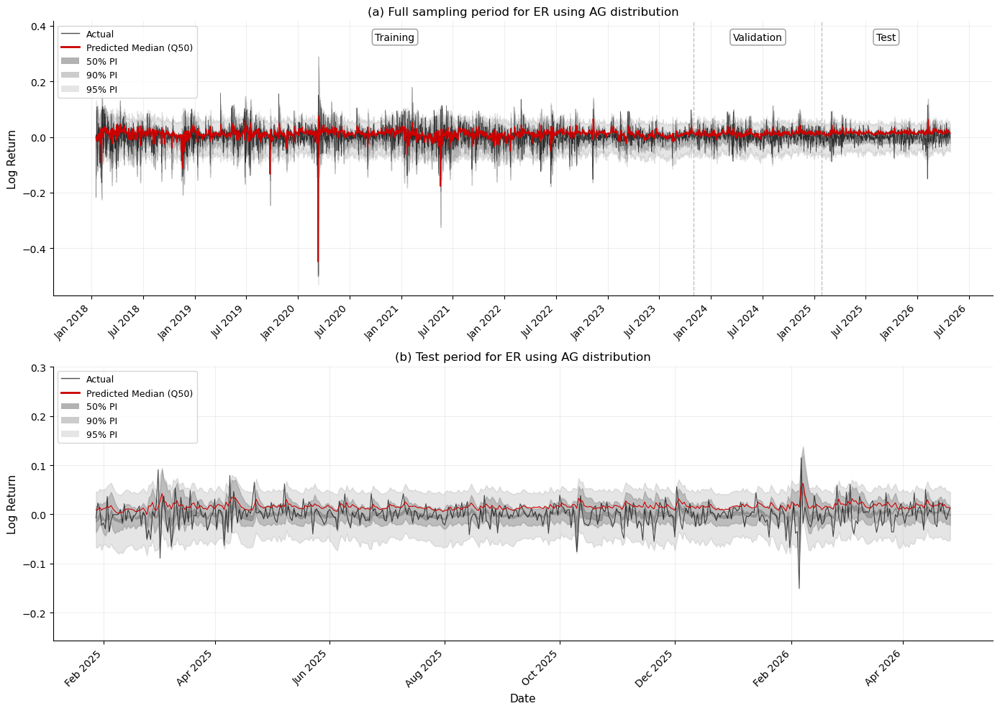

In [233]:
def train_final_model(tau, config, y_train, X_train, y_val, X_val, y_test, X_test):
    torch.manual_seed(2025)
    input_dim = X_train.shape[1]
    model = HybridERNN(input_dim, config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 30
    max_epochs = 200
    best_model_state = None
    train_losses, val_losses = [], []
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            print(f"  NaN/Inf at epoch {epoch}, stopping")
            break
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        train_losses.append(loss.item())
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        val_losses.append(val_loss.item())
        scheduler.step(val_loss)
        
        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: train={loss.item():.4f}, val={val_loss.item():.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch+1}")
                break
    
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    # Test evaluation
    model.eval()
    with torch.no_grad():
        e_test, sigma_test = model(y_test, X_test)
        test_loss = hybrid_ernn_loss(y_test, e_test, sigma_test, tau)
        
        if tau <= 0.5:
            coverage = (y_test <= e_test).float().mean().item()
        else:
            coverage = (y_test > e_test).float().mean().item()
        expected = tau if tau <= 0.5 else 1 - tau
        coverage_ratio = coverage / expected
    
    print(f"  Test loss: {test_loss.item():.4f} | Coverage ratio: {coverage_ratio:.3f}")
    
    return model, train_losses, val_losses, e_test.numpy()


# Convert test tensors
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

# Train all tau levels
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
results = {}

for tau in tau_levels:
    print(f"\n{'='*60}")
    print(f"Training final model for tau = {tau}")
    print(f"{'='*60}")
    config = best_configs[tau]
    model, train_losses, val_losses, e_test_pred = train_final_model(
        tau, config, y_train, X_train, y_val, X_val, y_test, X_test)
    results[tau] = {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'e_test': e_test_pred
    }


# ============================================================
# Plotting
# ============================================================
import matplotlib.dates as mdates
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols):
    
    actual_color = '#000000'
    pred_color = '#CC0000'
    pi_color = '#808080'
    
    # Get full predictions for all data
    all_preds = {}
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)
    
    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()
        with torch.no_grad():
            e_all, _ = model(y_all, X_all)
            all_preds[tau] = e_all.numpy()
    
    all_dates = df.index
    train_size = len(train_df)
    val_size = len(val_df)
    y_all_np = df['log_return'].values
    
    have_95 = (0.025 in all_preds) and (0.975 in all_preds)
    have_90 = (0.05 in all_preds) and (0.95 in all_preds)
    have_50 = (0.25 in all_preds) and (0.75 in all_preds)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    # ---- Panel (a): Full period ----
    ax = axes[0]
    y_min, y_max = y_all_np.min(), y_all_np.max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.35 * y_range)
    
    ax.plot(all_dates, y_all_np, color=actual_color, linewidth=0.5, alpha=0.7, label='Actual')
    ax.plot(all_dates, all_preds[0.5], color=pred_color, linewidth=1.2, label='Predicted Median (Q50)')
    
    if have_95:
        ax.fill_between(all_dates, all_preds[0.025], all_preds[0.975], color=pi_color, alpha=0.2)
    if have_90:
        ax.fill_between(all_dates, all_preds[0.05], all_preds[0.95], color=pi_color, alpha=0.4)
    if have_50:
        ax.fill_between(all_dates, all_preds[0.25], all_preds[0.75], color=pi_color, alpha=0.6)
    
    # Split lines
    ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axvline(x=val_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    
    # Period labels
    y_label = y_max + 0.25 * y_range
    ax.text(train_df.index[len(train_df)//2], y_label, 'Training',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(val_df.index[len(val_df)//2], y_label, 'Validation',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(test_df.index[len(test_df)//2], y_label, 'Test',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    legend_elements = [
        Line2D([0], [0], color=actual_color, lw=1, alpha=0.7, label='Actual'),
        Line2D([0], [0], color=pred_color, lw=2, label='Predicted Median (Q50)'),
    ]
    if have_50: legend_elements.append(Patch(facecolor=pi_color, alpha=0.6, label='50% PI'))
    if have_90: legend_elements.append(Patch(facecolor=pi_color, alpha=0.4, label='90% PI'))
    if have_95: legend_elements.append(Patch(facecolor=pi_color, alpha=0.2, label='95% PI'))
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax.set_title('(a) Full sampling period for ER using AG distribution', fontsize=12)
    ax.set_ylabel('Log Return', fontsize=11)
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # ---- Panel (b): Test period ----
    ax2 = axes[1]
    test_dates = test_df.index
    y_test_np = test_df['log_return'].values
    
    y_min_t, y_max_t = y_test_np.min(), y_test_np.max()
    y_range_t = y_max_t - y_min_t
    ax2.set_ylim(y_min_t - 0.4 * y_range_t, y_max_t + 0.7 * y_range_t)
    
    ax2.plot(test_dates, y_test_np, color=actual_color, linewidth=0.8, alpha=0.7, label='Actual')
    ax2.plot(test_dates, all_preds[0.5][train_size + val_size:], color=pred_color, linewidth=0.8)
    
    if have_95:
        ax2.fill_between(test_dates, all_preds[0.025][train_size + val_size:],
                         all_preds[0.975][train_size + val_size:], color=pi_color, alpha=0.2)
    if have_90:
        ax2.fill_between(test_dates, all_preds[0.05][train_size + val_size:],
                         all_preds[0.95][train_size + val_size:], color=pi_color, alpha=0.4)
    if have_50:
        ax2.fill_between(test_dates, all_preds[0.25][train_size + val_size:],
                         all_preds[0.75][train_size + val_size:], color=pi_color, alpha=0.6)
    
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    ax2.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax2.set_title('(b) Test period for ER using AG distribution', fontsize=12)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('Log Return', fontsize=11)
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('hybrid_ernn_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()


# Run plotting
plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols)


Training final model for tau = 0.025
  Epoch 50: train=1.5072, val=1.4994
  Epoch 100: train=1.1017, val=1.0925
  Epoch 150: train=0.6416, val=0.6310
  Epoch 200: train=0.1409, val=0.1290
  Test loss: 0.1298

Training final model for tau = 0.05
  Epoch 50: train=1.2170, val=1.2089
  Epoch 100: train=0.8112, val=0.8015
  Epoch 150: train=0.3508, val=0.3395
  Epoch 200: train=-0.1494, val=-0.1612
  Test loss: -0.1599

Training final model for tau = 0.25
  Epoch 50: train=0.6608, val=0.6521
  Epoch 100: train=0.2452, val=0.2378
  Epoch 150: train=-0.2197, val=-0.2308
  Epoch 200: train=-0.7212, val=-0.7286
  Test loss: -0.7042

Training final model for tau = 0.5
  Epoch 50: train=0.5566, val=0.5484
  Epoch 100: train=0.1533, val=0.1436
  Epoch 150: train=-0.3048, val=-0.3159
  Epoch 200: train=-0.8004, val=-0.8136
  Test loss: -0.8138

Training final model for tau = 0.75
  Epoch 50: train=0.6624, val=0.6547
  Epoch 100: train=0.2516, val=0.2434
  Epoch 150: train=-0.1642, val=-0.1254
  E

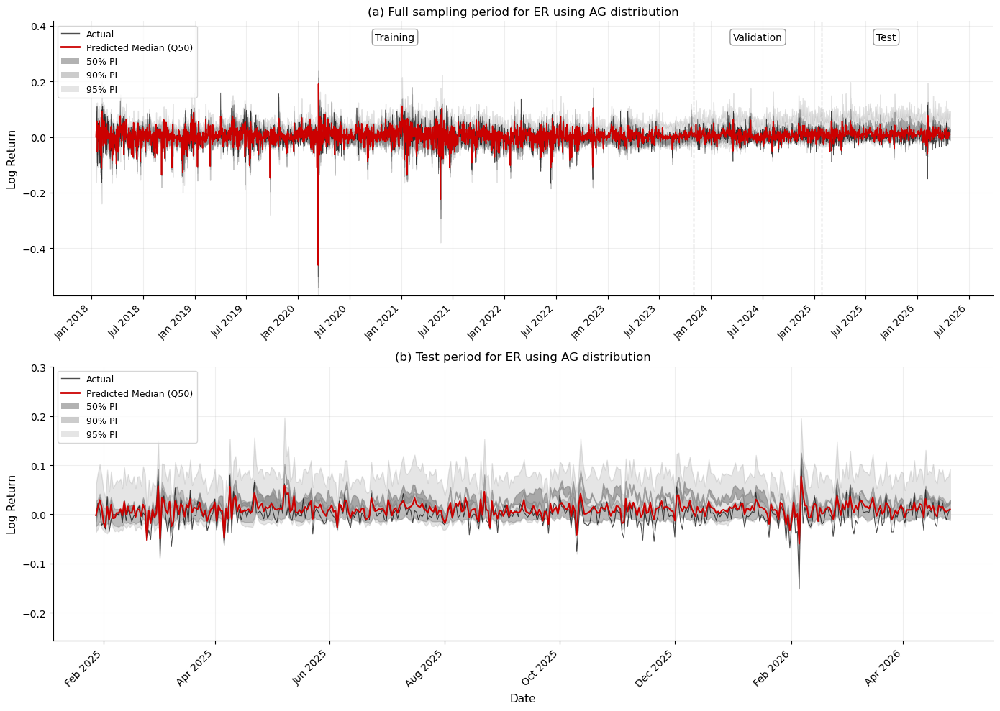

In [133]:
def train_final_model(tau, config, y_train, X_train, y_val, X_val, y_test, X_test):
    torch.manual_seed(2025)
    input_dim = X_train.shape[1]
    model = HybridERNN(input_dim, config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 30
    max_epochs = 200
    best_model_state = None
    train_losses, val_losses = [], []
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            print(f"  NaN/Inf at epoch {epoch}, stopping")
            break
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        train_losses.append(loss.item())
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        val_losses.append(val_loss.item())
        scheduler.step(val_loss)
        
        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: train={loss.item():.4f}, val={val_loss.item():.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch+1}")
                break
    
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    # Test evaluation
    model.eval()
    with torch.no_grad():
        e_test, sigma_test = model(y_test, X_test)
        test_loss = hybrid_ernn_loss(y_test, e_test, sigma_test, tau)
    
    print(f"  Test loss: {test_loss.item():.4f}")
    
    return model, train_losses, val_losses, e_test.numpy()


# Convert test tensors
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

# Train all tau levels
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
results = {}

for tau in tau_levels:
    print(f"\n{'='*60}")
    print(f"Training final model for tau = {tau}")
    print(f"{'='*60}")
    config = BEST_CONFIGS[tau]
    model, train_losses, val_losses, e_test_pred = train_final_model(
        tau, config, y_train, X_train, y_val, X_val, y_test, X_test)
    results[tau] = {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'e_test': e_test_pred
    }


# ============================================================
# Plotting
# ============================================================
import matplotlib.dates as mdates
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols):
    
    actual_color = '#000000'
    pred_color = '#CC0000'
    pi_color = '#808080'
    
    # Get full predictions for all data
    all_preds = {}
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)
    
    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()
        with torch.no_grad():
            e_all, _ = model(y_all, X_all)
            all_preds[tau] = e_all.numpy()
    
    all_dates = df.index
    train_size = len(train_df)
    val_size = len(val_df)
    y_all_np = df['log_return'].values
    
    have_95 = (0.025 in all_preds) and (0.975 in all_preds)
    have_90 = (0.05 in all_preds) and (0.95 in all_preds)
    have_50 = (0.25 in all_preds) and (0.75 in all_preds)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    # ---- Panel (a): Full period ----
    ax = axes[0]
    y_min, y_max = y_all_np.min(), y_all_np.max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.35 * y_range)
    
    ax.plot(all_dates, y_all_np, color=actual_color, linewidth=0.5, alpha=0.7, label='Actual')
    ax.plot(all_dates, all_preds[0.5], color=pred_color, linewidth=1.2, label='Predicted Median (Q50)')
    
    if have_95:
        ax.fill_between(all_dates, all_preds[0.025], all_preds[0.975], color=pi_color, alpha=0.2)
    if have_90:
        ax.fill_between(all_dates, all_preds[0.05], all_preds[0.95], color=pi_color, alpha=0.4)
    if have_50:
        ax.fill_between(all_dates, all_preds[0.25], all_preds[0.75], color=pi_color, alpha=0.6)
    
    ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axvline(x=val_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    
    y_label = y_max + 0.25 * y_range
    ax.text(train_df.index[len(train_df)//2], y_label, 'Training',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(val_df.index[len(val_df)//2], y_label, 'Validation',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(test_df.index[len(test_df)//2], y_label, 'Test',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    legend_elements = [
        Line2D([0], [0], color=actual_color, lw=1, alpha=0.7, label='Actual'),
        Line2D([0], [0], color=pred_color, lw=2, label='Predicted Median (Q50)'),
    ]
    if have_50: legend_elements.append(Patch(facecolor=pi_color, alpha=0.6, label='50% PI'))
    if have_90: legend_elements.append(Patch(facecolor=pi_color, alpha=0.4, label='90% PI'))
    if have_95: legend_elements.append(Patch(facecolor=pi_color, alpha=0.2, label='95% PI'))
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax.set_title('(a) Full sampling period for ER using AG distribution', fontsize=12)
    ax.set_ylabel('Log Return', fontsize=11)
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # ---- Panel (b): Test period ----
    ax2 = axes[1]
    test_dates = test_df.index
    y_test_np = test_df['log_return'].values
    
    y_min_t, y_max_t = y_test_np.min(), y_test_np.max()
    y_range_t = y_max_t - y_min_t
    ax2.set_ylim(y_min_t - 0.4 * y_range_t, y_max_t + 0.7 * y_range_t)
    
    ax2.plot(test_dates, y_test_np, color=actual_color, linewidth=0.8, alpha=0.7, label='Actual')
    ax2.plot(test_dates, all_preds[0.5][train_size + val_size:], color=pred_color, linewidth=1.5)
    
    if have_95:
        ax2.fill_between(test_dates, all_preds[0.025][train_size + val_size:],
                         all_preds[0.975][train_size + val_size:], color=pi_color, alpha=0.2)
    if have_90:
        ax2.fill_between(test_dates, all_preds[0.05][train_size + val_size:],
                         all_preds[0.95][train_size + val_size:], color=pi_color, alpha=0.4)
    if have_50:
        ax2.fill_between(test_dates, all_preds[0.25][train_size + val_size:],
                         all_preds[0.75][train_size + val_size:], color=pi_color, alpha=0.6)
    
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    ax2.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax2.set_title('(b) Test period for ER using AG distribution', fontsize=12)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('Log Return', fontsize=11)
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('hybrid_ernn_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()


# Run plotting
plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols)

## Quantile expectile Conversion

In [237]:


# Use tau=0.5 architecture as base
base_config = best_configs[0.75].copy()

# Fine grid of tau levels
tau_grid = np.linspace(0.01, 0.99, 50)

# Store fitted expectile mean for each tau
conversion_results = {}

print("Training conversion models across tau grid...")
for i, tau in enumerate(tau_grid):
    config = base_config.copy()
    config['gamma1_init'] = base_config['gamma1_init']
    config['gamma2_init'] = base_config['gamma2_init']
    
    torch.manual_seed(2025)
    model = HybridERNN(X_train.shape[1], config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 20
    max_epochs = 200
    best_model_state = None
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            break
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        scheduler.step(val_loss)
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break
    
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    # Get fitted expectile on full dataset
    model.eval()
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)
    
    with torch.no_grad():
        e_all, _ = model(y_all, X_all)
        e_tau_mean = e_all.numpy().mean()
    
    conversion_results[tau] = e_tau_mean
    
    if (i + 1) % 10 == 0:
        print(f"  Completed {i+1}/50 tau levels")

print("Done!")

# Empirical quantiles of actual returns
y_all_np = df['log_return'].values
alpha_grid = np.linspace(0.01, 0.99, 500)
empirical_quantiles = np.quantile(y_all_np, alpha_grid)

# For each tau, find matching alpha
tau_arr = np.array(list(conversion_results.keys()))
alpha_arr = np.array([
    alpha_grid[np.argmin(np.abs(empirical_quantiles - conversion_results[tau]))]
    for tau in tau_arr
])

print("\nSample conversion points:")
for t, a in zip(tau_arr[::10], alpha_arr[::10]):
    print(f"  tau={t:.3f} -> alpha={a:.4f}")

# Fit sigmoid
def sigmoid_func(x, a, b):
    return expit(a * (x - b))

popt, _ = curve_fit(sigmoid_func, tau_arr, alpha_arr, p0=[1.0, 0.5])
print(f"\nSigmoid params: a={popt[0]:.4f}, b={popt[1]:.4f}")

# Plot conversion curve
tau_fine    = np.linspace(0.01, 0.99, 500)
alpha_fitted = sigmoid_func(tau_fine, *popt)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(tau_fine, alpha_fitted, color='steelblue', linewidth=2, label='Fitted sigmoid')
ax.scatter(tau_arr, alpha_arr, color='red', zorder=5, s=30, alpha=0.7, label='Empirical mapping')
ax.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5, label='Identity line')
ax.set_xlabel(r'Expectile level $\tau$', fontsize=12)
ax.set_ylabel(r'Quantile level $\hat{\alpha}(\tau)$', fontsize=12)
ax.set_title('Expectile-to-Quantile Conversion Curve', fontsize=13)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('conversion_curve.png', dpi=300, bbox_inches='tight')
plt.show()

# Save conversion map for later use
conversion_df = pd.DataFrame({'tau': tau_arr, 'alpha_hat': alpha_arr})
conversion_df.to_csv('conversion_map.csv', index=False)
print("\nConversion map saved to conversion_map.csv")

Training conversion models across tau grid...


KeyboardInterrupt: 

Training conversion models across tau grid...
  Completed 10/50 | tau=0.190 -> alpha=0.3070
  Completed 20/50 | tau=0.390 -> alpha=0.6302
  Completed 30/50 | tau=0.590 -> alpha=0.4727
  Completed 40/50 | tau=0.790 -> alpha=0.8796
  Completed 50/50 | tau=0.990 -> alpha=0.9223
Done!

Sample conversion points:
  tau=0.010 -> alpha=0.0179
  tau=0.210 -> alpha=0.1065
  tau=0.410 -> alpha=0.4631
  tau=0.610 -> alpha=0.2137
  tau=0.810 -> alpha=0.3831

Sigmoid params: a=3.3836, b=0.5330


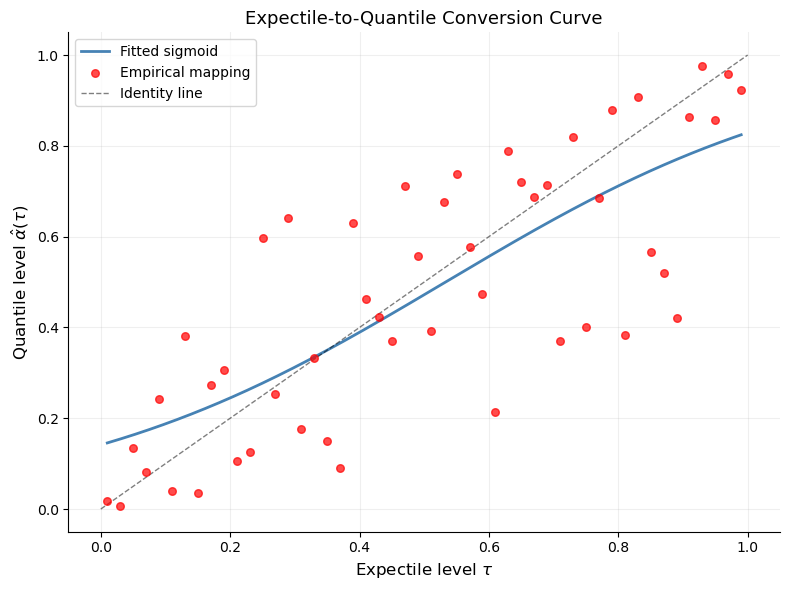


Conversion map saved to conversion_map.csv


In [243]:
# Use tau=0.75 architecture as base
base_config = best_configs[0.25].copy()

# Fine grid of tau levels
tau_grid = np.linspace(0.01, 0.99, 50)

# Store empirical coverage for each tau
conversion_results = {}

print("Training conversion models across tau grid...")
for i, tau in enumerate(tau_grid):
    config = base_config.copy()
    config['gamma1_init'] = base_config['gamma1_init']
    config['gamma2_init'] = base_config['gamma2_init']

    torch.manual_seed(2025)
    model = HybridERNN(X_train.shape[1], config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = 20
    max_epochs       = 200
    best_model_state = None

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

        if torch.isnan(loss) or torch.isinf(loss):
            break

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()

        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # ---- Compute empirical coverage on full dataset ----
    model.eval()
    X_all    = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all    = torch.tensor(df['log_return'].values, dtype=torch.float32)
    y_all_np = df['log_return'].values

    with torch.no_grad():
        e_all, _  = model(y_all, X_all)
        e_all_np  = e_all.numpy().flatten()

        # Empirical coverage = proportion of returns below expectile estimate
        # This directly gives the corresponding quantile level alpha
        empirical_coverage = np.mean(y_all_np <= e_all_np)

    conversion_results[tau] = empirical_coverage

    if (i + 1) % 10 == 0:
        print(f"  Completed {i+1}/50 | tau={tau:.3f} -> alpha={empirical_coverage:.4f}")

print("Done!")

# Arrays for fitting
tau_arr   = np.array(list(conversion_results.keys()))
alpha_arr = np.array(list(conversion_results.values()))

print("\nSample conversion points:")
for t, a in zip(tau_arr[::10], alpha_arr[::10]):
    print(f"  tau={t:.3f} -> alpha={a:.4f}")

# Fit sigmoid
from scipy.special import expit
from scipy.optimize import curve_fit

def sigmoid_func(x, a, b):
    return expit(a * (x - b))

popt, _ = curve_fit(sigmoid_func, tau_arr, alpha_arr, p0=[1.0, 0.5])
print(f"\nSigmoid params: a={popt[0]:.4f}, b={popt[1]:.4f}")

# Plot
tau_fine     = np.linspace(0.01, 0.99, 500)
alpha_fitted = sigmoid_func(tau_fine, *popt)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(tau_fine, alpha_fitted, color='steelblue', linewidth=2, label='Fitted sigmoid')
ax.scatter(tau_arr, alpha_arr, color='red', zorder=5, s=30, alpha=0.7, label='Empirical mapping')
ax.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5, label='Identity line')
ax.set_xlabel(r'Expectile level $\tau$', fontsize=12)
ax.set_ylabel(r'Quantile level $\hat{\alpha}(\tau)$', fontsize=12)
ax.set_title('Expectile-to-Quantile Conversion Curve', fontsize=13)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('conversion_curve.png', dpi=300, bbox_inches='tight')
plt.show()

# Save conversion map
conversion_df = pd.DataFrame({'tau': tau_arr, 'alpha_hat': alpha_arr})
conversion_df.to_csv('conversion_map.csv', index=False)
print("\nConversion map saved to conversion_map.csv")

Training conversion models across tau grid...
  Completed 5/50 | tau=0.090 -> alpha=0.1214 (seeds: ['0.130', '0.121', '0.020'])
  Completed 10/50 | tau=0.190 -> alpha=0.1280 (seeds: ['0.139', '0.121', '0.128'])
  Completed 15/50 | tau=0.290 -> alpha=0.2936 (seeds: ['0.302', '0.294', '0.243'])
  Completed 20/50 | tau=0.390 -> alpha=0.2362 (seeds: ['0.243', '0.230', '0.236'])
  Completed 25/50 | tau=0.490 -> alpha=0.3444 (seeds: ['0.344', '0.313', '0.442'])
  Completed 30/50 | tau=0.590 -> alpha=0.3355 (seeds: ['0.558', '0.336', '0.331'])
  Completed 35/50 | tau=0.690 -> alpha=0.4503 (seeds: ['0.450', '0.404', '0.486'])
  Completed 40/50 | tau=0.790 -> alpha=0.4945 (seeds: ['0.556', '0.494', '0.446'])
  Completed 45/50 | tau=0.890 -> alpha=0.6115 (seeds: ['0.642', '0.611', '0.585'])
  Completed 50/50 | tau=0.990 -> alpha=0.9183 (seeds: ['0.861', '0.918', '0.956'])
Done!

Monotonicity violations: 20/49

Sample conversion points:
  tau=0.010 -> alpha=0.0132
  tau=0.210 -> alpha=0.1015
  ta

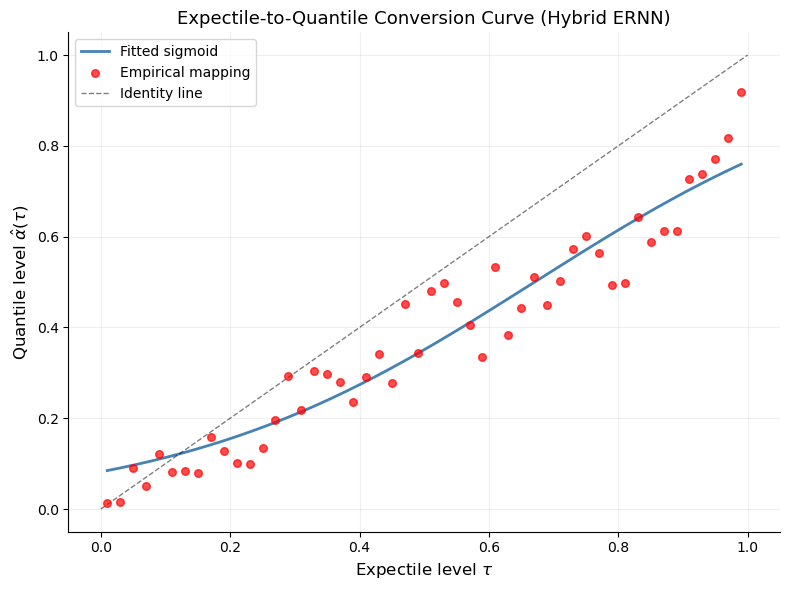


Conversion map saved to conversion_map.csv


In [245]:
# Use tau=0.5 as fixed base architecture
base_config = best_configs[0.25].copy()

tau_grid = np.linspace(0.01, 0.99, 50)
conversion_results = {}

print("Training conversion models across tau grid...")
for i, tau in enumerate(tau_grid):
    config = base_config.copy()
    config['patience'] = 30  # more patience
    
    # Train 3 seeds, take median coverage — reduces randomness
    coverages = []
    for seed in [2025, 2026, 2027]:
        torch.manual_seed(seed)
        model = HybridERNN(X_train.shape[1], config)

        if config['optimizer'] == 'adam':
            optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                         weight_decay=config['weight_decay'])
        else:
            optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                          weight_decay=config['weight_decay'])

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', patience=15, factor=0.5, min_lr=1e-6)

        best_val_loss    = float('inf')
        patience_counter = 0
        best_model_state = None

        for epoch in range(300):  # more epochs
            model.train()
            optimizer.zero_grad()
            e_hybrid, sigma = model(y_train, X_train)
            loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

            if torch.isnan(loss) or torch.isinf(loss):
                break

            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
            optimizer.step()

            model.eval()
            with torch.no_grad():
                e_val, sigma_val = model(y_val, X_val)
                val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

            scheduler.step(val_loss)

            if val_loss < best_val_loss:
                best_val_loss    = val_loss.item()
                patience_counter = 0
                best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
            else:
                patience_counter += 1
                if patience_counter >= 30:
                    break

        if best_model_state is not None:
            model.load_state_dict(best_model_state)

        # Compute coverage on validation set only — not full dataset
        model.eval()
        with torch.no_grad():
            e_val_pred, _ = model(y_val, X_val)
            e_val_np      = e_val_pred.numpy().flatten()
            y_val_np      = y_val.numpy().flatten()
            coverage      = np.mean(y_val_np <= e_val_np)
            coverages.append(coverage)

    # Take median across 3 seeds to reduce noise
    empirical_coverage = np.median(coverages)
    conversion_results[tau] = empirical_coverage

    if (i + 1) % 5 == 0:
        print(f"  Completed {i+1}/50 | tau={tau:.3f} -> alpha={empirical_coverage:.4f} "
              f"(seeds: {[f'{c:.3f}' for c in coverages]})")

print("Done!")

# Arrays
tau_arr   = np.array(list(conversion_results.keys()))
alpha_arr = np.array(list(conversion_results.values()))

# Check monotonicity
diffs = np.diff(alpha_arr)
n_violations = np.sum(diffs < 0)
print(f"\nMonotonicity violations: {n_violations}/{len(diffs)}")

print("\nSample conversion points:")
for t, a in zip(tau_arr[::10], alpha_arr[::10]):
    print(f"  tau={t:.3f} -> alpha={a:.4f}")

# Fit sigmoid
from scipy.special import expit
from scipy.optimize import curve_fit

def sigmoid_func(x, a, b):
    return expit(a * (x - b))

popt, _ = curve_fit(sigmoid_func, tau_arr, alpha_arr, p0=[1.0, 0.5])
print(f"\nSigmoid params: a={popt[0]:.4f}, b={popt[1]:.4f}")

# Plot
tau_fine     = np.linspace(0.01, 0.99, 500)
alpha_fitted = sigmoid_func(tau_fine, *popt)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(tau_fine, alpha_fitted, color='steelblue', linewidth=2, label='Fitted sigmoid')
ax.scatter(tau_arr, alpha_arr, color='red', zorder=5, s=30, alpha=0.7, label='Empirical mapping')
ax.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5, label='Identity line')
ax.set_xlabel(r'Expectile level $\tau$', fontsize=12)
ax.set_ylabel(r'Quantile level $\hat{\alpha}(\tau)$', fontsize=12)
ax.set_title('Expectile-to-Quantile Conversion Curve (Hybrid ERNN)', fontsize=13)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('conversion_curve.png', dpi=300, bbox_inches='tight')
plt.show()

# Save
conversion_df = pd.DataFrame({'tau': tau_arr, 'alpha_hat': alpha_arr})
conversion_df.to_csv('conversion_map.csv', index=False)
print("\nConversion map saved to conversion_map.csv")

In [52]:
class HybridERNN(nn.Module):
    def __init__(self, input_dim, config):
        super().__init__()
        
        # Learnable CARE parameters
        self.gamma1_raw = nn.Parameter(torch.tensor(float(config['gamma1_init'])))
        self.gamma2_raw = nn.Parameter(torch.tensor(float(config['gamma2_init'])))
        
        # Learnable mixing weight psi
        self.psi_raw = nn.Parameter(torch.tensor(0.5))
        
        # Learnable sigma
        self.sigma_raw = nn.Parameter(torch.tensor(0.5))
        
        # Build FNN
        layers = []
        prev_dim = input_dim
        n_hidden = config['n_hidden_layers']
        
        for i in range(n_hidden):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._get_activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            prev_dim = hidden_dim
        
        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)
        
        # Weight initialisation
        for m in self.fnn.modules():
            if isinstance(m, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(m.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
    
    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())
    
    def forward(self, y, X):
        gamma1 = torch.sigmoid(self.gamma1_raw)
        gamma2 = torch.nn.functional.softplus(self.gamma2_raw)
        psi    = torch.sigmoid(self.psi_raw)
        sigma  = torch.nn.functional.softplus(self.sigma_raw)
        
        e_hybrid, e_care = compute_hybrid_location(y, X, gamma1, gamma2, self.fnn, psi)
        
        return e_hybrid, sigma


def objective(trial, tau):
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation':      trial.suggest_categorical('activation', ['relu', 'elu', 'gelu', 'tanh']),
        'dropout':         trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm':       trial.suggest_categorical('layernorm', [True, False]),
        'weight_init':     trial.suggest_categorical('weight_init', ['glorot', 'he']),
        'lr':              trial.suggest_float('lr', 1e-4, 1e-2, log=True),
        'optimizer':       trial.suggest_categorical('optimizer', ['adam', 'adamw']),
        'batch_size':      trial.suggest_categorical('batch_size', [32, 64, 128]),
        'weight_decay':    trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip':   trial.suggest_categorical('gradient_clip', [0.1, 1.0, 5.0]),
        'gamma1_init':     trial.suggest_categorical('gamma1_init', [0.1, 0.5, 0.9]),
        'gamma2_init':     trial.suggest_categorical('gamma2_init', [0.1, 0.3, 0.5]),
        'patience':        trial.suggest_categorical('patience', [10, 20, 30]),
    }

    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(f'hidden_dim_{i}', 32, 256)

    input_dim = X_train.shape[1]
    torch.manual_seed(2026)
    model = HybridERNN(input_dim, config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = config['patience']
    max_epochs       = 200
    best_model_state = None

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

        if torch.isnan(loss) or torch.isinf(loss):
            return float('inf')

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()

        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    with torch.no_grad():
        gamma1 = torch.sigmoid(model.gamma1_raw).item()
        gamma2 = torch.nn.functional.softplus(model.gamma2_raw).item()
        psi    = torch.sigmoid(model.psi_raw).item()
        sigma  = torch.nn.functional.softplus(model.sigma_raw).item()

    print(f"  Trial {trial.number}: val_loss={best_val_loss:.4f} | "
          f"tau={tau} | lr={config['lr']:.5f} | "
          f"layers={config['n_hidden_layers']} | "
          f"activation={config['activation']} | "
          f"dropout={config['dropout']:.3f} | "
          f"psi={psi:.4f} | sigma={sigma:.4f} | "
          f"gamma1={gamma1:.4f} | gamma2={gamma2:.4f}")

    return best_val_loss


# -------------------------
# Run tuning for each tau level
# -------------------------
tau_levels    = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
base_seed     = 2026   # same seed for all levels
best_configs2 = {}

for i, tau in enumerate(tau_levels):
    print(f"\n{'='*60}")
    print(f"Tuning for tau = {tau} (seed = {base_seed})")
    print(f"{'='*60}")

    sampler = TPESampler(seed=base_seed)   # same seed every level
    study   = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                   n_trials=400, show_progress_bar=True)

    best_trial = study.best_trial
    best_configs2[tau] = best_trial.params.copy()
    best_configs2[tau]['tau'] = tau

    # Re-run best config to extract estimated parameters
    torch.manual_seed(2026)
    best_model = HybridERNN(X_train.shape[1], best_configs2[tau])

    if best_configs2[tau]['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(best_model.parameters(),
                                     lr=best_configs2[tau]['lr'],
                                     weight_decay=best_configs2[tau]['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(best_model.parameters(),
                                      lr=best_configs2[tau]['lr'],
                                      weight_decay=best_configs2[tau]['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(200):
        best_model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = best_model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        if torch.isnan(loss) or torch.isinf(loss):
            break
        loss.backward()
        nn.utils.clip_grad_norm_(best_model.parameters(),
                                  best_configs2[tau]['gradient_clip'])
        optimizer.step()

        best_model.eval()
        with torch.no_grad():
            e_val, sigma_val = best_model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in best_model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= best_configs2[tau].get('patience', 30):
                break

    if best_model_state is not None:
        best_model.load_state_dict(best_model_state)

    with torch.no_grad():
        est_gamma1 = torch.sigmoid(best_model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(best_model.gamma2_raw).item()
        est_psi    = torch.sigmoid(best_model.psi_raw).item()
        est_sigma  = torch.nn.functional.softplus(best_model.sigma_raw).item()

    best_configs2[tau]['est_psi']    = est_psi
    best_configs2[tau]['est_sigma']  = est_sigma
    best_configs2[tau]['est_gamma1'] = est_gamma1
    best_configs2[tau]['est_gamma2'] = est_gamma2

    print(f"\nBest trial: #{best_trial.number}")
    print(f"Best val loss: {best_trial.value:.4f}")
    print(f"Best params: {best_trial.params}")
    print(f"Estimated psi:    {est_psi:.4f}")
    print(f"Estimated sigma:  {est_sigma:.4f}")
    print(f"Estimated gamma1: {est_gamma1:.4f}")
    print(f"Estimated gamma2: {est_gamma2:.4f}")

print("\n" + "="*60)
print("TUNING COMPLETE — BEST CONFIGS2 PER TAU")
print("="*60)
for tau, config in best_configs2.items():
    print(f"tau={tau}: {config}")

[I 2026-05-15 20:43:42,189] A new study created in memory with name: no-name-87755504-559c-455d-855e-9541e4b58706



Tuning for tau = 0.025 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=1.8216 | tau=0.025 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6311 | sigma=0.9476 | gamma1=0.7056 | gamma2=0.9566
[I 2026-05-15 20:43:56,762] Trial 0 finished with value: 1.821639060974121 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.821639060974121.
  Trial 1: val_loss=0.5987 | tau=0.025 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6478 | sigma=0.2795 | gamma1=0.5240 | gamma2=0.6289
[I 2026-05-15 20:44:12,328] Trial 1 finished with value: 0.5986608266830444 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-15 22:26:54,094] A new study created in memory with name: no-name-0b322d05-283a-42bf-a2d5-ec65c3a7799d



Best trial: #351
Best val loss: 0.1042
Best params: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.47269595287600785, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.009992051894777455, 'optimizer': 'adamw', 'batch_size': 32, 'weight_decay': 9.984055007923945e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.1, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 162, 'hidden_dim_1': 125}
Estimated psi:    0.6673
Estimated sigma:  0.1703
Estimated gamma1: 0.3922
Estimated gamma2: 0.4978

Tuning for tau = 0.05 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=1.5332 | tau=0.05 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6308 | sigma=0.9476 | gamma1=0.7040 | gamma2=0.9517
[I 2026-05-15 22:27:09,321] Trial 0 finished with value: 1.5332435369491577 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.5332435369491577.
  Trial 1: val_loss=0.3068 | tau=0.05 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6445 | sigma=0.2784 | gamma1=0.5201 | gamma2=0.6144
[I 2026-05-15 22:27:25,556] Trial 1 finished with value: 0.30679017305374146 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.007583

[I 2026-05-16 00:07:26,974] A new study created in memory with name: no-name-6e7d955d-a8b0-4e73-bdd5-65e8ea4617a8



Best trial: #364
Best val loss: -0.1970
Best params: {'n_hidden_layers': 2, 'activation': 'elu', 'dropout': 0.39700267415398977, 'layernorm': False, 'weight_init': 'he', 'lr': 0.009998648426948841, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 5.522505300181981e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.1, 'gamma2_init': 0.1, 'patience': 20, 'hidden_dim_0': 109, 'hidden_dim_1': 205}
Estimated psi:    0.6624
Estimated sigma:  0.1680
Estimated gamma1: 0.4223
Estimated gamma2: 0.4212

Tuning for tau = 0.25 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=0.9509 | tau=0.25 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6358 | sigma=0.9240 | gamma1=0.7019 | gamma2=0.9415
[I 2026-05-16 00:07:42,055] Trial 0 finished with value: 0.9508647918701172 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 0.9508647918701172.
  Trial 1: val_loss=-0.2483 | tau=0.25 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6484 | sigma=0.2777 | gamma1=0.5204 | gamma2=0.5969
[I 2026-05-16 00:07:58,019] Trial 1 finished with value: -0.24825918674468994 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075

[I 2026-05-16 12:15:11,491] A new study created in memory with name: no-name-2076b879-61b0-4fa4-9a70-0f8769dfc2e3



Best trial: #392
Best val loss: -0.7587
Best params: {'n_hidden_layers': 3, 'activation': 'elu', 'dropout': 0.3538143150773241, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009997538395941067, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 4.163469940551557e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.5, 'gamma2_init': 0.1, 'patience': 20, 'hidden_dim_0': 87, 'hidden_dim_1': 32, 'hidden_dim_2': 244}
Estimated psi:    0.6949
Estimated sigma:  0.1656
Estimated gamma1: 0.5057
Estimated gamma2: 0.4039

Tuning for tau = 0.5 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=0.8943 | tau=0.5 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6230 | sigma=0.9726 | gamma1=0.7114 | gamma2=0.9756
[I 2026-05-16 12:15:14,988] Trial 0 finished with value: 0.8943436145782471 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 0.8943436145782471.
  Trial 1: val_loss=-0.3435 | tau=0.5 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6488 | sigma=0.2815 | gamma1=0.5268 | gamma2=0.6033
[I 2026-05-16 12:15:35,310] Trial 1 finished with value: -0.3435298204421997 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-16 14:46:44,947] A new study created in memory with name: no-name-0a4d93f3-0c91-44d2-bd34-e7a89265e088



Best trial: #331
Best val loss: -0.8499
Best params: {'n_hidden_layers': 3, 'activation': 'tanh', 'dropout': 0.2801091642855854, 'layernorm': False, 'weight_init': 'he', 'lr': 0.009987632546549854, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 7.77836638188221e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.1, 'gamma2_init': 0.1, 'patience': 30, 'hidden_dim_0': 98, 'hidden_dim_1': 51, 'hidden_dim_2': 64}
Estimated psi:    0.6845
Estimated sigma:  0.1695
Estimated gamma1: 0.4298
Estimated gamma2: 0.4114

Tuning for tau = 0.75 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=1.0027 | tau=0.75 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6232 | sigma=0.9721 | gamma1=0.7116 | gamma2=0.9760
[I 2026-05-16 14:46:47,811] Trial 0 finished with value: 1.002665638923645 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.002665638923645.
  Trial 1: val_loss=-0.2468 | tau=0.75 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6521 | sigma=0.2782 | gamma1=0.5447 | gamma2=0.6465
[I 2026-05-16 14:47:03,952] Trial 1 finished with value: -0.2467665821313858 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-16 16:30:18,861] A new study created in memory with name: no-name-203cbeba-c2f3-4165-9bac-960f0ff475e6



Best trial: #399
Best val loss: -0.7452
Best params: {'n_hidden_layers': 2, 'activation': 'elu', 'dropout': 0.17641462149302878, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009996192563929007, 'optimizer': 'adamw', 'batch_size': 32, 'weight_decay': 5.357999677575729e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.1, 'patience': 30, 'hidden_dim_0': 121, 'hidden_dim_1': 66}
Estimated psi:    0.6806
Estimated sigma:  0.1681
Estimated gamma1: 0.5578
Estimated gamma2: 0.4503

Tuning for tau = 0.95 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=1.5558 | tau=0.95 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6235 | sigma=0.9713 | gamma1=0.7118 | gamma2=0.9767
[I 2026-05-16 16:30:21,948] Trial 0 finished with value: 1.5558429956436157 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.5558429956436157.
  Trial 1: val_loss=0.3115 | tau=0.95 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6438 | sigma=0.2797 | gamma1=0.5791 | gamma2=0.7580
[I 2026-05-16 16:30:38,723] Trial 1 finished with value: 0.3114500343799591 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-16 19:43:45,286] A new study created in memory with name: no-name-f3f1e285-7eee-4951-a970-ae9499987fe1



Best trial: #306
Best val loss: -0.2160
Best params: {'n_hidden_layers': 2, 'activation': 'elu', 'dropout': 0.28404539029975767, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009980619403625835, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 2.581158157631766e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.5, 'gamma2_init': 0.1, 'patience': 10, 'hidden_dim_0': 163, 'hidden_dim_1': 147}
Estimated psi:    0.6759
Estimated sigma:  0.1645
Estimated gamma1: 0.5966
Estimated gamma2: 0.6219

Tuning for tau = 0.975 (seed = 2026)


  0%|          | 0/400 [00:00<?, ?it/s]

  Trial 0: val_loss=1.8436 | tau=0.975 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6238 | sigma=0.9703 | gamma1=0.7121 | gamma2=0.9776
[I 2026-05-16 19:43:48,460] Trial 0 finished with value: 1.8435826301574707 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.8435826301574707.
  Trial 1: val_loss=0.6035 | tau=0.975 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6471 | sigma=0.2809 | gamma1=0.5844 | gamma2=0.7860
[I 2026-05-16 19:44:04,375] Trial 1 finished with value: 0.6035077571868896 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.00758

In [58]:
class HybridQRNN(nn.Module):
    def __init__(self, input_dim, config):
        super().__init__()

        # Learnable CaViaR parameters (raw, constrained via sigmoid/softplus)
        self.beta1_raw = nn.Parameter(torch.tensor(float(config['beta1_init'])))
        self.beta2_raw = nn.Parameter(torch.tensor(float(config['beta2_init'])))

        # Learnable mixing weight psi (bigger = more CaViaR)
        self.psi_raw = nn.Parameter(torch.tensor(float(config['psi_init'])))

        # Learnable sigma
        self.sigma_raw = nn.Parameter(torch.tensor(0.5))

        # Build FNN
        layers = []
        prev_dim = input_dim
        n_hidden = config['n_hidden_layers']

        for i in range(n_hidden):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._get_activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            prev_dim = hidden_dim

        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)

        # Weight initialisation
        for m in self.fnn.modules():
            if isinstance(m, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(m.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())

    def forward(self, y, X):
        beta1 = torch.sigmoid(self.beta1_raw)
        beta2 = torch.nn.functional.softplus(self.beta2_raw)
        psi   = torch.sigmoid(self.psi_raw)
        sigma = torch.nn.functional.softplus(self.sigma_raw)

        q_hybrid, q_caviar = compute_hybrid_quantile_location(
            y, X, beta1, beta2, self.fnn, psi
        )

        return q_hybrid, sigma


def objective_qrnn(trial, alpha):
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation':      trial.suggest_categorical('activation', ['relu', 'elu', 'gelu', 'tanh']),
        'dropout':         trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm':       trial.suggest_categorical('layernorm', [True, False]),
        'weight_init':     trial.suggest_categorical('weight_init', ['glorot', 'he']),
        'lr':              trial.suggest_float('lr', 1e-4, 1e-2, log=True),
        'optimizer':       trial.suggest_categorical('optimizer', ['adam', 'adamw']),
        'batch_size':      trial.suggest_categorical('batch_size', [32, 64, 128]),
        'weight_decay':    trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip':   trial.suggest_categorical('gradient_clip', [0.1, 1.0, 5.0]),
        # corrected: these are raw values, sigmoid gives ≈ 0.70, 0.80, 0.90
        'beta1_init':      trial.suggest_categorical('beta1_init', [0.847, 1.386, 2.197]),
        'beta2_init':      trial.suggest_categorical('beta2_init', [0.1, 0.3, 0.5]),
        # psi_init: bigger = more CaViaR, sigmoid gives ≈ 0.50, 0.62, 0.73
        'psi_init':        trial.suggest_categorical('psi_init', [0.0, 0.5, 1.0]),
        'patience':        trial.suggest_categorical('patience', [10, 20, 30]),
    }
    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(f'hidden_dim_{i}', 32, 256)

    input_dim = X_train.shape[1]
    torch.manual_seed(3000)
    model = HybridQRNN(input_dim, config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = config['patience']
    max_epochs       = 200
    best_model_state = None

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        q_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_qrnn_loss(y_train, q_hybrid, sigma, alpha)

        if torch.isnan(loss) or torch.isinf(loss):
            return float('inf')

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()

        model.eval()
        with torch.no_grad():
            q_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_qrnn_loss(y_val, q_val, sigma_val, alpha)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    with torch.no_grad():
        beta1 = torch.sigmoid(model.beta1_raw).item()
        beta2 = torch.nn.functional.softplus(model.beta2_raw).item()
        psi   = torch.sigmoid(model.psi_raw).item()
        sigma = torch.nn.functional.softplus(model.sigma_raw).item()

    print(f"  Trial {trial.number}: val_loss={best_val_loss:.4f} | "
          f"alpha={alpha} | lr={config['lr']:.5f} | "
          f"layers={config['n_hidden_layers']} | "
          f"activation={config['activation']} | "
          f"dropout={config['dropout']:.3f} | "
          f"psi={psi:.4f} | sigma={sigma:.4f} | "
          f"beta1={beta1:.4f} | beta2={beta2:.4f}")

    return best_val_loss

# -------------------------
# Run tuning for each tau level
# -------------------------
tau_levels    = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
base_seed     = 2026   # same seed for all levels
best_configs2 = {}

for i, tau in enumerate(tau_levels):
    print(f"\n{'='*60}")
    print(f"Tuning for tau = {tau} (seed = {base_seed})")
    print(f"{'='*60}")

    sampler = TPESampler(seed=base_seed)   # same seed every level
    study   = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                   n_trials=50, show_progress_bar=True)

    best_trial = study.best_trial
    best_configs2[tau] = best_trial.params.copy()
    best_configs2[tau]['tau'] = tau

    # Re-run best config to extract estimated parameters
    torch.manual_seed(2026)
    best_model = HybridERNN(X_train.shape[1], best_configs2[tau])

    if best_configs2[tau]['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(best_model.parameters(),
                                     lr=best_configs2[tau]['lr'],
                                     weight_decay=best_configs2[tau]['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(best_model.parameters(),
                                      lr=best_configs2[tau]['lr'],
                                      weight_decay=best_configs2[tau]['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(200):
        best_model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = best_model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        if torch.isnan(loss) or torch.isinf(loss):
            break
        loss.backward()
        nn.utils.clip_grad_norm_(best_model.parameters(),
                                  best_configs2[tau]['gradient_clip'])
        optimizer.step()

        best_model.eval()
        with torch.no_grad():
            e_val, sigma_val = best_model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in best_model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= best_configs2[tau].get('patience', 30):
                break

    if best_model_state is not None:
        best_model.load_state_dict(best_model_state)

    with torch.no_grad():
        est_gamma1 = torch.sigmoid(best_model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(best_model.gamma2_raw).item()
        est_psi    = torch.sigmoid(best_model.psi_raw).item()
        est_sigma  = torch.nn.functional.softplus(best_model.sigma_raw).item()

    best_configs2[tau]['est_psi']    = est_psi
    best_configs2[tau]['est_sigma']  = est_sigma
    best_configs2[tau]['est_gamma1'] = est_gamma1
    best_configs2[tau]['est_gamma2'] = est_gamma2

    print(f"\nBest trial: #{best_trial.number}")
    print(f"Best val loss: {best_trial.value:.4f}")
    print(f"Best params: {best_trial.params}")
    print(f"Estimated psi:    {est_psi:.4f}")
    print(f"Estimated sigma:  {est_sigma:.4f}")
    print(f"Estimated gamma1: {est_gamma1:.4f}")
    print(f"Estimated gamma2: {est_gamma2:.4f}")

print("\n" + "="*60)
print("TUNING COMPLETE — BEST CONFIGS2 PER TAU")
print("="*60)
for tau, config in best_configs2.items():
    print(f"tau={tau}: {config}")

[I 2026-05-17 01:26:46,250] A new study created in memory with name: no-name-b4856393-fee1-439d-b2f9-dd4e40e1f580



Tuning for tau = 0.025 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=1.8216 | tau=0.025 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6311 | sigma=0.9476 | gamma1=0.7056 | gamma2=0.9566
[I 2026-05-17 01:27:01,685] Trial 0 finished with value: 1.821639060974121 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.821639060974121.
  Trial 1: val_loss=0.5987 | tau=0.025 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6478 | sigma=0.2795 | gamma1=0.5240 | gamma2=0.6289
[I 2026-05-17 01:27:18,022] Trial 1 finished with value: 0.5986608266830444 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-17 01:39:19,844] A new study created in memory with name: no-name-a807731d-c3f7-47f4-9902-3792f3571c5e



Best trial: #24
Best val loss: 0.1292
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0721596395880546, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009993259216112991, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 8.64774683455122e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 73, 'hidden_dim_1': 82}
Estimated psi:    0.6671
Estimated sigma:  0.1734
Estimated gamma1: 0.5223
Estimated gamma2: 0.5428

Tuning for tau = 0.05 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=1.5332 | tau=0.05 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6308 | sigma=0.9476 | gamma1=0.7040 | gamma2=0.9517
[I 2026-05-17 01:39:34,889] Trial 0 finished with value: 1.5332435369491577 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.5332435369491577.
  Trial 1: val_loss=0.3068 | tau=0.05 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6445 | sigma=0.2784 | gamma1=0.5201 | gamma2=0.6144
[I 2026-05-17 01:39:51,032] Trial 1 finished with value: 0.30679017305374146 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.007583

[I 2026-05-17 01:51:52,305] A new study created in memory with name: no-name-83f8dcee-f50b-4e46-afb9-645f58684b89



Best trial: #24
Best val loss: -0.1599
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0721596395880546, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009993259216112991, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 8.64774683455122e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 73, 'hidden_dim_1': 82}
Estimated psi:    0.6715
Estimated sigma:  0.1738
Estimated gamma1: 0.5170
Estimated gamma2: 0.5140

Tuning for tau = 0.25 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=0.9509 | tau=0.25 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6358 | sigma=0.9240 | gamma1=0.7019 | gamma2=0.9415
[I 2026-05-17 01:52:07,280] Trial 0 finished with value: 0.9508647918701172 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 0.9508647918701172.
  Trial 1: val_loss=-0.2483 | tau=0.25 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6484 | sigma=0.2777 | gamma1=0.5204 | gamma2=0.5969
[I 2026-05-17 01:52:23,656] Trial 1 finished with value: -0.24825918674468994 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075

[I 2026-05-17 02:04:22,164] A new study created in memory with name: no-name-578e4a53-3372-4c33-8f5d-5c22b3e052b9



Best trial: #24
Best val loss: -0.7165
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0721596395880546, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009993259216112991, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 8.64774683455122e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 73, 'hidden_dim_1': 82}
Estimated psi:    0.6616
Estimated sigma:  0.1734
Estimated gamma1: 0.5143
Estimated gamma2: 0.4883

Tuning for tau = 0.5 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=0.8943 | tau=0.5 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6230 | sigma=0.9726 | gamma1=0.7114 | gamma2=0.9756
[I 2026-05-17 02:04:24,805] Trial 0 finished with value: 0.8943436145782471 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 0.8943436145782471.
  Trial 1: val_loss=-0.3435 | tau=0.5 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6488 | sigma=0.2815 | gamma1=0.5268 | gamma2=0.6033
[I 2026-05-17 02:04:40,943] Trial 1 finished with value: -0.3435298204421997 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-17 02:17:21,773] A new study created in memory with name: no-name-b69de568-e5c3-408d-abb6-8b65c9040db7



Best trial: #24
Best val loss: -0.8204
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0721596395880546, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009993259216112991, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 8.64774683455122e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 73, 'hidden_dim_1': 82}
Estimated psi:    0.6592
Estimated sigma:  0.1738
Estimated gamma1: 0.5180
Estimated gamma2: 0.4802

Tuning for tau = 0.75 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=1.0027 | tau=0.75 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6232 | sigma=0.9721 | gamma1=0.7116 | gamma2=0.9760
[I 2026-05-17 02:17:24,687] Trial 0 finished with value: 1.002665638923645 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.002665638923645.
  Trial 1: val_loss=-0.2468 | tau=0.75 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6521 | sigma=0.2782 | gamma1=0.5447 | gamma2=0.6465
[I 2026-05-17 02:17:41,234] Trial 1 finished with value: -0.2467665821313858 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-17 02:30:11,316] A new study created in memory with name: no-name-ffedbd4e-5dd8-43c7-a6ac-f9e09b167f4c



Best trial: #24
Best val loss: -0.7124
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0721596395880546, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009993259216112991, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 8.64774683455122e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 73, 'hidden_dim_1': 82}
Estimated psi:    0.6583
Estimated sigma:  0.1741
Estimated gamma1: 0.5329
Estimated gamma2: 0.5009

Tuning for tau = 0.95 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=1.5558 | tau=0.95 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6235 | sigma=0.9713 | gamma1=0.7118 | gamma2=0.9767
[I 2026-05-17 02:30:14,432] Trial 0 finished with value: 1.5558429956436157 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.5558429956436157.
  Trial 1: val_loss=0.3115 | tau=0.95 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6438 | sigma=0.2797 | gamma1=0.5791 | gamma2=0.7580
[I 2026-05-17 02:30:30,976] Trial 1 finished with value: 0.3114500343799591 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0075832

[I 2026-05-17 04:31:10,931] A new study created in memory with name: no-name-a7a9da39-1c85-4024-8b6b-94a45a84d77b



Best trial: #11
Best val loss: -0.1710
Best params: {'n_hidden_layers': 3, 'activation': 'gelu', 'dropout': 0.12505436096210698, 'layernorm': True, 'weight_init': 'he', 'lr': 0.009992149737306867, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 9.834160686293977e-05, 'gradient_clip': 1.0, 'gamma1_init': 0.5, 'gamma2_init': 0.5, 'patience': 10, 'hidden_dim_0': 166, 'hidden_dim_1': 145, 'hidden_dim_2': 253}
Estimated psi:    0.6586
Estimated sigma:  0.1706
Estimated gamma1: 0.5809
Estimated gamma2: 0.6825

Tuning for tau = 0.975 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: val_loss=1.8436 | tau=0.975 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6238 | sigma=0.9703 | gamma1=0.7121 | gamma2=0.9776
[I 2026-05-17 04:31:13,928] Trial 0 finished with value: 1.8435826301574707 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'gamma1_init': 0.9, 'gamma2_init': 0.5, 'patience': 30, 'hidden_dim_0': 185}. Best is trial 0 with value: 1.8435826301574707.
  Trial 1: val_loss=0.6035 | tau=0.975 | lr=0.00758 | layers=3 | activation=relu | dropout=0.254 | psi=0.6471 | sigma=0.2809 | gamma1=0.5844 | gamma2=0.7860
[I 2026-05-17 04:47:07,404] Trial 1 finished with value: 0.6035077571868896 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.25401414034991676, 'layernorm': True, 'weight_init': 'he', 'lr': 0.00758

In [102]:
class HybridERNN(nn.Module):
    def __init__(self, input_dim, config):
        super().__init__()

        # Fixed initialisations -- estimated during training, not tuned by Optuna
        self.gamma1_raw = nn.Parameter(torch.tensor(1.386))   # sigmoid → 0.80
        self.gamma2_raw = nn.Parameter(torch.tensor(0.3))
        self.psi_raw    = nn.Parameter(torch.tensor(0.5))     # sigmoid → 0.50
        self.sigma_raw  = nn.Parameter(torch.tensor(0.5))

        # Build FNN
        layers = []
        prev_dim = input_dim
        n_hidden = config['n_hidden_layers']

        for i in range(n_hidden):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._get_activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            prev_dim = hidden_dim

        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)

        for m in self.fnn.modules():
            if isinstance(m, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(m.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())

    def forward(self, y, X):
        gamma1 = torch.sigmoid(self.gamma1_raw)
        gamma2 = torch.nn.functional.softplus(self.gamma2_raw)
        psi    = torch.sigmoid(self.psi_raw)
        sigma  = torch.nn.functional.softplus(self.sigma_raw)

        e_hybrid, e_care = compute_hybrid_location(y, X, gamma1, gamma2, self.fnn, psi)

        return e_hybrid, sigma


def compute_crp(y, q, alpha):
    """
    Coverage Ratio Penalty (CRP).
    For alpha <= 0.5: count violations where y <= q (lower tail).
    For alpha >  0.5: count violations where y >  q (upper tail).
    CRP = empirical_coverage / alpha*
    Penalty = (CRP - 1)^2
    """
    if alpha <= 0.5:
        empirical  = (y <= q).float().mean().item()
        alpha_star = alpha
    else:
        empirical  = (y > q).float().mean().item()
        alpha_star = 1.0 - alpha

    crp     = empirical / alpha_star
    penalty = (crp - 1.0) ** 2
    return crp, penalty


def objective(trial, tau):
    # Optuna only tunes architecture and training hyperparameters
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation':      trial.suggest_categorical('activation', ['relu', 'elu', 'gelu', 'tanh']),
        'dropout':         trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm':       trial.suggest_categorical('layernorm', [True, False]),
        'weight_init':     trial.suggest_categorical('weight_init', ['glorot', 'he']),
        'lr':              trial.suggest_float('lr', 1e-4, 1e-2, log=True),
        'optimizer':       trial.suggest_categorical('optimizer', ['adam', 'adamw']),
        'batch_size':      trial.suggest_categorical('batch_size', [32, 64, 128]),
        'weight_decay':    trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip':   trial.suggest_categorical('gradient_clip', [0.1, 1.0, 5.0]),
        'patience':        trial.suggest_categorical('patience', [10, 20, 30]),
    }

    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(f'hidden_dim_{i}', 32, 256)

    input_dim = X_train.shape[1]
    torch.manual_seed(2026)
    model = HybridERNN(input_dim, config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = config['patience']
    max_epochs       = 200
    best_model_state = None

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

        if torch.isnan(loss) or torch.isinf(loss):
            return float('inf')

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()

        # early stopping uses AGD NLL only -- not combined
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # after best model loaded -- compute CRP on val set
    with torch.no_grad():
        e_val, sigma_val = model(y_val, X_val)
        val_loss         = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        crp, crp_penalty = compute_crp(y_val, e_val, tau)

        lambda_  = 1.0
        combined = val_loss.item() + lambda_ * crp_penalty

        gamma1 = torch.sigmoid(model.gamma1_raw).item()
        gamma2 = torch.nn.functional.softplus(model.gamma2_raw).item()
        psi    = torch.sigmoid(model.psi_raw).item()
        sigma  = torch.nn.functional.softplus(model.sigma_raw).item()

    print(f"  Trial {trial.number}: "
          f"NLL={val_loss.item():.4f} | "
          f"CRP={crp:.4f} | "
          f"CRP_penalty={crp_penalty:.4f} | "
          f"combined={combined:.4f} | "
          f"tau={tau} | lr={config['lr']:.5f} | "
          f"layers={config['n_hidden_layers']} | "
          f"activation={config['activation']} | "
          f"dropout={config['dropout']:.3f} | "
          f"psi={psi:.4f} | sigma={sigma:.4f} | "
          f"gamma1={gamma1:.4f} | gamma2={gamma2:.4f}")

    return combined


# -------------------------
# Run tuning for each tau level
# -------------------------
tau_levels    = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
base_seed     = 2026
best_configs2 = {}

for i, tau in enumerate(tau_levels):
    print(f"\n{'='*60}")
    print(f"Tuning for tau = {tau} (seed = {base_seed + i})")
    print(f"{'='*60}")

    sampler = TPESampler(seed=base_seed + i)
    study   = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                   n_trials=50, show_progress_bar=True)

    best_trial = study.best_trial
    best_configs2[tau] = best_trial.params.copy()
    best_configs2[tau]['tau'] = tau

    # re-run best config to extract estimated parameters
    torch.manual_seed(2026)
    best_model = HybridERNN(X_train.shape[1], best_configs2[tau])

    if best_configs2[tau]['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(best_model.parameters(),
                                     lr=best_configs2[tau]['lr'],
                                     weight_decay=best_configs2[tau]['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(best_model.parameters(),
                                      lr=best_configs2[tau]['lr'],
                                      weight_decay=best_configs2[tau]['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(200):
        best_model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = best_model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        if torch.isnan(loss) or torch.isinf(loss):
            break
        loss.backward()
        nn.utils.clip_grad_norm_(best_model.parameters(),
                                  best_configs2[tau]['gradient_clip'])
        optimizer.step()

        best_model.eval()
        with torch.no_grad():
            e_val, sigma_val = best_model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in best_model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= best_configs2[tau].get('patience', 20):
                break

    if best_model_state is not None:
        best_model.load_state_dict(best_model_state)

    with torch.no_grad():
        e_val_final, sigma_val_final = best_model(y_val, X_val)
        final_nll                    = hybrid_ernn_loss(y_val, e_val_final, sigma_val_final, tau).item()
        final_crp, final_crp_penalty = compute_crp(y_val, e_val_final, tau)

        est_gamma1 = torch.sigmoid(best_model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(best_model.gamma2_raw).item()
        est_psi    = torch.sigmoid(best_model.psi_raw).item()
        est_sigma  = torch.nn.functional.softplus(best_model.sigma_raw).item()

    best_configs2[tau]['est_psi']    = est_psi
    best_configs2[tau]['est_sigma']  = est_sigma
    best_configs2[tau]['est_gamma1'] = est_gamma1
    best_configs2[tau]['est_gamma2'] = est_gamma2
    best_configs2[tau]['est_crp']    = final_crp

    print(f"\nBest trial: #{best_trial.number}")
    print(f"Best combined loss: {best_trial.value:.4f}")
    print(f"Final NLL:          {final_nll:.4f}")
    print(f"Final CRP:          {final_crp:.4f}")
    print(f"Final CRP penalty:  {final_crp_penalty:.4f}")
    print(f"Best params: {best_trial.params}")
    print(f"Estimated psi:    {est_psi:.4f}")
    print(f"Estimated sigma:  {est_sigma:.4f}")
    print(f"Estimated gamma1: {est_gamma1:.4f}")
    print(f"Estimated gamma2: {est_gamma2:.4f}")

print("\n" + "="*60)
print("TUNING COMPLETE — BEST CONFIGS2 PER TAU")
print("="*60)
for tau, config in best_configs2.items():
    print(f"tau={tau}: {config}")

[I 2026-06-07 13:59:23,010] A new study created in memory with name: no-name-93ffffaf-d48b-4117-972d-816fe8cd1061



Tuning for tau = 0.025 (seed = 2026)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=1.7960 | CRP=0.0883 | CRP_penalty=0.8312 | combined=2.6272 | tau=0.025 | lr=0.00040 | layers=1 | activation=elu | dropout=0.494 | psi=0.6369 | sigma=0.9244 | gamma1=0.7900 | gamma2=0.8215
[I 2026-06-07 13:59:36,761] Trial 0 finished with value: 2.627226412979816 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.00040267362023110176, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 176}. Best is trial 0 with value: 2.627226412979816.
  Trial 1: NLL=1.8046 | CRP=0.0883 | CRP_penalty=0.8312 | combined=2.6358 | tau=0.025 | lr=0.00033 | layers=1 | activation=relu | dropout=0.341 | psi=0.6324 | sigma=0.9333 | gamma1=0.7941 | gamma2=0.8435
[I 2026-06-07 13:59:50,123] Trial 1 finished with value: 2.6357619173209414 and parameters: {'n_hidden_layers': 1, 'activation': 'relu', 'dropout': 0.3412887415864622, 'l

[I 2026-06-07 14:10:33,777] A new study created in memory with name: no-name-f3aec7fb-1f4b-4f39-9270-0286067670d1



Best trial: #13
Best combined loss: 0.5507
Final NLL:          0.1323
Final CRP:          0.3532
Final CRP penalty:  0.4183
Best params: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.14061311466168394, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.009912717590606702, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 2.067221626719295e-06, 'gradient_clip': 1.0, 'patience': 10, 'hidden_dim_0': 101, 'hidden_dim_1': 84}
Estimated psi:    0.6624
Estimated sigma:  0.1751
Estimated gamma1: 0.7572
Estimated gamma2: 0.6373

Tuning for tau = 0.05 (seed = 2027)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=1.4850 | CRP=0.2649 | CRP_penalty=0.5404 | combined=2.0253 | tau=0.05 | lr=0.00055 | layers=3 | activation=relu | dropout=0.055 | psi=0.6342 | sigma=0.9055 | gamma1=0.7947 | gamma2=0.8383
[I 2026-06-07 14:10:49,117] Trial 0 finished with value: 2.0253499509816284 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.05498225107357002, 'layernorm': True, 'weight_init': 'he', 'lr': 0.0005537709423664429, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 8.394244804000419e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 65, 'hidden_dim_1': 240, 'hidden_dim_2': 130}. Best is trial 0 with value: 2.0253499509816284.
  Trial 1: NLL=1.5289 | CRP=0.1325 | CRP_penalty=0.7526 | combined=2.2816 | tau=0.05 | lr=0.00023 | layers=1 | activation=relu | dropout=0.307 | psi=0.6298 | sigma=0.9458 | gamma1=0.7962 | gamma2=0.8493
[I 2026-06-07 14:11:03,431] Trial 1 finished with value: 2.2815816753090647 and parameters: {'n_hidden_layers': 1, 'activation':

[I 2026-06-07 14:21:17,366] A new study created in memory with name: no-name-246b1ccd-5f32-498e-9eb9-5614142767db



Best trial: #49
Best combined loss: 0.3108
Final NLL:          0.1749
Final CRP:          1.3687
Final CRP penalty:  0.1359
Best params: {'n_hidden_layers': 1, 'activation': 'gelu', 'dropout': 0.05502558870724916, 'layernorm': True, 'weight_init': 'he', 'lr': 0.008327639342812014, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 1.5237944418212132e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 123}
Estimated psi:    0.7357
Estimated sigma:  0.2439
Estimated gamma1: 0.7256
Estimated gamma2: 0.6357

Tuning for tau = 0.25 (seed = 2028)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=0.9797 | CRP=2.4459 | CRP_penalty=2.0907 | combined=3.0704 | tau=0.25 | lr=0.00018 | layers=1 | activation=elu | dropout=0.167 | psi=0.6245 | sigma=0.9518 | gamma1=0.7988 | gamma2=0.8530
[I 2026-06-07 14:21:31,028] Trial 0 finished with value: 3.0704071738737184 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.16735790150049712, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.0001782624568485751, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 2.75565716153528e-05, 'gradient_clip': 5.0, 'patience': 10, 'hidden_dim_0': 120}. Best is trial 0 with value: 3.0704071738737184.
  Trial 1: NLL=0.2702 | CRP=2.1987 | CRP_penalty=1.4368 | combined=1.7071 | tau=0.25 | lr=0.00477 | layers=3 | activation=relu | dropout=0.306 | psi=0.6455 | sigma=0.4678 | gamma1=0.7845 | gamma2=0.7315
[I 2026-06-07 14:21:46,400] Trial 1 finished with value: 1.7070626495470265 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.3064279119726097

[I 2026-06-07 14:33:22,145] A new study created in memory with name: no-name-9e9812e3-aae8-4148-9f69-05ed82a3c083



Best trial: #39
Best combined loss: -0.2813
Final NLL:          -0.2971
Final CRP:          0.8742
Final CRP penalty:  0.0158
Best params: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.0014257159649824838, 'layernorm': True, 'weight_init': 'he', 'lr': 0.008246369370479215, 'optimizer': 'adamw', 'batch_size': 32, 'weight_decay': 7.553876844021664e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 49, 'hidden_dim_1': 190}
Estimated psi:    0.7140
Estimated sigma:  0.2643
Estimated gamma1: 0.7036
Estimated gamma2: 0.6556

Tuning for tau = 0.5 (seed = 2029)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=0.5363 | CRP=1.0949 | CRP_penalty=0.0090 | combined=0.5454 | tau=0.5 | lr=0.00234 | layers=1 | activation=elu | dropout=0.276 | psi=0.6726 | sigma=0.6815 | gamma1=0.7680 | gamma2=0.7937
[I 2026-06-07 14:33:36,569] Trial 0 finished with value: 0.5453509286426765 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.2759148998079755, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.002335610699279053, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 7.593227914398959e-06, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 137}. Best is trial 0 with value: 0.5453509286426765.
  Trial 1: NLL=0.6039 | CRP=0.9625 | CRP_penalty=0.0014 | combined=0.6053 | tau=0.5 | lr=0.00214 | layers=2 | activation=gelu | dropout=0.254 | psi=0.5428 | sigma=0.7293 | gamma1=0.7312 | gamma2=0.6840
[I 2026-06-07 14:33:51,621] Trial 1 finished with value: 0.6053439216494247 and parameters: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.2537982409470424, 'l

[I 2026-06-07 14:45:12,283] A new study created in memory with name: no-name-58fe818e-9a9a-488a-905a-58b8d6362c24



Best trial: #42
Best combined loss: -0.8351
Final NLL:          -0.8411
Final CRP:          0.9227
Final CRP penalty:  0.0060
Best params: {'n_hidden_layers': 1, 'activation': 'gelu', 'dropout': 0.38572000625231184, 'layernorm': True, 'weight_init': 'he', 'lr': 0.00994426948919326, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 7.264729978346113e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 94}
Estimated psi:    0.7279
Estimated sigma:  0.1699
Estimated gamma1: 0.7248
Estimated gamma2: 0.5174

Tuning for tau = 0.75 (seed = 2030)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=0.7681 | CRP=0.4415 | CRP_penalty=0.3119 | combined=1.0800 | tau=0.75 | lr=0.00167 | layers=2 | activation=tanh | dropout=0.118 | psi=0.6596 | sigma=0.7704 | gamma1=0.7696 | gamma2=0.7748
[I 2026-06-07 14:45:27,273] Trial 0 finished with value: 1.0800108997264326 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11794446303511014, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.0016669880956203037, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 8.793881352151788e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 111, 'hidden_dim_1': 185}. Best is trial 0 with value: 1.0800108997264326.
  Trial 1: NLL=1.0050 | CRP=1.1744 | CRP_penalty=0.0304 | combined=1.0354 | tau=0.75 | lr=0.00013 | layers=3 | activation=gelu | dropout=0.156 | psi=0.6227 | sigma=0.9734 | gamma1=0.7998 | gamma2=0.8544
[I 2026-06-07 14:45:28,702] Trial 1 finished with value: 1.0353816594361547 and parameters: {'n_hidden_layers': 3, 'activation': 'gelu', 'dropout

[I 2026-06-07 14:56:44,084] A new study created in memory with name: no-name-82fa84b6-5035-4179-a6d3-a2d643a2d961



Best trial: #25
Best combined loss: -0.7084
Final NLL:          -0.7085
Final CRP:          0.9890
Final CRP penalty:  0.0001
Best params: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.25540824241104, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.009979022401837017, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 7.535376621840041e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 78, 'hidden_dim_1': 48}
Estimated psi:    0.6488
Estimated sigma:  0.1746
Estimated gamma1: 0.7525
Estimated gamma2: 0.5170

Tuning for tau = 0.95 (seed = 2031)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=1.2325 | CRP=0.5298 | CRP_penalty=0.2211 | combined=1.4536 | tau=0.95 | lr=0.00234 | layers=2 | activation=tanh | dropout=0.112 | psi=0.6315 | sigma=0.7036 | gamma1=0.7929 | gamma2=0.8129
[I 2026-06-07 14:56:59,327] Trial 0 finished with value: 1.453576023151444 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11155263989652436, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.0023361773850496623, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 3.1297438535544123e-06, 'gradient_clip': 1.0, 'patience': 10, 'hidden_dim_0': 187, 'hidden_dim_1': 217}. Best is trial 0 with value: 1.453576023151444.
  Trial 1: NLL=1.2908 | CRP=0.7506 | CRP_penalty=0.0622 | combined=1.3530 | tau=0.95 | lr=0.00193 | layers=2 | activation=tanh | dropout=0.041 | psi=0.6299 | sigma=0.7459 | gamma1=0.7937 | gamma2=0.8361
[I 2026-06-07 14:57:14,444] Trial 1 finished with value: 1.3530432871059994 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout

[I 2026-06-07 15:07:54,477] A new study created in memory with name: no-name-63a50ca8-7ba9-455e-bfc5-94cb53041e62



Best trial: #4
Best combined loss: -0.0180
Final NLL:          -0.0233
Final CRP:          0.9272
Final CRP penalty:  0.0053
Best params: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.18454634516727847, 'layernorm': True, 'weight_init': 'he', 'lr': 0.00989360841025453, 'optimizer': 'adamw', 'batch_size': 64, 'weight_decay': 5.3035129339900845e-06, 'gradient_clip': 0.1, 'patience': 20, 'hidden_dim_0': 67}
Estimated psi:    0.7698
Estimated sigma:  0.1997
Estimated gamma1: 0.7052
Estimated gamma2: 0.4624

Tuning for tau = 0.975 (seed = 2032)


  0%|          | 0/50 [00:00<?, ?it/s]

  Trial 0: NLL=1.5047 | CRP=12.7152 | CRP_penalty=137.2467 | combined=138.7514 | tau=0.975 | lr=0.00243 | layers=3 | activation=relu | dropout=0.111 | psi=0.6321 | sigma=0.6921 | gamma1=0.7907 | gamma2=0.8190
[I 2026-06-07 15:08:10,477] Trial 0 finished with value: 138.7513530311771 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.11110238679748752, 'layernorm': False, 'weight_init': 'he', 'lr': 0.002430563810803044, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 7.766054095562223e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 195, 'hidden_dim_1': 201, 'hidden_dim_2': 229}. Best is trial 0 with value: 138.7513530311771.
  Trial 1: NLL=1.8322 | CRP=5.9161 | CRP_penalty=24.1682 | combined=26.0004 | tau=0.975 | lr=0.00011 | layers=1 | activation=elu | dropout=0.061 | psi=0.6245 | sigma=0.9596 | gamma1=0.7988 | gamma2=0.8575
[I 2026-06-07 15:08:24,948] Trial 1 finished with value: 26.00036489927516 and parameters: {'n_hidden_layers': 1, 'activa

In [104]:
configs_rows = []
for tau, config in best_configs2.items():
    row = {'tau': tau}
    row.update(config)
    configs_rows.append(row)

configs_df = pd.DataFrame(configs_rows)
configs_df = configs_df.set_index('tau')
configs_df

,n_hidden_layers,activation,dropout,layernorm,weight_init,lr,optimizer,batch_size,weight_decay,gradient_clip,patience,hidden_dim_0,hidden_dim_1,est_psi,est_sigma,est_gamma1,est_gamma2,est_crp
tau,,,,,,,,,,,,,,,,,,
0.025,2,tanh,0.140613,False,glorot,0.009913,adamw,128,0.000002,1.0,10,101,84.0,0.662362,0.175082,0.757241,0.637350,0.353201
0.050,1,gelu,0.055026,True,he,0.008328,adam,128,0.000015,1.0,30,123,NaN,0.735693,0.243915,0.725644,0.635704,1.368653
0.250,2,gelu,0.001426,True,he,0.008246,adamw,32,0.000076,1.0,20,49,190.0,0.713977,0.264292,0.703639,0.655593,0.874172
0.500,1,gelu,0.385720,True,he,0.009944,adamw,128,0.000073,5.0,20,94,NaN,0.727885,0.169866,0.724826,0.517393,0.922737
0.750,2,tanh,0.255408,False,glorot,0.009979,adam,32,0.000075,1.0,20,78,48.0,0.648826,0.174586,0.752545,0.516989,0.988962
0.950,1,elu,0.184546,True,he,0.009894,adamw,64,0.000005,0.1,20,67,NaN,0.769760,0.199743,0.705216,0.462417,0.927152
0.975,2,tanh,0.273514,True,glorot,0.008879,adamw,64,0.000098,5.0,10,247,42.0,0.716616,0.215856,0.764096,0.696909,1.147903



Training final model for tau = 0.025
  Epoch 50: train=1.5061, val=1.4980
  Epoch 100: train=1.0979, val=1.0887
  Epoch 150: train=0.6373, val=0.6268
  Epoch 200: train=0.1429, val=0.1327
  Test loss: 0.1306

Training final model for tau = 0.05
  Epoch 50: train=1.2917, val=1.2854
  Epoch 100: train=0.9571, val=0.9492
  Epoch 150: train=0.5850, val=0.5760
  Epoch 200: train=0.1810, val=0.1731
  Test loss: 0.1786

Training final model for tau = 0.25
  Epoch 50: train=0.7272, val=0.7218
  Epoch 100: train=0.3778, val=0.3698
  Epoch 150: train=0.0948, val=0.0891
  Epoch 200: train=-0.3042, val=-0.3170
  Test loss: -0.3171

Training final model for tau = 0.5
  Epoch 50: train=0.5723, val=0.5554
  Epoch 100: train=0.1495, val=0.1334
  Epoch 150: train=-0.3189, val=-0.3347
  Epoch 200: train=-0.8132, val=-0.8319
  Test loss: -0.8139

Training final model for tau = 0.75
  Epoch 50: train=0.6653, val=0.6568
  Epoch 100: train=0.2574, val=0.2471
  Epoch 150: train=-0.2016, val=-0.2142
  Epoch 

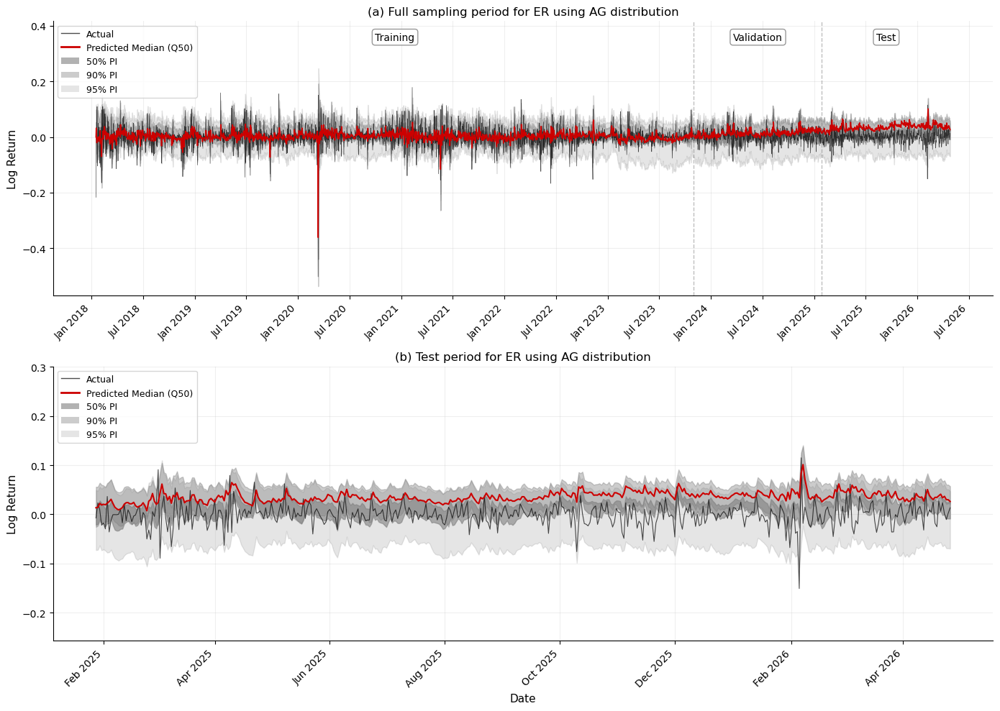

In [106]:
def train_final_model(tau, config, y_train, X_train, y_val, X_val, y_test, X_test):
    torch.manual_seed(2025)
    input_dim = X_train.shape[1]
    model = HybridERNN(input_dim, config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 30
    max_epochs = 200
    best_model_state = None
    train_losses, val_losses = [], []
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            print(f"  NaN/Inf at epoch {epoch}, stopping")
            break
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        train_losses.append(loss.item())
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        val_losses.append(val_loss.item())
        scheduler.step(val_loss)
        
        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: train={loss.item():.4f}, val={val_loss.item():.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch+1}")
                break
    
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    # Test evaluation
    model.eval()
    with torch.no_grad():
        e_test, sigma_test = model(y_test, X_test)
        test_loss = hybrid_ernn_loss(y_test, e_test, sigma_test, tau)
    
    print(f"  Test loss: {test_loss.item():.4f}")
    
    return model, train_losses, val_losses, e_test.numpy()


# Convert test tensors
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

# Train all tau levels
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
results = {}

for tau in tau_levels:
    print(f"\n{'='*60}")
    print(f"Training final model for tau = {tau}")
    print(f"{'='*60}")
    config = best_configs2[tau]
    model, train_losses, val_losses, e_test_pred = train_final_model(
        tau, config, y_train, X_train, y_val, X_val, y_test, X_test)
    results[tau] = {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'e_test': e_test_pred
    }


# ============================================================
# Plotting
# ============================================================
import matplotlib.dates as mdates
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols):
    
    actual_color = '#000000'
    pred_color = '#CC0000'
    pi_color = '#808080'
    
    # Get full predictions for all data
    all_preds = {}
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)
    
    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()
        with torch.no_grad():
            e_all, _ = model(y_all, X_all)
            all_preds[tau] = e_all.numpy()
    
    all_dates = df.index
    train_size = len(train_df)
    val_size = len(val_df)
    y_all_np = df['log_return'].values
    
    have_95 = (0.025 in all_preds) and (0.975 in all_preds)
    have_90 = (0.05 in all_preds) and (0.95 in all_preds)
    have_50 = (0.25 in all_preds) and (0.75 in all_preds)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    # ---- Panel (a): Full period ----
    ax = axes[0]
    y_min, y_max = y_all_np.min(), y_all_np.max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.35 * y_range)
    
    ax.plot(all_dates, y_all_np, color=actual_color, linewidth=0.5, alpha=0.7, label='Actual')
    ax.plot(all_dates, all_preds[0.5], color=pred_color, linewidth=1.2, label='Predicted Median (Q50)')
    
    if have_95:
        ax.fill_between(all_dates, all_preds[0.025], all_preds[0.975], color=pi_color, alpha=0.2)
    if have_90:
        ax.fill_between(all_dates, all_preds[0.05], all_preds[0.95], color=pi_color, alpha=0.4)
    if have_50:
        ax.fill_between(all_dates, all_preds[0.25], all_preds[0.75], color=pi_color, alpha=0.6)
    
    ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axvline(x=val_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    
    y_label = y_max + 0.25 * y_range
    ax.text(train_df.index[len(train_df)//2], y_label, 'Training',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(val_df.index[len(val_df)//2], y_label, 'Validation',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(test_df.index[len(test_df)//2], y_label, 'Test',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    legend_elements = [
        Line2D([0], [0], color=actual_color, lw=1, alpha=0.7, label='Actual'),
        Line2D([0], [0], color=pred_color, lw=2, label='Predicted Median (Q50)'),
    ]
    if have_50: legend_elements.append(Patch(facecolor=pi_color, alpha=0.6, label='50% PI'))
    if have_90: legend_elements.append(Patch(facecolor=pi_color, alpha=0.4, label='90% PI'))
    if have_95: legend_elements.append(Patch(facecolor=pi_color, alpha=0.2, label='95% PI'))
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax.set_title('(a) Full sampling period for ER using AG distribution', fontsize=12)
    ax.set_ylabel('Log Return', fontsize=11)
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # ---- Panel (b): Test period ----
    ax2 = axes[1]
    test_dates = test_df.index
    y_test_np = test_df['log_return'].values
    
    y_min_t, y_max_t = y_test_np.min(), y_test_np.max()
    y_range_t = y_max_t - y_min_t
    ax2.set_ylim(y_min_t - 0.4 * y_range_t, y_max_t + 0.7 * y_range_t)
    
    ax2.plot(test_dates, y_test_np, color=actual_color, linewidth=0.8, alpha=0.7, label='Actual')
    ax2.plot(test_dates, all_preds[0.5][train_size + val_size:], color=pred_color, linewidth=1.5)
    
    if have_95:
        ax2.fill_between(test_dates, all_preds[0.025][train_size + val_size:],
                         all_preds[0.975][train_size + val_size:], color=pi_color, alpha=0.2)
    if have_90:
        ax2.fill_between(test_dates, all_preds[0.05][train_size + val_size:],
                         all_preds[0.95][train_size + val_size:], color=pi_color, alpha=0.4)
    if have_50:
        ax2.fill_between(test_dates, all_preds[0.25][train_size + val_size:],
                         all_preds[0.75][train_size + val_size:], color=pi_color, alpha=0.6)
    
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    ax2.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax2.set_title('(b) Test period for ER using AG distribution', fontsize=12)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('Log Return', fontsize=11)
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('hybrid_ernn_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()


# Run plotting
plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols)

Training conversion models across tau grid...
  Completed 10/100 | tau=0.099 -> alpha=0.2230 (seeds: ['0.148', '0.223', '0.294'])
  Completed 20/100 | tau=0.198 -> alpha=0.2494 (seeds: ['0.249', '0.238', '0.563'])
  Completed 30/100 | tau=0.297 -> alpha=0.5894 (seeds: ['0.589', '0.475', '0.611'])
  Completed 40/100 | tau=0.396 -> alpha=0.3642 (seeds: ['0.364', '0.223', '0.470'])
  Completed 50/100 | tau=0.495 -> alpha=0.6093 (seeds: ['0.689', '0.609', '0.366'])
  Completed 60/100 | tau=0.594 -> alpha=0.7307 (seeds: ['0.731', '0.762', '0.728'])
  Completed 70/100 | tau=0.693 -> alpha=0.7174 (seeds: ['0.781', '0.717', '0.539'])
  Completed 80/100 | tau=0.792 -> alpha=0.7594 (seeds: ['0.667', '0.826', '0.759'])
  Completed 90/100 | tau=0.891 -> alpha=0.8389 (seeds: ['0.614', '0.839', '0.901'])
  Completed 100/100 | tau=0.990 -> alpha=0.9868 (seeds: ['0.980', '0.993', '0.987'])
Done!

Monotonicity violations: 39/99

Sample conversion points:
  tau=0.010 -> alpha=0.0110
  tau=0.109 -> alpha

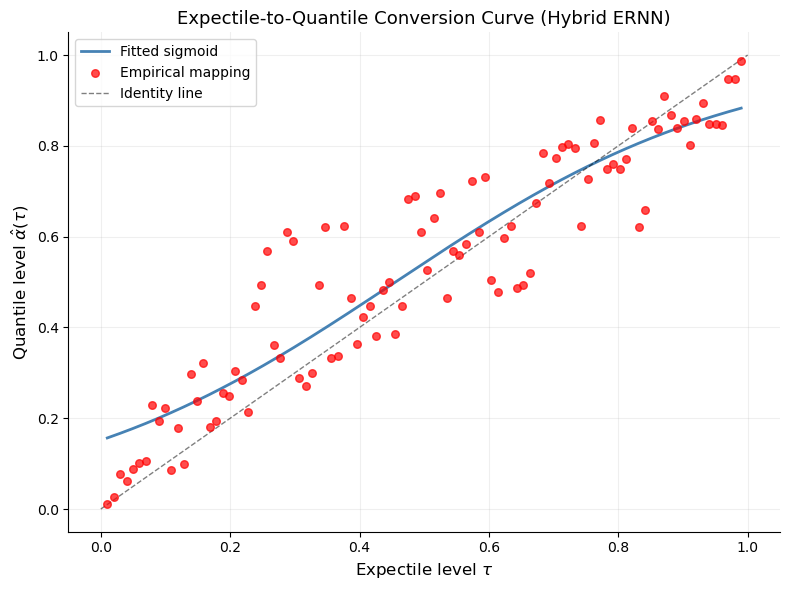


Conversion map saved to conversion_map.csv


In [84]:
# Use tau=0.25 as fixed base architecture from new tuning
base_config = best_configs2[0.250].copy()

tau_grid = np.linspace(0.01, 0.99, 100)  # 100 points
conversion_results = {}

print("Training conversion models across tau grid...")
for i, tau in enumerate(tau_grid):
    config = base_config.copy()
    config['patience'] = 30

    # Train 3 seeds, take median coverage
    coverages = []
    for seed in [2025, 2026, 2027]:
        torch.manual_seed(seed)
        model = HybridERNN(X_train.shape[1], config)

        if config['optimizer'] == 'adam':
            optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                         weight_decay=config['weight_decay'])
        else:
            optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                          weight_decay=config['weight_decay'])

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', patience=15, factor=0.5, min_lr=1e-6)

        best_val_loss    = float('inf')
        patience_counter = 0
        best_model_state = None

        for epoch in range(300):
            model.train()
            optimizer.zero_grad()
            e_hybrid, sigma = model(y_train, X_train)
            loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

            if torch.isnan(loss) or torch.isinf(loss):
                break

            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
            optimizer.step()

            model.eval()
            with torch.no_grad():
                e_val, sigma_val = model(y_val, X_val)
                val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

            scheduler.step(val_loss)

            if val_loss < best_val_loss:
                best_val_loss    = val_loss.item()
                patience_counter = 0
                best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
            else:
                patience_counter += 1
                if patience_counter >= 30:
                    break

        if best_model_state is not None:
            model.load_state_dict(best_model_state)

        model.eval()
        with torch.no_grad():
            e_val_pred, _ = model(y_val, X_val)
            e_val_np      = e_val_pred.numpy().flatten()
            y_val_np      = y_val.numpy().flatten()
            coverage      = np.mean(y_val_np <= e_val_np)
            coverages.append(coverage)

    empirical_coverage = np.median(coverages)
    conversion_results[tau] = empirical_coverage

    if (i + 1) % 10 == 0:
        print(f"  Completed {i+1}/100 | tau={tau:.3f} -> alpha={empirical_coverage:.4f} "
              f"(seeds: {[f'{c:.3f}' for c in coverages]})")

print("Done!")

# Arrays
tau_arr   = np.array(list(conversion_results.keys()))
alpha_arr = np.array(list(conversion_results.values()))

# Check monotonicity
diffs        = np.diff(alpha_arr)
n_violations = np.sum(diffs < 0)
print(f"\nMonotonicity violations: {n_violations}/{len(diffs)}")

print("\nSample conversion points:")
for t, a in zip(tau_arr[::10], alpha_arr[::10]):
    print(f"  tau={t:.3f} -> alpha={a:.4f}")

# Fit sigmoid
from scipy.special import expit
from scipy.optimize import curve_fit

def sigmoid_func(x, a, b):
    return expit(a * (x - b))

popt, _ = curve_fit(sigmoid_func, tau_arr, alpha_arr, p0=[1.0, 0.5])
print(f"\nSigmoid params: a={popt[0]:.4f}, b={popt[1]:.4f}")

# Plot
tau_fine     = np.linspace(0.01, 0.99, 500)
alpha_fitted = sigmoid_func(tau_fine, *popt)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(tau_fine, alpha_fitted, color='steelblue', linewidth=2, label='Fitted sigmoid')
ax.scatter(tau_arr, alpha_arr, color='red', zorder=5, s=30, alpha=0.7, label='Empirical mapping')
ax.plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5, label='Identity line')
ax.set_xlabel(r'Expectile level $\tau$', fontsize=12)
ax.set_ylabel(r'Quantile level $\hat{\alpha}(\tau)$', fontsize=12)
ax.set_title('Expectile-to-Quantile Conversion Curve (Hybrid ERNN)', fontsize=13)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('conversion_curve.png', dpi=300, bbox_inches='tight')
plt.show()

# Save
conversion_df = pd.DataFrame({'tau': tau_arr, 'alpha_hat': alpha_arr})
conversion_df.to_csv('conversion_map.csv', index=False)
print("\nConversion map saved to conversion_map.csv")

### Changed evaluation strategy - ranking method

In [19]:
class HybridERNN(nn.Module):
    def __init__(self, input_dim, config):
        super().__init__()

        # Fixed initialisations -- estimated during training, not tuned by Optuna
        self.gamma1_raw = nn.Parameter(torch.tensor(1.386))   
        self.gamma2_raw = nn.Parameter(torch.tensor(0.3))
        self.psi_raw    = nn.Parameter(torch.tensor(0.0))     
        self.sigma_raw  = nn.Parameter(torch.tensor(0.5))

        # Build FNN
        layers = []
        prev_dim = input_dim
        n_hidden = config['n_hidden_layers']

        for i in range(n_hidden):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._get_activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            prev_dim = hidden_dim

        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)

        for m in self.fnn.modules():
            if isinstance(m, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(m.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())

    def forward(self, y, X):
        gamma1 = torch.sigmoid(self.gamma1_raw)
        gamma2 = torch.nn.functional.softplus(self.gamma2_raw)
        psi    = torch.sigmoid(self.psi_raw)
        sigma  = torch.nn.functional.softplus(self.sigma_raw)

        e_hybrid, e_care = compute_hybrid_location(y, X, gamma1, gamma2, self.fnn, psi)

        return e_hybrid, sigma


def compute_crp(y, q, alpha):
    """
    Coverage Ratio Penalty (CRP).
    For alpha <= 0.5: count violations where y <= q (lower tail).
    For alpha >  0.5: count violations where y >  q (upper tail).
    CRP = empirical_coverage / alpha*
    Penalty = (CRP - 1)^2
    """
    if alpha <= 0.5:
        empirical  = (y <= q).float().mean().item()
        alpha_star = alpha
    else:
        empirical  = (y > q).float().mean().item()
        alpha_star = 1.0 - alpha

    crp     = empirical / alpha_star
    penalty = (crp - 1.0) ** 2
    return crp, penalty


def objective(trial, tau):
    # Optuna only tunes architecture and training hyperparameters
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation':      trial.suggest_categorical('activation', ['relu', 'elu', 'gelu', 'tanh']),
        'dropout':         trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm':       trial.suggest_categorical('layernorm', [True, False]),
        'weight_init':     trial.suggest_categorical('weight_init', ['glorot', 'he']),
        'lr':              trial.suggest_float('lr', 1e-4, 5e-2, log=True),  # extended upper bound
        'optimizer':       trial.suggest_categorical('optimizer', ['adam', 'adamw']),
        'batch_size':      trial.suggest_categorical('batch_size', [32, 64, 128]),
        'weight_decay':    trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip':   trial.suggest_categorical('gradient_clip', [0.1, 1.0, 5.0]),
        'patience':        trial.suggest_categorical('patience', [10, 20, 30]),
    }
    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(f'hidden_dim_{i}', 32, 256)

    input_dim = X_train.shape[1]
    torch.manual_seed(2026)
    model = HybridERNN(input_dim, config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = config['patience']
    max_epochs       = 200
    best_model_state = None

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

        if torch.isnan(loss) or torch.isinf(loss):
            return float('inf')

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()

        # early stopping uses AGD NLL only
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    # compute NLL and CRP after best model loaded
    with torch.no_grad():
        e_val, sigma_val = model(y_val, X_val)
        val_loss         = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        crp, crp_penalty = compute_crp(y_val, e_val, tau)

        gamma1 = torch.sigmoid(model.gamma1_raw).item()
        gamma2 = torch.nn.functional.softplus(model.gamma2_raw).item()
        psi    = torch.sigmoid(model.psi_raw).item()
        sigma  = torch.nn.functional.softplus(model.sigma_raw).item()

    # store NLL and CRP in trial user_attrs for ranking after all trials finish
    trial.set_user_attr('nll',         val_loss.item())
    trial.set_user_attr('crp',         crp)
    trial.set_user_attr('crp_penalty', crp_penalty)
    trial.set_user_attr('gamma1',      gamma1)
    trial.set_user_attr('gamma2',      gamma2)
    trial.set_user_attr('psi',         psi)
    trial.set_user_attr('sigma',       sigma)

    print(f"  Trial {trial.number}: "
          f"NLL={val_loss.item():.4f} | "
          f"CRP={crp:.4f} | "
          f"CRP_penalty={crp_penalty:.4f} | "
          f"tau={tau} | lr={config['lr']:.5f} | "
          f"layers={config['n_hidden_layers']} | "
          f"activation={config['activation']} | "
          f"dropout={config['dropout']:.3f} | "
          f"psi={psi:.4f} | sigma={sigma:.4f} | "
          f"gamma1={gamma1:.4f} | gamma2={gamma2:.4f}")

    # Optuna minimises NLL only -- ranking done after all trials
    return val_loss.item()


def select_best_trial_by_rank(study):
    """
    Rank all completed trials by NLL and CRP_penalty separately.
    Select trial with lowest sum of ranks.
    Tiebreak: raw NLL, then raw CRP_penalty, then trial number.
    """
    trials = [t for t in study.trials
              if t.state == optuna.trial.TrialState.COMPLETE
              and t.value != float('inf')]

    for t in trials:
        t._nll         = t.user_attrs['nll']
        t._crp_penalty = t.user_attrs['crp_penalty']

    # rank by NLL ascending -- rank 1 = lowest NLL
    for rank, t in enumerate(sorted(trials, key=lambda t: t._nll), start=1):
        t._rank_nll = rank

    # rank by CRP_penalty ascending -- rank 1 = closest to perfect coverage
    for rank, t in enumerate(sorted(trials, key=lambda t: t._crp_penalty), start=1):
        t._rank_crp = rank

    # select by minimum sum of ranks with tiebreakers
    best = min(trials, key=lambda t: (
        t._rank_nll + t._rank_crp,
        t._nll,
        t._crp_penalty,
        t.number
    ))

    return best, trials


# -------------------------
# Run tuning for each tau level
# -------------------------
tau_levels    = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
base_seed     = 2026
best_configs2 = {}

for i, tau in enumerate(tau_levels):
    print(f"\n{'='*60}")
    print(f"Tuning for tau = {tau} (seed = {base_seed + i})")
    print(f"{'='*60}")

    sampler = TPESampler(seed=base_seed + i)
    study   = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lambda trial, t=tau: objective(trial, tau=t),
                   n_trials=200, show_progress_bar=True)

    # rank-based selection after all trials finish
    best_trial, all_trials = select_best_trial_by_rank(study)

    # print ranking summary
    print(f"\nRanking summary for tau={tau}:")
    print(f"  {'Trial':>6} {'NLL':>8} {'NLL_rank':>9} {'CRP_pen':>9} {'CRP_rank':>9} {'Sum_rank':>9}")
    sorted_trials = sorted(all_trials, key=lambda t: t._rank_nll + t._rank_crp)
    for t in sorted_trials[:10]:
        print(f"  {t.number:>6} {t._nll:>8.4f} {t._rank_nll:>9} "
              f"{t._crp_penalty:>9.4f} {t._rank_crp:>9} "
              f"{t._rank_nll + t._rank_crp:>9}")

    # save full ranking for all trials to CSV
    ranking_records = []
    for t in all_trials:
        record = {
            'tau':         tau,
            'trial':       t.number,
            'nll':         t._nll,
            'crp':         t.user_attrs['crp'],
            'crp_penalty': t._crp_penalty,
            'rank_nll':    t._rank_nll,
            'rank_crp':    t._rank_crp,
            'sum_rank':    t._rank_nll + t._rank_crp,
            'gamma1':      t.user_attrs['gamma1'],
            'gamma2':      t.user_attrs['gamma2'],
            'psi':         t.user_attrs['psi'],
            'sigma':       t.user_attrs['sigma'],
        }
        record.update(t.params)
        ranking_records.append(record)

    ranking_df = pd.DataFrame(ranking_records)
    ranking_df = ranking_df.sort_values('sum_rank')
    ranking_df.to_csv(f'ernn_ranking_tau_{tau}.csv', index=False)
    print(f"  Full ranking saved to ernn_ranking_tau_{tau}.csv")

    best_configs2[tau] = best_trial.params.copy()
    best_configs2[tau]['tau'] = tau

    # re-run best config to extract estimated parameters
    torch.manual_seed(2026)
    best_model = HybridERNN(X_train.shape[1], best_configs2[tau])

    if best_configs2[tau]['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(best_model.parameters(),
                                     lr=best_configs2[tau]['lr'],
                                     weight_decay=best_configs2[tau]['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(best_model.parameters(),
                                      lr=best_configs2[tau]['lr'],
                                      weight_decay=best_configs2[tau]['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(200):
        best_model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = best_model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        if torch.isnan(loss) or torch.isinf(loss):
            break
        loss.backward()
        nn.utils.clip_grad_norm_(best_model.parameters(),
                                  best_configs2[tau]['gradient_clip'])
        optimizer.step()

        best_model.eval()
        with torch.no_grad():
            e_val, sigma_val = best_model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in best_model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= best_configs2[tau].get('patience', 20):
                break

    if best_model_state is not None:
        best_model.load_state_dict(best_model_state)

    with torch.no_grad():
        e_val_final, sigma_val_final = best_model(y_val, X_val)
        final_nll                    = hybrid_ernn_loss(y_val, e_val_final, sigma_val_final, tau).item()
        final_crp, final_crp_penalty = compute_crp(y_val, e_val_final, tau)

        est_gamma1 = torch.sigmoid(best_model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(best_model.gamma2_raw).item()
        est_psi    = torch.sigmoid(best_model.psi_raw).item()
        est_sigma  = torch.nn.functional.softplus(best_model.sigma_raw).item()

    best_configs2[tau]['est_psi']    = est_psi
    best_configs2[tau]['est_sigma']  = est_sigma
    best_configs2[tau]['est_gamma1'] = est_gamma1
    best_configs2[tau]['est_gamma2'] = est_gamma2
    best_configs2[tau]['est_crp']    = final_crp

    print(f"\nBest trial (rank-based): #{best_trial.number}")
    print(f"  NLL rank: {best_trial._rank_nll} | CRP rank: {best_trial._rank_crp} | "
          f"Sum: {best_trial._rank_nll + best_trial._rank_crp}")
    print(f"Final NLL:          {final_nll:.4f}")
    print(f"Final CRP:          {final_crp:.4f}")
    print(f"Final CRP penalty:  {final_crp_penalty:.4f}")
    print(f"Best params: {best_trial.params}")
    print(f"Estimated psi:    {est_psi:.4f}")
    print(f"Estimated sigma:  {est_sigma:.4f}")
    print(f"Estimated gamma1: {est_gamma1:.4f}")
    print(f"Estimated gamma2: {est_gamma2:.4f}")

print("\n" + "="*60)
print("TUNING COMPLETE — BEST CONFIGS2 PER TAU")
print("="*60)
for tau, config in best_configs2.items():
    print(f"tau={tau}: {config}")

[I 2026-07-06 12:11:05,158] A new study created in memory with name: no-name-0fbcc28f-60bf-40e4-a0be-e4b4610b13c9



Tuning for tau = 0.025 (seed = 2026)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=1.7620 | CRP=0.0883 | CRP_penalty=0.8312 | tau=0.025 | lr=0.00066 | layers=1 | activation=elu | dropout=0.494 | psi=0.5222 | sigma=0.8937 | gamma1=0.7856 | gamma2=0.8123
[I 2026-07-06 12:11:19,513] Trial 0 finished with value: 1.7619870901107788 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.0006552020421842752, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 5.618938892024055e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 176}. Best is trial 0 with value: 1.7619870901107788.
  Trial 1: NLL=1.7816 | CRP=0.0883 | CRP_penalty=0.8312 | tau=0.025 | lr=0.00050 | layers=1 | activation=relu | dropout=0.341 | psi=0.5131 | sigma=0.9125 | gamma1=0.7931 | gamma2=0.8409
[I 2026-07-06 12:11:33,821] Trial 1 finished with value: 1.7816129922866821 and parameters: {'n_hidden_layers': 1, 'activation': 'relu', 'dropout': 0.3412887415864622, 'layernorm': True, 'weight_init': 'gl

[I 2026-07-06 13:00:51,398] A new study created in memory with name: no-name-278fad54-8e51-451d-830e-8ac8aac8c009



Best trial (rank-based): #88
  NLL rank: 8 | CRP rank: 70 | Sum: 78
Final NLL:          -2.3497
Final CRP:          2.5607
Final CRP penalty:  2.4358
Best params: {'n_hidden_layers': 1, 'activation': 'gelu', 'dropout': 0.1949656380533914, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.047045935846046584, 'optimizer': 'adamw', 'batch_size': 64, 'weight_decay': 4.470726489842773e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 233}
Estimated psi:    0.9413
Estimated sigma:  0.0115
Estimated gamma1: 0.0314
Estimated gamma2: 0.1034

Tuning for tau = 0.05 (seed = 2027)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=1.4221 | CRP=0.1766 | CRP_penalty=0.6780 | tau=0.05 | lr=0.00101 | layers=3 | activation=relu | dropout=0.055 | psi=0.5197 | sigma=0.8505 | gamma1=0.7916 | gamma2=0.8278
[I 2026-07-06 13:01:08,448] Trial 0 finished with value: 1.422074794769287 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.05498225107357002, 'layernorm': True, 'weight_init': 'he', 'lr': 0.001007193483885585, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 8.394244804000419e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 65, 'hidden_dim_1': 240, 'hidden_dim_2': 130}. Best is trial 0 with value: 1.422074794769287.
  Trial 1: NLL=1.5520 | CRP=1.1921 | CRP_penalty=0.0369 | tau=0.05 | lr=0.00030 | layers=1 | activation=relu | dropout=0.307 | psi=0.5025 | sigma=0.9674 | gamma1=0.7986 | gamma2=0.8538
[I 2026-07-06 13:01:12,101] Trial 1 finished with value: 1.5519813299179077 and parameters: {'n_hidden_layers': 1, 'activation': 'relu', 'dropout': 0.3066270413055572,

[I 2026-07-06 13:51:41,410] A new study created in memory with name: no-name-c2ddbf2c-ae10-43cf-a76e-667c3432cb48



Best trial (rank-based): #42
  NLL rank: 17 | CRP rank: 4 | Sum: 21
Final NLL:          -2.3158
Final CRP:          1.1038
Final CRP penalty:  0.0108
Best params: {'n_hidden_layers': 2, 'activation': 'elu', 'dropout': 0.4424578713034458, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.04318807773171477, 'optimizer': 'adam', 'batch_size': 32, 'weight_decay': 1.0196357671399871e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 93, 'hidden_dim_1': 59}
Estimated psi:    0.9527
Estimated sigma:  0.0161
Estimated gamma1: 0.1039
Estimated gamma2: 0.1406

Tuning for tau = 0.25 (seed = 2028)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=0.9746 | CRP=2.5430 | CRP_penalty=2.3810 | tau=0.25 | lr=0.00022 | layers=1 | activation=elu | dropout=0.167 | psi=0.5034 | sigma=0.9469 | gamma1=0.7987 | gamma2=0.8539
[I 2026-07-06 13:51:57,624] Trial 0 finished with value: 0.9746183156967163 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.16735790150049712, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.00021817327615682693, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 2.75565716153528e-05, 'gradient_clip': 5.0, 'patience': 10, 'hidden_dim_0': 120}. Best is trial 0 with value: 0.9746183156967163.
  Trial 1: NLL=-1.9167 | CRP=0.8653 | CRP_penalty=0.0181 | tau=0.25 | lr=0.01842 | layers=3 | activation=relu | dropout=0.306 | psi=0.5632 | sigma=0.0452 | gamma1=0.7066 | gamma2=0.1071
[I 2026-07-06 13:52:15,921] Trial 1 finished with value: -1.916741132736206 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.30642791197260977, 'layernorm': True, 'weight_init

[I 2026-07-06 16:28:08,995] A new study created in memory with name: no-name-21f79a02-92e8-4122-9a8e-c438ffc1e720



Best trial (rank-based): #122
  NLL rank: 14 | CRP rank: 10 | Sum: 24
Final NLL:          -2.5486
Final CRP:          0.9801
Final CRP penalty:  0.0004
Best params: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.20316049421255342, 'layernorm': False, 'weight_init': 'he', 'lr': 0.049896487260106696, 'optimizer': 'adamw', 'batch_size': 64, 'weight_decay': 2.723157403667758e-05, 'gradient_clip': 0.1, 'patience': 20, 'hidden_dim_0': 140}
Estimated psi:    0.9643
Estimated sigma:  0.0213
Estimated gamma1: 0.0197
Estimated gamma2: 0.0782

Tuning for tau = 0.5 (seed = 2029)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=-0.1976 | CRP=1.5188 | CRP_penalty=0.2691 | tau=0.5 | lr=0.00702 | layers=1 | activation=elu | dropout=0.276 | psi=0.5957 | sigma=0.3261 | gamma1=0.7411 | gamma2=0.6522
[I 2026-07-06 16:28:24,455] Trial 0 finished with value: -0.1975734382867813 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.2759148998079755, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.007024831190142553, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 7.593227914398959e-06, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 137}. Best is trial 0 with value: -0.1975734382867813.
  Trial 1: NLL=-0.0360 | CRP=1.0773 | CRP_penalty=0.0060 | tau=0.5 | lr=0.00626 | layers=2 | activation=gelu | dropout=0.254 | psi=0.4795 | sigma=0.3841 | gamma1=0.7318 | gamma2=0.6206
[I 2026-07-06 16:28:41,068] Trial 1 finished with value: -0.03599494323134422 and parameters: {'n_hidden_layers': 2, 'activation': 'gelu', 'dropout': 0.2537982409470424, 'layernorm': False, 'weight_init

[I 2026-07-06 17:17:23,511] A new study created in memory with name: no-name-d4fbbafe-f153-4699-9cab-db8897028b82



Best trial (rank-based): #196
  NLL rank: 4 | CRP rank: 12 | Sum: 16
Final NLL:          -2.6029
Final CRP:          1.0110
Final CRP penalty:  0.0001
Best params: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.1932174351900203, 'layernorm': False, 'weight_init': 'he', 'lr': 0.04963352057908275, 'optimizer': 'adamw', 'batch_size': 128, 'weight_decay': 7.612070928373649e-06, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 253}
Estimated psi:    0.9767
Estimated sigma:  0.0223
Estimated gamma1: 0.0370
Estimated gamma2: 0.0999

Tuning for tau = 0.75 (seed = 2030)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=0.3458 | CRP=3.2406 | CRP_penalty=5.0204 | tau=0.75 | lr=0.00446 | layers=2 | activation=tanh | dropout=0.118 | psi=0.6102 | sigma=0.5038 | gamma1=0.7327 | gamma2=0.7008
[I 2026-07-06 17:17:40,411] Trial 0 finished with value: 0.3457859754562378 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11794446303511014, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.004456352949789044, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 8.793881352151788e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 111, 'hidden_dim_1': 185}. Best is trial 0 with value: 0.3457859754562378.
  Trial 1: NLL=1.0053 | CRP=1.2362 | CRP_penalty=0.0558 | tau=0.75 | lr=0.00014 | layers=3 | activation=gelu | dropout=0.156 | psi=0.5003 | sigma=0.9733 | gamma1=0.7998 | gamma2=0.8545
[I 2026-07-06 17:17:41,986] Trial 1 finished with value: 1.0053452253341675 and parameters: {'n_hidden_layers': 3, 'activation': 'gelu', 'dropout': 0.15561732761526953, 'layernorm': 

[I 2026-07-06 18:07:38,867] A new study created in memory with name: no-name-4808369f-5e3b-4246-91ba-5a85edb483a1



Best trial (rank-based): #147
  NLL rank: 11 | CRP rank: 11 | Sum: 22
Final NLL:          -2.5619
Final CRP:          1.0243
Final CRP penalty:  0.0006
Best params: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.35006787348443436, 'layernorm': False, 'weight_init': 'he', 'lr': 0.04962045679540033, 'optimizer': 'adamw', 'batch_size': 32, 'weight_decay': 9.804772074072501e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 240}
Estimated psi:    0.9632
Estimated sigma:  0.0210
Estimated gamma1: 0.0661
Estimated gamma2: 0.1114

Tuning for tau = 0.95 (seed = 2031)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=0.4156 | CRP=0.5740 | CRP_penalty=0.1815 | tau=0.95 | lr=0.00703 | layers=2 | activation=tanh | dropout=0.112 | psi=0.5203 | sigma=0.3105 | gamma1=0.7833 | gamma2=0.7521
[I 2026-07-06 18:07:55,286] Trial 0 finished with value: 0.4156031608581543 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11155263989652436, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.007027131382827591, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 3.1297438535544123e-06, 'gradient_clip': 1.0, 'patience': 10, 'hidden_dim_0': 187, 'hidden_dim_1': 217}. Best is trial 0 with value: 0.4156031608581543.
  Trial 1: NLL=0.7105 | CRP=4.2826 | CRP_penalty=10.7752 | tau=0.95 | lr=0.00544 | layers=2 | activation=tanh | dropout=0.041 | psi=0.5227 | sigma=0.4174 | gamma1=0.7821 | gamma2=0.8018
[I 2026-07-06 18:08:11,329] Trial 1 finished with value: 0.7104777693748474 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.04083183838368104, 'layernorm

[I 2026-07-06 18:58:09,169] A new study created in memory with name: no-name-171d3595-0d3a-4816-9a73-880b5b0653fe



Best trial (rank-based): #107
  NLL rank: 29 | CRP rank: 16 | Sum: 45
Final NLL:          -2.4324
Final CRP:          1.1479
Final CRP penalty:  0.0219
Best params: {'n_hidden_layers': 1, 'activation': 'gelu', 'dropout': 0.0005386020406473388, 'layernorm': False, 'weight_init': 'he', 'lr': 0.04399415302754356, 'optimizer': 'adam', 'batch_size': 64, 'weight_decay': 2.717212846340701e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 249}
Estimated psi:    0.9349
Estimated sigma:  0.0130
Estimated gamma1: 0.0631
Estimated gamma2: 0.1134

Tuning for tau = 0.975 (seed = 2032)


  0%|          | 0/200 [00:00<?, ?it/s]

  Trial 0: NLL=0.6302 | CRP=0.4415 | CRP_penalty=0.3119 | tau=0.975 | lr=0.00741 | layers=3 | activation=relu | dropout=0.111 | psi=0.5181 | sigma=0.2883 | gamma1=0.7828 | gamma2=0.7191
[I 2026-07-06 18:58:26,348] Trial 0 finished with value: 0.6301587224006653 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.11110238679748752, 'layernorm': False, 'weight_init': 'he', 'lr': 0.007412946243424984, 'optimizer': 'adam', 'batch_size': 128, 'weight_decay': 7.766054095562223e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 195, 'hidden_dim_1': 201, 'hidden_dim_2': 229}. Best is trial 0 with value: 0.6301587224006653.
  Trial 1: NLL=1.8327 | CRP=4.9448 | CRP_penalty=15.5615 | tau=0.975 | lr=0.00011 | layers=1 | activation=elu | dropout=0.061 | psi=0.5026 | sigma=0.9599 | gamma1=0.7987 | gamma2=0.8574
[I 2026-07-06 18:58:42,794] Trial 1 finished with value: 1.8326568603515625 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.061175951335

In [29]:
configs_rows = []
for tau, config in best_configs2.items():
    row = {'tau': tau}
    row.update(config)
    configs_rows.append(row)

configs_df = pd.DataFrame(configs_rows)
configs_df = configs_df.set_index('tau')
configs_df

,n_hidden_layers,activation,dropout,layernorm,weight_init,lr,optimizer,batch_size,weight_decay,gradient_clip,patience,hidden_dim_0,est_psi,est_sigma,est_gamma1,est_gamma2,est_crp,hidden_dim_1
tau,,,,,,,,,,,,,,,,,,
0.025,1,gelu,0.194966,False,glorot,0.047046,adamw,64,0.000045,0.1,30,233,0.941322,0.011465,0.031391,0.103358,2.560706,NaN
0.050,2,elu,0.442458,False,glorot,0.043188,adam,32,0.000010,1.0,20,93,0.952719,0.016087,0.103932,0.140631,1.103753,59.0
0.250,1,elu,0.203160,False,he,0.049896,adamw,64,0.000027,0.1,20,140,0.964279,0.021285,0.019655,0.078208,0.980132,NaN
0.500,1,tanh,0.193217,False,he,0.049634,adamw,128,0.000008,0.1,30,253,0.976651,0.022275,0.036993,0.099906,1.011037,NaN
0.750,1,tanh,0.350068,False,he,0.049620,adamw,32,0.000098,1.0,30,240,0.963246,0.020969,0.066066,0.111393,1.024283,NaN
0.950,1,gelu,0.000539,False,he,0.043994,adam,64,0.000027,1.0,20,249,0.934896,0.013031,0.063128,0.113358,1.147903,NaN
0.975,1,elu,0.027289,False,he,0.044787,adam,32,0.000017,1.0,20,84,0.955633,0.011261,0.026870,0.051637,1.589404,NaN



Training final model for tau = 0.025
  Epoch 50: train=1.5085, val=1.4987
  Epoch 100: train=1.0934, val=1.0818
  Epoch 150: train=0.6210, val=0.6097
  Epoch 200: train=0.1129, val=0.0989
  Test loss: 0.0991

Training final model for tau = 0.05
  Epoch 50: train=1.2192, val=1.2118
  Epoch 100: train=0.8147, val=0.8061
  Epoch 150: train=0.3552, val=0.3455
  Epoch 200: train=-0.1438, val=-0.1553
  Test loss: -0.1564

Training final model for tau = 0.25
  Epoch 50: train=0.6738, val=0.6501
  Epoch 100: train=0.2193, val=0.2046
  Epoch 150: train=-0.2675, val=-0.2845
  Epoch 200: train=-0.7740, val=-0.7965
  Test loss: -0.7982

Training final model for tau = 0.5
  Epoch 50: train=0.5812, val=0.5669
  Epoch 100: train=0.1488, val=0.1368
  Epoch 150: train=-0.3270, val=-0.3403
  Epoch 200: train=-0.8203, val=-0.8436
  Test loss: -0.8464

Training final model for tau = 0.75
  Epoch 50: train=0.6680, val=0.6579
  Epoch 100: train=0.2599, val=0.2492
  Epoch 150: train=-0.1990, val=-0.2101
  E

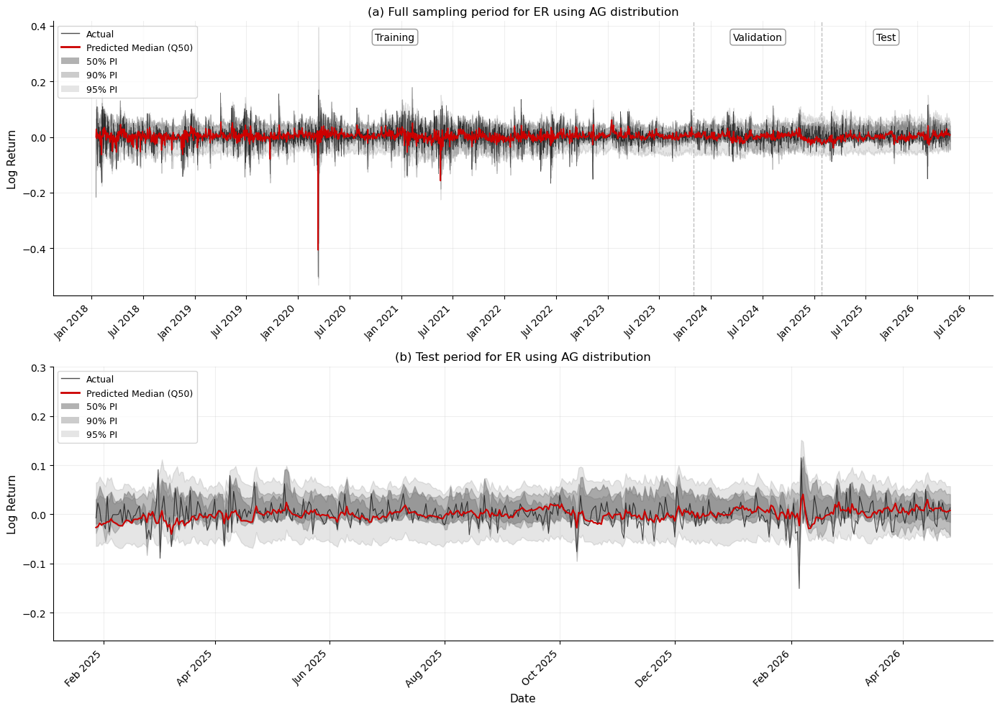

In [148]:
def train_final_model(tau, config, y_train, X_train, y_val, X_val, y_test, X_test):
    torch.manual_seed(2026)
    input_dim = X_train.shape[1]
    model = HybridERNN(input_dim, config)
    
    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])
    
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 30
    max_epochs = 200
    best_model_state = None
    train_losses, val_losses = [], []
    
    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)
        
        if torch.isnan(loss) or torch.isinf(loss):
            print(f"  NaN/Inf at epoch {epoch}, stopping")
            break
        
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        train_losses.append(loss.item())
        
        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)
        
        val_losses.append(val_loss.item())
        scheduler.step(val_loss)
        
        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: train={loss.item():.4f}, val={val_loss.item():.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch+1}")
                break
    
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    # Test evaluation
    model.eval()
    with torch.no_grad():
        e_test, sigma_test = model(y_test, X_test)
        test_loss = hybrid_ernn_loss(y_test, e_test, sigma_test, tau)
    
    print(f"  Test loss: {test_loss.item():.4f}")
    
    return model, train_losses, val_losses, e_test.numpy()


# Convert test tensors
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

# Train all tau levels
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
results = {}

for tau in tau_levels:
    print(f"\n{'='*60}")
    print(f"Training final model for tau = {tau}")
    print(f"{'='*60}")
    config = best_configs2[tau]
    model, train_losses, val_losses, e_test_pred = train_final_model(
        tau, config, y_train, X_train, y_val, X_val, y_test, X_test)
    results[tau] = {
        'model': model,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'e_test': e_test_pred
    }


# ============================================================
# Plotting
# ============================================================
import matplotlib.dates as mdates
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols):
    
    actual_color = '#000000'
    pred_color = '#CC0000'
    pi_color = '#808080'
    
    # Get full predictions for all data
    all_preds = {}
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)
    
    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()
        with torch.no_grad():
            e_all, _ = model(y_all, X_all)
            all_preds[tau] = e_all.numpy()
    
    all_dates = df.index
    train_size = len(train_df)
    val_size = len(val_df)
    y_all_np = df['log_return'].values
    
    have_95 = (0.025 in all_preds) and (0.975 in all_preds)
    have_90 = (0.05 in all_preds) and (0.95 in all_preds)
    have_50 = (0.25 in all_preds) and (0.75 in all_preds)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    # ---- Panel (a): Full period ----
    ax = axes[0]
    y_min, y_max = y_all_np.min(), y_all_np.max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.35 * y_range)
    
    ax.plot(all_dates, y_all_np, color=actual_color, linewidth=0.5, alpha=0.7, label='Actual')
    ax.plot(all_dates, all_preds[0.5], color=pred_color, linewidth=1.2, label='Predicted Median (Q50)')
    
    if have_95:
        ax.fill_between(all_dates, all_preds[0.025], all_preds[0.975], color=pi_color, alpha=0.2)
    if have_90:
        ax.fill_between(all_dates, all_preds[0.05], all_preds[0.95], color=pi_color, alpha=0.4)
    if have_50:
        ax.fill_between(all_dates, all_preds[0.25], all_preds[0.75], color=pi_color, alpha=0.6)
    
    ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axvline(x=val_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    
    y_label = y_max + 0.25 * y_range
    ax.text(train_df.index[len(train_df)//2], y_label, 'Training',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(val_df.index[len(val_df)//2], y_label, 'Validation',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(test_df.index[len(test_df)//2], y_label, 'Test',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    legend_elements = [
        Line2D([0], [0], color=actual_color, lw=1, alpha=0.7, label='Actual'),
        Line2D([0], [0], color=pred_color, lw=2, label='Predicted Median (Q50)'),
    ]
    if have_50: legend_elements.append(Patch(facecolor=pi_color, alpha=0.6, label='50% PI'))
    if have_90: legend_elements.append(Patch(facecolor=pi_color, alpha=0.4, label='90% PI'))
    if have_95: legend_elements.append(Patch(facecolor=pi_color, alpha=0.2, label='95% PI'))
    
    ax.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax.set_title('(a) Full sampling period for ER using AG distribution', fontsize=12)
    ax.set_ylabel('Log Return', fontsize=11)
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # ---- Panel (b): Test period ----
    ax2 = axes[1]
    test_dates = test_df.index
    y_test_np = test_df['log_return'].values
    
    y_min_t, y_max_t = y_test_np.min(), y_test_np.max()
    y_range_t = y_max_t - y_min_t
    ax2.set_ylim(y_min_t - 0.4 * y_range_t, y_max_t + 0.7 * y_range_t)
    
    ax2.plot(test_dates, y_test_np, color=actual_color, linewidth=0.8, alpha=0.7, label='Actual')
    ax2.plot(test_dates, all_preds[0.5][train_size + val_size:], color=pred_color, linewidth=1.5)
    
    if have_95:
        ax2.fill_between(test_dates, all_preds[0.025][train_size + val_size:],
                         all_preds[0.975][train_size + val_size:], color=pi_color, alpha=0.2)
    if have_90:
        ax2.fill_between(test_dates, all_preds[0.05][train_size + val_size:],
                         all_preds[0.95][train_size + val_size:], color=pi_color, alpha=0.4)
    if have_50:
        ax2.fill_between(test_dates, all_preds[0.25][train_size + val_size:],
                         all_preds[0.75][train_size + val_size:], color=pi_color, alpha=0.6)
    
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')
    
    ax2.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax2.set_title('(b) Test period for ER using AG distribution', fontsize=12)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('Log Return', fontsize=11)
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('hybrid_ernn_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()


# Run plotting
plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols)


Training final model for tau = 0.025
  Epoch 50: train=-0.0172, val=-0.0680
  Epoch 100: train=-1.6931, val=-1.7982
  Epoch 150: train=-1.6319, val=-2.1729
  Epoch 200: train=-2.1061, val=-2.3243
  Test loss: -2.3838 | gamma1=0.0314 | gamma2=0.1034 | psi=0.9413 | sigma=0.0115

Training final model for tau = 0.05
  Epoch 50: train=0.0432, val=-0.0066
  Epoch 100: train=-1.0249, val=-1.7264
  Epoch 150: train=-1.8277, val=-1.8110
  Epoch 200: train=0.4635, val=0.5730
  Test loss: -2.4241 | gamma1=0.1039 | gamma2=0.1406 | psi=0.9527 | sigma=0.0161

Training final model for tau = 0.25
  Epoch 50: train=-0.6004, val=-0.6621
  Epoch 100: train=-0.9317, val=-2.1550
  Epoch 150: train=-2.2665, val=-1.6949
  Epoch 200: train=-2.2309, val=-2.5374
  Test loss: -2.6537 | gamma1=0.0197 | gamma2=0.0782 | psi=0.9643 | sigma=0.0213

Training final model for tau = 0.5
  Epoch 50: train=-0.3017, val=-0.3451
  Epoch 100: train=-1.7178, val=-1.6375
  Epoch 150: train=-2.1831, val=-1.8782
  Epoch 200: tra

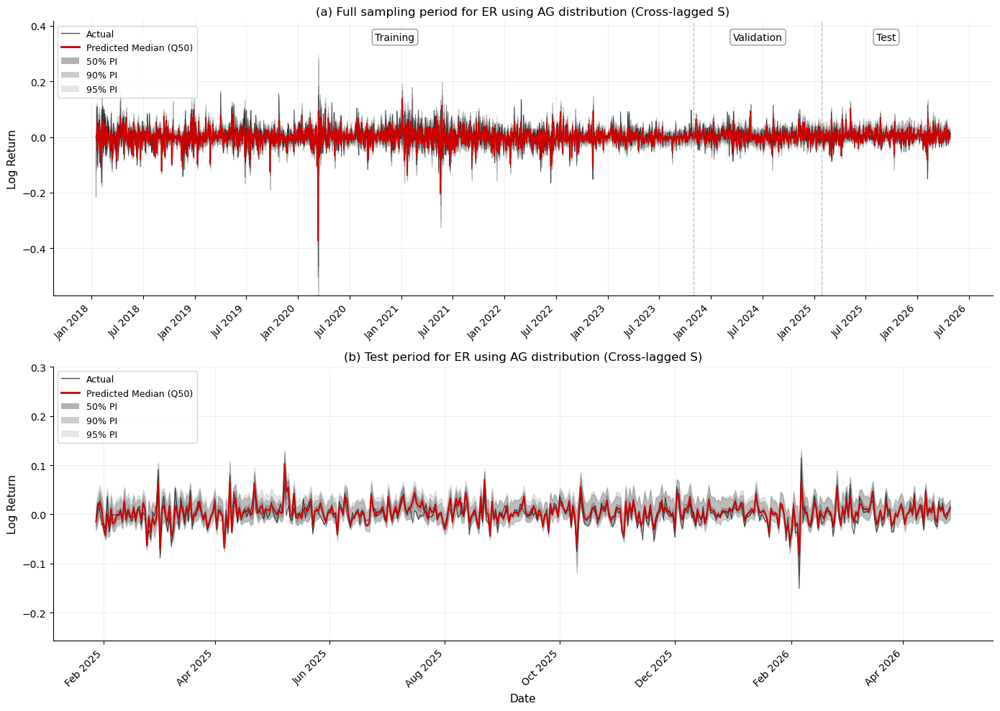


CROSSOVER ANALYSIS -- ERNN Cross S (TEST PERIOD, T=454)
              Pair   Violations    Pct (%)
  ------------------------------------------
  (0.025, 0.050):         382     84.14% <-- TAIL
  (0.050, 0.250):           1      0.22%
  (0.250, 0.500):          13      2.86%
  (0.500, 0.750):          16      3.52%
  (0.750, 0.950):           3      0.66%
  (0.950, 0.975):          71     15.64% <-- TAIL
  ------------------------------------------
  Total violations:         486  (17.84% of all pairs)
  Tail violations:          453  (49.89% of tail pairs)


In [27]:
def train_final_model(tau, config, y_train, X_train, y_val, X_val, y_test, X_test):
    torch.manual_seed(2026)
    input_dim = X_train.shape[1]
    model = HybridERNN(input_dim, config)

    if config['optimizer'] == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'],
                                     weight_decay=config['weight_decay'])
    else:
        optimizer = torch.optim.AdamW(model.parameters(), lr=config['lr'],
                                      weight_decay=config['weight_decay'])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6)

    best_val_loss    = float('inf')
    patience_counter = 0
    patience         = config.get('patience', 30)
    max_epochs       = 200
    best_model_state = None
    train_losses, val_losses = [], []

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        e_hybrid, sigma = model(y_train, X_train)
        loss = hybrid_ernn_loss(y_train, e_hybrid, sigma, tau)

        if torch.isnan(loss) or torch.isinf(loss):
            print(f"  NaN/Inf at epoch {epoch}, stopping")
            break

        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config['gradient_clip'])
        optimizer.step()
        train_losses.append(loss.item())

        model.eval()
        with torch.no_grad():
            e_val, sigma_val = model(y_val, X_val)
            val_loss = hybrid_ernn_loss(y_val, e_val, sigma_val, tau)

        val_losses.append(val_loss.item())
        scheduler.step(val_loss)

        if (epoch + 1) % 50 == 0:
            print(f"  Epoch {epoch+1}: train={loss.item():.4f}, val={val_loss.item():.4f}")

        if val_loss < best_val_loss:
            best_val_loss    = val_loss.item()
            patience_counter = 0
            best_model_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch+1}")
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    model.eval()
    with torch.no_grad():
        e_test, sigma_test = model(y_test, X_test)
        test_loss = hybrid_ernn_loss(y_test, e_test, sigma_test, tau)

    with torch.no_grad():
        est_gamma1 = torch.sigmoid(model.gamma1_raw).item()
        est_gamma2 = torch.nn.functional.softplus(model.gamma2_raw).item()
        est_psi    = torch.sigmoid(model.psi_raw).item()
        est_sigma  = torch.nn.functional.softplus(model.sigma_raw).item()

    print(f"  Test loss: {test_loss.item():.4f} | "
          f"gamma1={est_gamma1:.4f} | gamma2={est_gamma2:.4f} | "
          f"psi={est_psi:.4f} | sigma={est_sigma:.4f}")

    return model, train_losses, val_losses, e_test.numpy()


# -------------------------
# Convert test tensors
# -------------------------
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

# -------------------------
# Train all tau levels
# -------------------------
tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
results    = {}

for tau in tau_levels:
    print(f"\n{'='*60}")
    print(f"Training final model for tau = {tau}")
    print(f"{'='*60}")
    config = best_configs2[tau]
    model, train_losses, val_losses, e_test_pred = train_final_model(
        tau, config, y_train, X_train, y_val, X_val, y_test, X_test)
    results[tau] = {
        'model':        model,
        'train_losses': train_losses,
        'val_losses':   val_losses,
        'e_test':       e_test_pred
    }


# ============================================================
# Plotting
# ============================================================
import matplotlib.dates as mdates
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def plot_two_panel(results, train_df, val_df, test_df, tau_levels, feature_cols,
                   title_suffix='ER using AG distribution',
                   save_fname='hybrid_ernn_predictions.png'):

    actual_color = '#000000'
    pred_color   = '#CC0000'
    pi_color     = '#808080'

    all_preds = {}
    X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
    y_all = torch.tensor(df['log_return'].values, dtype=torch.float32)

    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()
        with torch.no_grad():
            e_all, _ = model(y_all, X_all)
            all_preds[tau] = e_all.numpy()

    all_dates  = df.index
    train_size = len(train_df)
    val_size   = len(val_df)
    y_all_np   = df['log_return'].values

    have_95 = (0.025 in all_preds) and (0.975 in all_preds)
    have_90 = (0.05  in all_preds) and (0.95  in all_preds)
    have_50 = (0.25  in all_preds) and (0.75  in all_preds)

    fig, axes = plt.subplots(2, 1, figsize=(14, 10))

    ax = axes[0]
    y_min, y_max = y_all_np.min(), y_all_np.max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.1 * y_range, y_max + 0.35 * y_range)

    ax.plot(all_dates, y_all_np, color=actual_color, linewidth=0.5, alpha=0.7, label='Actual')
    ax.plot(all_dates, all_preds[0.5], color=pred_color, linewidth=1.2, label='Predicted Median (Q50)')

    if have_95:
        ax.fill_between(all_dates, all_preds[0.025], all_preds[0.975], color=pi_color, alpha=0.2)
    if have_90:
        ax.fill_between(all_dates, all_preds[0.05],  all_preds[0.95],  color=pi_color, alpha=0.4)
    if have_50:
        ax.fill_between(all_dates, all_preds[0.25],  all_preds[0.75],  color=pi_color, alpha=0.6)

    ax.axvline(x=train_df.index[-1], color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axvline(x=val_df.index[-1],   color='gray', linestyle='--', alpha=0.5, linewidth=1)

    y_label = y_max + 0.25 * y_range
    ax.text(train_df.index[len(train_df)//2], y_label, 'Training',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(val_df.index[len(val_df)//2], y_label, 'Validation',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
    ax.text(test_df.index[len(test_df)//2], y_label, 'Test',
            ha='center', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))

    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

    legend_elements = [
        Line2D([0], [0], color=actual_color, lw=1, alpha=0.7, label='Actual'),
        Line2D([0], [0], color=pred_color,   lw=2,             label='Predicted Median (Q50)'),
    ]
    if have_50: legend_elements.append(Patch(facecolor=pi_color, alpha=0.6, label='50% PI'))
    if have_90: legend_elements.append(Patch(facecolor=pi_color, alpha=0.4, label='90% PI'))
    if have_95: legend_elements.append(Patch(facecolor=pi_color, alpha=0.2, label='95% PI'))

    ax.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax.set_title(f'(a) Full sampling period for {title_suffix}', fontsize=12)
    ax.set_ylabel('Log Return', fontsize=11)
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax2 = axes[1]
    test_dates = test_df.index
    y_test_np  = test_df['log_return'].values

    y_min_t, y_max_t = y_test_np.min(), y_test_np.max()
    y_range_t = y_max_t - y_min_t
    ax2.set_ylim(y_min_t - 0.4 * y_range_t, y_max_t + 0.7 * y_range_t)

    ax2.plot(test_dates, y_test_np, color=actual_color, linewidth=0.8, alpha=0.7, label='Actual')
    ax2.plot(test_dates, all_preds[0.5][train_size + val_size:],
             color=pred_color, linewidth=1.5)

    if have_95:
        ax2.fill_between(test_dates,
                         all_preds[0.025][train_size + val_size:],
                         all_preds[0.975][train_size + val_size:],
                         color=pi_color, alpha=0.2)
    if have_90:
        ax2.fill_between(test_dates,
                         all_preds[0.05][train_size + val_size:],
                         all_preds[0.95][train_size + val_size:],
                         color=pi_color, alpha=0.4)
    if have_50:
        ax2.fill_between(test_dates,
                         all_preds[0.25][train_size + val_size:],
                         all_preds[0.75][train_size + val_size:],
                         color=pi_color, alpha=0.6)

    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')

    ax2.legend(handles=legend_elements, loc='upper left', fontsize=9)
    ax2.set_title(f'(b) Test period for {title_suffix}', fontsize=12)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('Log Return', fontsize=11)
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.savefig(save_fname, dpi=300, bbox_inches='tight')
    print(f"Plot saved to {save_fname}")
    plt.show()

    return all_preds, train_size, val_size  # return for crossover analysis


# -------------------------
# Run plotting
# -------------------------
all_preds, train_size, val_size = plot_two_panel(
    results, train_df, val_df, test_df, tau_levels, feature_cols,
    title_suffix='ER using AG distribution (Cross-lagged S)',
    save_fname='hybrid_ernn_cross_s_predictions.png'
)


# ============================================================
# Crossover analysis -- test period, tail focused
# ============================================================
import numpy as np

def compute_crossovers(all_preds, levels, train_size, val_size, model_name='ERNN'):
    """
    Count crossover violations across adjacent levels on test period.
    Lower level should always be <= higher level.
    """
    # extract test period predictions
    preds = {lv: all_preds[lv][train_size + val_size:] for lv in levels}
    T = len(preds[levels[0]])

    adjacent_pairs = [
        (0.025, 0.050),
        (0.050, 0.250),
        (0.250, 0.500),
        (0.500, 0.750),
        (0.750, 0.950),
        (0.950, 0.975),
    ]

    tail_pairs = [(0.025, 0.050), (0.950, 0.975)]

    print(f"\n{'='*60}")
    print(f"CROSSOVER ANALYSIS -- {model_name} (TEST PERIOD, T={T})")
    print(f"{'='*60}")
    print(f"  {'Pair':>16} {'Violations':>12} {'Pct (%)':>10}")
    print(f"  {'-'*42}")

    total_violations = 0
    tail_violations  = 0

    for lo, hi in adjacent_pairs:
        violations = int(np.sum(preds[lo] > preds[hi]))
        pct        = violations / T * 100
        total_violations += violations
        marker = ' <-- TAIL' if (lo, hi) in tail_pairs else ''
        print(f"  ({lo:.3f}, {hi:.3f}):  {violations:>10}  {pct:>8.2f}%{marker}")
        if (lo, hi) in tail_pairs:
            tail_violations += violations

    print(f"  {'-'*42}")
    print(f"  Total violations:  {total_violations:>10}  "
          f"({total_violations / (T * len(adjacent_pairs)) * 100:.2f}% of all pairs)")
    print(f"  Tail violations:   {tail_violations:>10}  "
          f"({tail_violations / (T * 2) * 100:.2f}% of tail pairs)")

    return total_violations, tail_violations


total_viol, tail_viol = compute_crossovers(
    all_preds, tau_levels, train_size, val_size, model_name='ERNN Cross S'
)

In [31]:
import numpy as np


def compute_ase(y_true, e_pred, tau):
    """
    Asymmetric Squared Error for expectile evaluation.
    ASE = mean(|tau - 1(y < e_hat)| * (y - e_hat)^2)
    """
    y         = y_true.numpy() if hasattr(y_true, 'numpy') else np.array(y_true)
    e         = e_pred if isinstance(e_pred, np.ndarray) else np.array(e_pred)
    indicator = (y < e).astype(float)
    ase       = np.mean(np.abs(tau - indicator) * (y - e)**2)
    return ase


def compute_test_metrics_ernn(results, tau_levels, y_test, X_test, model_name='ERNN'):
    """
    Compute average NLL and ASE on test set across all tau levels.
    """
    print(f"\n{'='*60}")
    print(f"TEST SET METRICS -- {model_name}")
    print(f"{'='*60}")
    print(f"  {'tau':>6} {'NLL':>10} {'ASE':>14}")
    print(f"  {'-'*34}")

    nll_list = []
    ase_list = []

    for tau in tau_levels:
        model = results[tau]['model']
        model.eval()

        with torch.no_grad():
            e_test, sigma_test = model(y_test, X_test)
            test_nll = hybrid_ernn_loss(y_test, e_test, sigma_test, tau).item()

        e_test_np = e_test.numpy()
        y_test_np = y_test.numpy()

        ase = compute_ase(y_test_np, e_test_np, tau)

        nll_list.append(test_nll)
        ase_list.append(ase)

        print(f"  {tau:>6} {test_nll:>10.4f} {ase:>14.6f}")

    print(f"  {'-'*34}")
    print(f"  {'Mean':>6} {np.mean(nll_list):>10.4f} {np.mean(ase_list):>14.6f}")
    print(f"\n  --> Average NLL: {np.mean(nll_list):.4f}")
    print(f"  --> Average ASE: {np.mean(ase_list):.6f}")

    return np.mean(nll_list), np.mean(ase_list)


# -------------------------
# Test tensors -- matching your notebook
# -------------------------
X_test = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)
y_test = torch.tensor(test_df['log_return'].values, dtype=torch.float32)

tau_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]

# -------------------------
# Run metrics -- ERNN S cross-lagged
# -------------------------
avg_nll_ernn_s_cross, avg_ase_ernn_s_cross = compute_test_metrics_ernn(
    results, tau_levels, y_test, X_test,
    model_name='ERNN S Cross-lagged'
)


TEST SET METRICS -- ERNN S Cross-lagged
     tau        NLL            ASE
  ----------------------------------
   0.025    -2.3838       0.000028
    0.05    -2.4241       0.000032
    0.25    -2.6537       0.000076
     0.5    -2.6960       0.000094
    0.75    -2.6366       0.000088
    0.95    -2.4267       0.000056
   0.975    -2.3303       0.000036
  ----------------------------------
    Mean    -2.5073       0.000059

  --> Average NLL: -2.5073
  --> Average ASE: 0.000059


In [144]:
for tau, config in best_configs2.items():
    print(f"tau={tau}: sigma={config['est_sigma']:.4f} | gamma1={config['est_gamma1']:.4f} | psi={config['est_psi']:.4f}")

tau=0.025: sigma=0.1692 | gamma1=0.7276 | psi=0.6851
tau=0.05: sigma=0.1752 | gamma1=0.7698 | psi=0.4546
tau=0.25: sigma=0.1595 | gamma1=0.7251 | psi=0.6361
tau=0.5: sigma=0.1695 | gamma1=0.7514 | psi=0.5838
tau=0.75: sigma=0.1753 | gamma1=0.6620 | psi=0.6705
tau=0.95: sigma=0.1749 | gamma1=0.7401 | psi=0.6066
tau=0.975: sigma=0.1716 | gamma1=0.7638 | psi=0.5586


Outputing entire ranking resutl saved in the tuning process

In [25]:
# -------------------------
# Print and save full ranking results across all tau levels
# -------------------------
import glob

print("\n" + "="*80)
print("FULL RANKING RESULTS ACROSS ALL TAU LEVELS")
print("="*80)

all_ranking_dfs = []

for tau in tau_levels:
    fname = f'ernn_ranking_tau_{tau}.csv'
    try:
        df_rank = pd.read_csv(fname)
        all_ranking_dfs.append(df_rank)

        print(f"\n{'='*80}")
        print(f"TAU = {tau} -- Full Ranking ({len(df_rank)} trials)")
        print(f"{'='*80}")
        print(df_rank[['trial', 'nll', 'crp', 'crp_penalty',
                        'rank_nll', 'rank_crp', 'sum_rank',
                        'gamma1', 'gamma2', 'psi', 'sigma']].to_string(index=False))

        best = df_rank.iloc[0]
        print(f"\n  --> Best trial: #{int(best['trial'])} | "
              f"NLL={best['nll']:.4f} | "
              f"CRP={best['crp']:.4f} | "
              f"sum_rank={int(best['sum_rank'])}")

    except FileNotFoundError:
        print(f"  WARNING: {fname} not found -- tau={tau} may not have finished")

# save combined ranking across all levels
if all_ranking_dfs:
    combined_df = pd.concat(all_ranking_dfs, ignore_index=True)
    combined_df.to_csv('ernn_ranking_all_tau.csv', index=False)
    print(f"\nCombined ranking saved to ernn_ranking_all_tau.csv")

# summary table -- best trial per tau level
print("\n" + "="*80)
print("SUMMARY -- BEST TRIAL PER TAU LEVEL")
print("="*80)
print(f"  {'tau':>6} {'trial':>6} {'nll':>8} {'crp':>8} {'crp_pen':>9} "
      f"{'sum_rank':>9} {'gamma1':>8} {'psi':>8} {'sigma':>8}")
for tau in tau_levels:
    fname = f'ernn_ranking_tau_{tau}.csv'
    try:
        df_rank = pd.read_csv(fname)
        best = df_rank.iloc[0]
        print(f"  {tau:>6} {int(best['trial']):>6} {best['nll']:>8.4f} "
              f"{best['crp']:>8.4f} {best['crp_penalty']:>9.4f} "
              f"{int(best['sum_rank']):>9} {best['gamma1']:>8.4f} "
              f"{best['psi']:>8.4f} {best['sigma']:>8.4f}")
    except FileNotFoundError:
        print(f"  {tau:>6} -- file not found")


FULL RANKING RESULTS ACROSS ALL TAU LEVELS

TAU = 0.025 -- Full Ranking (200 trials)
 trial       nll       crp  crp_penalty  rank_nll  rank_crp  sum_rank   gamma1   gamma2      psi    sigma
    88 -2.349737  2.560706     2.435805         8        70        78 0.031391 0.103358 0.941322 0.011465
   182 -2.351088  2.737307     3.018235         7        80        87 0.037810 0.112447 0.918418 0.011553
   171 -2.315728  2.119205     1.252620        35        53        88 0.035094 0.123595 0.952874 0.011629
   122 -2.307040  1.942605     0.888504        43        46        89 0.049076 0.127965 0.941728 0.011857
    51 -2.298332  1.942605     0.888504        49        45        94 0.043708 0.132646 0.905846 0.012387
   191 -2.347493  2.825607     3.332841        10        84        94 0.052624 0.117785 0.935027 0.011650
   142 -2.327235  2.560706     2.435805        24        72        96 0.032474 0.109478 0.930493 0.011743
   181 -2.351399  3.002208     4.008835         6        92       

# Quantile cross over dealing

In [34]:
# ============================================================
# JOINT HYBRID ERNN — SYMMETRIC CROSS-LAGGED
# ============================================================

import copy
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import optuna

from optuna.samplers import TPESampler


tau_levels = [
    0.025, 0.050, 0.250, 0.500,
    0.750, 0.950, 0.975
]


# ------------------------------------------------------------
# Joint Hybrid ERNN
# ------------------------------------------------------------

class JointHybridERNNCrossS(nn.Module):

    def __init__(self, input_dim, config):
        super().__init__()

        self.n_levels = len(tau_levels)

        # Level-specific parameters
        self.gamma1_raw = nn.Parameter(
            torch.full((self.n_levels,), 1.386)
        )

        self.gamma2_raw = nn.Parameter(
            torch.full((self.n_levels,), 0.3)
        )

        self.psi_raw = nn.Parameter(
            torch.zeros(self.n_levels)
        )

        self.sigma_raw = nn.Parameter(
            torch.full((self.n_levels,), 0.5)
        )

        # Shared FNN
        layers = []
        prev_dim = input_dim

        for i in range(config['n_hidden_layers']):

            hidden_dim = config[f'hidden_dim_{i}']

            layers.append(
                nn.Linear(prev_dim, hidden_dim)
            )

            if config['layernorm']:
                layers.append(
                    nn.LayerNorm(hidden_dim)
                )

            layers.append(
                self._get_activation(
                    config['activation']
                )
            )

            if config['dropout'] > 0:
                layers.append(
                    nn.Dropout(config['dropout'])
                )

            prev_dim = hidden_dim

        # [median, raw_delta_1, ..., raw_delta_6]
        layers.append(
            nn.Linear(prev_dim, 7)
        )

        self.fnn = nn.Sequential(*layers)

        for module in self.fnn.modules():

            if isinstance(module, nn.Linear):

                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(
                        module.weight
                    )

                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(
                        module.weight
                    )

                if module.bias is not None:
                    nn.init.zeros_(module.bias)


    def _get_activation(self, name):

        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh()
        }.get(name, nn.ReLU())


    def reconstruct_fnn_expectiles(self, raw_output):

        median = raw_output[:, 0]

        delta = (
            F.softplus(raw_output[:, 1:])
            + 1e-6
        )

        fnn_expectiles = torch.stack(
            [
                median
                - delta[:, 2]
                - delta[:, 1]
                - delta[:, 0],

                median
                - delta[:, 2]
                - delta[:, 1],

                median
                - delta[:, 2],

                median,

                median
                + delta[:, 3],

                median
                + delta[:, 3]
                + delta[:, 4],

                median
                + delta[:, 3]
                + delta[:, 4]
                + delta[:, 5]
            ],
            dim=1
        )

        return fnn_expectiles


    def forward(self, y, X):

        gamma1 = torch.sigmoid(
            self.gamma1_raw
        )

        gamma2 = F.softplus(
            self.gamma2_raw
        )

        psi = torch.sigmoid(
            self.psi_raw
        )

        sigma = (
            F.softplus(self.sigma_raw)
            + 1e-6
        )

        raw_fnn = self.fnn(X)

        fnn_expectiles = (
            self.reconstruct_fnn_expectiles(
                raw_fnn
            )
        )

        initial_value = torch.zeros(
            self.n_levels,
            dtype=y.dtype,
            device=y.device
        )

        e_care_list = [
            initial_value
        ]

        e_hybrid_list = [
            initial_value.clone()
        ]

        for t in range(1, len(y)):

            # Cross-lagged:
            # uses previous hybrid output
            care_t = (
                gamma1 * e_hybrid_list[t - 1]
                + gamma2 * torch.abs(y[t - 1])
            )

            hybrid_t = (
                psi * care_t
                + (1.0 - psi)
                * fnn_expectiles[t]
            )

            e_care_list.append(care_t)
            e_hybrid_list.append(hybrid_t)

        e_care = torch.stack(
            e_care_list,
            dim=0
        )

        e_hybrid = torch.stack(
            e_hybrid_list,
            dim=0
        )

        return (
            e_hybrid,
            e_care,
            fnn_expectiles,
            sigma
        )


# ------------------------------------------------------------
# Joint AGD loss
# ------------------------------------------------------------

def joint_hybrid_ernn_cross_s_loss(
    y,
    e_hybrid,
    sigma
):

    losses = []

    for k, tau in enumerate(tau_levels):

        level_loss = hybrid_ernn_loss(
            y,
            e_hybrid[:, k],
            sigma[k],
            tau
        )

        losses.append(level_loss)

    return torch.stack(losses).mean()


# ------------------------------------------------------------
# Average asymmetric squared error
# ------------------------------------------------------------

def compute_joint_ase_cross_s(
    y,
    e_hybrid
):

    ase_levels = []

    for k, tau in enumerate(tau_levels):

        residual = (
            y - e_hybrid[:, k]
        )

        weight = torch.where(
            residual >= 0,
            torch.full_like(residual, tau),
            torch.full_like(
                residual,
                1.0 - tau
            )
        )

        ase = torch.mean(
            weight * residual.pow(2)
        )

        ase_levels.append(ase)

    ase_levels = torch.stack(
        ase_levels
    )

    return (
        ase_levels.detach().cpu().numpy(),
        ase_levels.mean().item()
    )


# ------------------------------------------------------------
# Train one configuration
# ------------------------------------------------------------

def train_joint_ernn_cross_s(config):

    torch.manual_seed(2026)

    model = JointHybridERNNCrossS(
        X_train.shape[1],
        config
    )

    if config['optimizer'] == 'adam':

        optimizer = torch.optim.Adam(
            model.parameters(),
            lr=config['lr'],
            weight_decay=config['weight_decay']
        )

    else:

        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=config['lr'],
            weight_decay=config['weight_decay']
        )

    scheduler = (
        torch.optim.lr_scheduler
        .ReduceLROnPlateau(
            optimizer,
            mode='min',
            patience=10,
            factor=0.5,
            min_lr=1e-6
        )
    )

    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(200):

        model.train()
        optimizer.zero_grad()

        e_train, _, _, sigma_train = model(
            y_train,
            X_train
        )

        train_loss = (
            joint_hybrid_ernn_cross_s_loss(
                y_train,
                e_train,
                sigma_train
            )
        )

        if (
            torch.isnan(train_loss)
            or torch.isinf(train_loss)
        ):
            return None, float('inf')

        train_loss.backward()

        nn.utils.clip_grad_norm_(
            model.parameters(),
            config['gradient_clip']
        )

        optimizer.step()

        model.eval()

        with torch.no_grad():

            e_val, _, _, sigma_val = model(
                y_val,
                X_val
            )

            val_loss = (
                joint_hybrid_ernn_cross_s_loss(
                    y_val,
                    e_val,
                    sigma_val
                )
            )

        scheduler.step(val_loss)

        if val_loss.item() < best_val_loss:

            best_val_loss = val_loss.item()
            patience_counter = 0

            best_model_state = copy.deepcopy(
                model.state_dict()
            )

        else:

            patience_counter += 1

            if (
                patience_counter
                >= config['patience']
            ):
                break

    if best_model_state is None:
        return None, float('inf')

    model.load_state_dict(
        best_model_state
    )

    return model, best_val_loss


# ------------------------------------------------------------
# Optuna objective
# ------------------------------------------------------------

def objective_joint_ernn_cross_s(trial):

    config = {
        'n_hidden_layers':
            trial.suggest_int(
                'n_hidden_layers', 1, 3
            ),

        'activation':
            trial.suggest_categorical(
                'activation',
                ['relu', 'elu', 'gelu', 'tanh']
            ),

        'dropout':
            trial.suggest_float(
                'dropout', 0.0, 0.5
            ),

        'layernorm':
            trial.suggest_categorical(
                'layernorm',
                [True, False]
            ),

        'weight_init':
            trial.suggest_categorical(
                'weight_init',
                ['glorot', 'he']
            ),

        'lr':
            trial.suggest_float(
                'lr',
                1e-4,
                5e-2,
                log=True
            ),

        'optimizer':
            trial.suggest_categorical(
                'optimizer',
                ['adam', 'adamw']
            ),

        'weight_decay':
            trial.suggest_float(
                'weight_decay',
                0.0,
                1e-4
            ),

        'gradient_clip':
            trial.suggest_categorical(
                'gradient_clip',
                [0.1, 1.0, 5.0]
            ),

        'patience':
            trial.suggest_categorical(
                'patience',
                [10, 20, 30]
            )
    }

    for i in range(
        config['n_hidden_layers']
    ):

        config[f'hidden_dim_{i}'] = (
            trial.suggest_int(
                f'hidden_dim_{i}',
                32,
                256
            )
        )

    model, _ = train_joint_ernn_cross_s(
        config
    )

    if model is None:
        return float('inf')

    model.eval()

    with torch.no_grad():

        e_val, _, _, sigma_val = model(
            y_val,
            X_val
        )

        final_nll = (
            joint_hybrid_ernn_cross_s_loss(
                y_val,
                e_val,
                sigma_val
            ).item()
        )

        ase_levels, average_ase = (
            compute_joint_ase_cross_s(
                y_val,
                e_val
            )
        )

        gamma1 = torch.sigmoid(
            model.gamma1_raw
        ).cpu().numpy()

        gamma2 = F.softplus(
            model.gamma2_raw
        ).cpu().numpy()

        psi = torch.sigmoid(
            model.psi_raw
        ).cpu().numpy()

        sigma = (
            F.softplus(model.sigma_raw)
            + 1e-6
        ).cpu().numpy()

    trial.set_user_attr(
        'nll',
        final_nll
    )

    trial.set_user_attr(
        'ase',
        average_ase
    )

    trial.set_user_attr(
        'ase_levels',
        ase_levels.tolist()
    )

    trial.set_user_attr(
        'gamma1',
        gamma1.tolist()
    )

    trial.set_user_attr(
        'gamma2',
        gamma2.tolist()
    )

    trial.set_user_attr(
        'psi',
        psi.tolist()
    )

    trial.set_user_attr(
        'sigma',
        sigma.tolist()
    )

    print(
        f"Trial {trial.number}: "
        f"NLL={final_nll:.6f} | "
        f"ASE={average_ase:.8f} | "
        f"lr={config['lr']:.6f} | "
        f"layers={config['n_hidden_layers']} | "
        f"activation={config['activation']} | "
        f"dropout={config['dropout']:.3f}"
    )

    return final_nll


# ------------------------------------------------------------
# Rank selection: NLL and ASE
# ------------------------------------------------------------

def select_best_joint_ernn_cross_s(study):

    trials = [
        trial for trial in study.trials
        if (
            trial.state
            == optuna.trial.TrialState.COMPLETE
            and trial.value is not None
            and np.isfinite(trial.value)
            and 'nll' in trial.user_attrs
            and 'ase' in trial.user_attrs
        )
    ]

    if len(trials) == 0:
        raise RuntimeError(
            "No valid trials were completed."
        )

    sorted_nll = sorted(
        trials,
        key=lambda trial:
            trial.user_attrs['nll']
    )

    nll_ranks = {
        trial.number: rank
        for rank, trial
        in enumerate(sorted_nll, start=1)
    }

    sorted_ase = sorted(
        trials,
        key=lambda trial:
            trial.user_attrs['ase']
    )

    ase_ranks = {
        trial.number: rank
        for rank, trial
        in enumerate(sorted_ase, start=1)
    }

    for trial in trials:

        trial._rank_nll = (
            nll_ranks[trial.number]
        )

        trial._rank_ase = (
            ase_ranks[trial.number]
        )

        trial._sum_rank = (
            trial._rank_nll
            + trial._rank_ase
        )

    best_trial = min(
        trials,
        key=lambda trial: (
            trial._sum_rank,
            trial.user_attrs['nll'],
            trial.user_attrs['ase'],
            trial.number
        )
    )

    return best_trial, trials


# ------------------------------------------------------------
# Run 800 joint trials
# ------------------------------------------------------------

print("\n" + "=" * 65)
print("JOINT ERNN S CROSS-LAGGED — 800 TRIALS")
print("=" * 65)

sampler = TPESampler(seed=2026)

study_joint_ernn_cross_s = (
    optuna.create_study(
        direction='minimize',
        sampler=sampler
    )
)

study_joint_ernn_cross_s.optimize(
    objective_joint_ernn_cross_s,
    n_trials=800,
    show_progress_bar=True
)


# ------------------------------------------------------------
# Select best trial
# ------------------------------------------------------------

best_trial, all_trials = (
    select_best_joint_ernn_cross_s(
        study_joint_ernn_cross_s
    )
)

sorted_trials = sorted(
    all_trials,
    key=lambda trial: (
        trial._sum_rank,
        trial.user_attrs['nll'],
        trial.user_attrs['ase']
    )
)

print("\nTop 10 trials by combined rank:")

print(
    f"{'Trial':>7}"
    f"{'NLL':>12}"
    f"{'NLL rank':>12}"
    f"{'ASE':>14}"
    f"{'ASE rank':>12}"
    f"{'Sum':>8}"
)

for trial in sorted_trials[:10]:

    print(
        f"{trial.number:>7}"
        f"{trial.user_attrs['nll']:>12.6f}"
        f"{trial._rank_nll:>12}"
        f"{trial.user_attrs['ase']:>14.8f}"
        f"{trial._rank_ase:>12}"
        f"{trial._sum_rank:>8}"
    )


# ------------------------------------------------------------
# Save complete ranking
# ------------------------------------------------------------

ranking_records = []

for trial in all_trials:

    record = {
        'trial': trial.number,
        'nll': trial.user_attrs['nll'],
        'ase': trial.user_attrs['ase'],
        'rank_nll': trial._rank_nll,
        'rank_ase': trial._rank_ase,
        'sum_rank': trial._sum_rank
    }

    record.update(trial.params)
    ranking_records.append(record)

ranking_df = pd.DataFrame(
    ranking_records
)

ranking_df = ranking_df.sort_values(
    ['sum_rank', 'nll', 'ase']
)

ranking_df.to_csv(
    'ernn_cross_s_joint_ranking.csv',
    index=False
)


# ------------------------------------------------------------
# Refit selected architecture
# ------------------------------------------------------------

best_config_ernn_cross_s = (
    best_trial.params.copy()
)

best_model_ernn_cross_s, _ = (
    train_joint_ernn_cross_s(
        best_config_ernn_cross_s
    )
)

best_model_ernn_cross_s.eval()

with torch.no_grad():

    e_val_final, _, fnn_val_final, sigma_final = (
        best_model_ernn_cross_s(
            y_val,
            X_val
        )
    )

    final_nll = (
        joint_hybrid_ernn_cross_s_loss(
            y_val,
            e_val_final,
            sigma_final
        ).item()
    )

    final_ase_levels, final_ase = (
        compute_joint_ase_cross_s(
            y_val,
            e_val_final
        )
    )


# ------------------------------------------------------------
# Save fitted model
# ------------------------------------------------------------

checkpoint = {
    'model_name':
        'Joint Hybrid ERNN S Cross-lagged',

    'tau_levels':
        tau_levels,

    'config':
        best_config_ernn_cross_s,

    'best_trial_number':
        best_trial.number,

    'best_trial_nll':
        best_trial.user_attrs['nll'],

    'best_trial_ase':
        best_trial.user_attrs['ase'],

    'refit_validation_nll':
        final_nll,

    'refit_validation_ase':
        final_ase,

    'model_state_dict':
        best_model_ernn_cross_s.state_dict()
}

torch.save(
    checkpoint,
    'hybrid_ernn_cross_s_joint_best.pt'
)


# ------------------------------------------------------------
# Estimated parameters
# ------------------------------------------------------------

with torch.no_grad():

    estimated_gamma1 = torch.sigmoid(
        best_model_ernn_cross_s.gamma1_raw
    ).cpu().numpy()

    estimated_gamma2 = F.softplus(
        best_model_ernn_cross_s.gamma2_raw
    ).cpu().numpy()

    estimated_psi = torch.sigmoid(
        best_model_ernn_cross_s.psi_raw
    ).cpu().numpy()

    estimated_sigma = (
        F.softplus(
            best_model_ernn_cross_s.sigma_raw
        )
        + 1e-6
    ).cpu().numpy()


print("\n" + "=" * 65)
print("TUNING COMPLETE — JOINT ERNN S CROSS-LAGGED")
print("=" * 65)

print(f"Best trial: #{best_trial.number}")
print(f"Validation NLL: {final_nll:.6f}")
print(f"Validation ASE: {final_ase:.8f}")

print(
    f"Best architecture: "
    f"{best_config_ernn_cross_s}"
)

print("\nEstimated level-specific parameters:")

for k, tau in enumerate(tau_levels):

    print(
        f"tau={tau:.3f} | "
        f"gamma1={estimated_gamma1[k]:.4f} | "
        f"gamma2={estimated_gamma2[k]:.4f} | "
        f"psi={estimated_psi[k]:.4f} | "
        f"sigma={estimated_sigma[k]:.4f}"
    )

print("\nSaved files:")
print("  ernn_cross_s_joint_ranking.csv")
print("  hybrid_ernn_cross_s_joint_best.pt")

[I 2026-07-31 15:06:45,415] A new study created in memory with name: no-name-1f037abf-c1af-4112-b58b-735c7fc1b1b1



JOINT ERNN S CROSS-LAGGED — 800 TRIALS


  0%|          | 0/800 [00:00<?, ?it/s]

Trial 0: NLL=1.301006 | ASE=0.00390466 | lr=0.000655 | layers=1 | activation=elu | dropout=0.494
[I 2026-07-31 15:07:12,569] Trial 0 finished with value: 1.3010059595108032 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.0006552020421842752, 'optimizer': 'adam', 'weight_decay': 8.940884610144999e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 38}. Best is trial 0 with value: 1.3010059595108032.
Trial 1: NLL=0.260126 | ASE=0.00015999 | lr=0.006969 | layers=1 | activation=tanh | dropout=0.075
[I 2026-07-31 15:07:43,203] Trial 1 finished with value: 0.2601262927055359 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.07458356653667625, 'layernorm': False, 'weight_init': 'he', 'lr': 0.006969178688110181, 'optimizer': 'adam', 'weight_decay': 2.574006001095316e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 102}. Best is trial 1 with value: 0.260126292705

Loaded best trial: 540
Best architecture: {'n_hidden_layers': 1, 'activation': 'gelu', 'dropout': 0.001682570455548633, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.0445446555492597, 'optimizer': 'adam', 'weight_decay': 7.528901933452433e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 36}


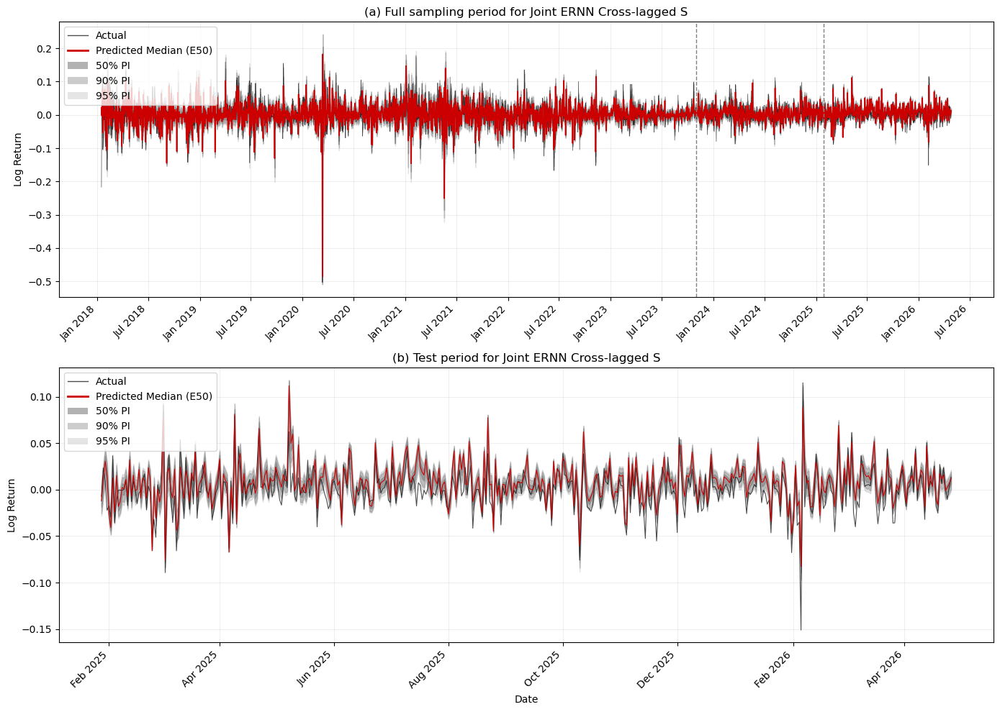

Plot saved to hybrid_ernn_cross_s_joint_predictions.png

TEST METRICS — JOINT ERNN S CROSS-LAGGED
       tau           NLL           ASE
0.02500000   -2.33673859    0.00003589
0.05000000   -2.45248246    0.00005128
0.25000000   -2.65458345    0.00010135
0.50000000   -2.69029784    0.00011892
0.75000000   -2.72866154    0.00008445
0.95000000   -2.69450307    0.00002680
0.97500000   -2.66021752    0.00001570

Average NLL: -2.602498
Average ASE: 0.00006206

CROSSOVER ANALYSIS — FINAL HYBRID OUTPUT
(0.025, 0.050): 11 (2.42%) <-- TAIL
(0.050, 0.250): 1 (0.22%)
(0.250, 0.500): 4 (0.88%)
(0.500, 0.750): 0 (0.00%)
(0.750, 0.950): 0 (0.00%)
(0.950, 0.975): 3 (0.66%) <-- TAIL

Total violations: 19 (0.70%)
Tail violations: 14 (1.54%)

CROSSOVER ANALYSIS — MONOTONIC FNN OUTPUT
(0.025, 0.050): 0 (0.00%) <-- TAIL
(0.050, 0.250): 0 (0.00%)
(0.250, 0.500): 0 (0.00%)
(0.500, 0.750): 0 (0.00%)
(0.750, 0.950): 0 (0.00%)
(0.950, 0.975): 0 (0.00%) <-- TAIL

Total violations: 0 (0.00%)
Tail violations: 0 (0

In [36]:
# ============================================================
# PLOTTING — JOINT HYBRID ERNN S CROSS-LAGGED
# ============================================================

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from matplotlib.patches import Patch
from matplotlib.lines import Line2D


# ------------------------------------------------------------
# Load best model
# ------------------------------------------------------------

checkpoint = torch.load(
    'hybrid_ernn_cross_s_joint_best.pt',
    map_location='cpu',
    weights_only=False
)

tau_levels = checkpoint['tau_levels']
best_config_ernn_cross_s = checkpoint['config']

best_model_ernn_cross_s = JointHybridERNNCrossS(
    X_train.shape[1],
    best_config_ernn_cross_s
)

best_model_ernn_cross_s.load_state_dict(
    checkpoint['model_state_dict']
)

best_model_ernn_cross_s.eval()

print("Loaded best trial:", checkpoint['best_trial_number'])
print("Best architecture:", best_config_ernn_cross_s)


# ------------------------------------------------------------
# Full-sample prediction
# ------------------------------------------------------------

X_all = torch.tensor(
    df[feature_cols].values,
    dtype=torch.float32
)

y_all = torch.tensor(
    df['log_return'].values,
    dtype=torch.float32
)

train_size = len(train_df)
val_size = len(val_df)
test_start = train_size + val_size

with torch.no_grad():

    e_all, care_all, fnn_all, sigma = (
        best_model_ernn_cross_s(
            y_all,
            X_all
        )
    )

e_all_np = e_all.cpu().numpy()
care_all_np = care_all.cpu().numpy()
fnn_all_np = fnn_all.cpu().numpy()
sigma_np = sigma.cpu().numpy()

e_test_np = e_all_np[test_start:]
fnn_test_np = fnn_all_np[test_start:]
y_test_np = y_all.cpu().numpy()[test_start:]

all_preds = {
    tau: e_all_np[:, k]
    for k, tau in enumerate(tau_levels)
}


# ============================================================
# Two-panel plot
# ============================================================

actual_color = '#000000'
pred_color = '#CC0000'
pi_color = '#808080'

all_dates = df.index
test_dates = test_df.index
y_all_np = y_all.cpu().numpy()

legend_elements = [
    Line2D(
        [0], [0],
        color=actual_color,
        lw=1,
        alpha=0.7,
        label='Actual'
    ),
    Line2D(
        [0], [0],
        color=pred_color,
        lw=2,
        label='Predicted Median (E50)'
    ),
    Patch(
        facecolor=pi_color,
        alpha=0.6,
        label='50% PI'
    ),
    Patch(
        facecolor=pi_color,
        alpha=0.4,
        label='90% PI'
    ),
    Patch(
        facecolor=pi_color,
        alpha=0.2,
        label='95% PI'
    )
]

fig, axes = plt.subplots(
    2, 1,
    figsize=(14, 10)
)


# ------------------------------------------------------------
# Panel (a): full sampling period
# ------------------------------------------------------------

ax = axes[0]

ax.plot(
    all_dates,
    y_all_np,
    color=actual_color,
    linewidth=0.5,
    alpha=0.7
)

ax.plot(
    all_dates,
    all_preds[0.500],
    color=pred_color,
    linewidth=1.2
)

ax.fill_between(
    all_dates,
    all_preds[0.025],
    all_preds[0.975],
    color=pi_color,
    alpha=0.2
)

ax.fill_between(
    all_dates,
    all_preds[0.050],
    all_preds[0.950],
    color=pi_color,
    alpha=0.4
)

ax.fill_between(
    all_dates,
    all_preds[0.250],
    all_preds[0.750],
    color=pi_color,
    alpha=0.6
)

ax.axvline(
    train_df.index[-1],
    color='gray',
    linestyle='--',
    linewidth=1
)

ax.axvline(
    val_df.index[-1],
    color='gray',
    linestyle='--',
    linewidth=1
)

ax.set_title(
    '(a) Full sampling period for Joint ERNN Cross-lagged S',
    fontsize=12
)

ax.set_ylabel('Log Return')
ax.legend(handles=legend_elements, loc='upper left')
ax.grid(True, alpha=0.2)

ax.xaxis.set_major_formatter(
    mdates.DateFormatter('%b %Y')
)

ax.xaxis.set_major_locator(
    mdates.MonthLocator(interval=6)
)

plt.setp(
    ax.xaxis.get_majorticklabels(),
    rotation=45,
    ha='right'
)


# ------------------------------------------------------------
# Panel (b): test period
# ------------------------------------------------------------

ax2 = axes[1]

ax2.plot(
    test_dates,
    y_test_np,
    color=actual_color,
    linewidth=0.8,
    alpha=0.7
)

ax2.plot(
    test_dates,
    e_test_np[:, 3],
    color=pred_color,
    linewidth=0.8
)

ax2.fill_between(
    test_dates,
    e_test_np[:, 0],
    e_test_np[:, 6],
    color=pi_color,
    alpha=0.2
)

ax2.fill_between(
    test_dates,
    e_test_np[:, 1],
    e_test_np[:, 5],
    color=pi_color,
    alpha=0.4
)

ax2.fill_between(
    test_dates,
    e_test_np[:, 2],
    e_test_np[:, 4],
    color=pi_color,
    alpha=0.6
)

ax2.set_title(
    '(b) Test period for Joint ERNN Cross-lagged S',
    fontsize=12
)

ax2.set_xlabel('Date')
ax2.set_ylabel('Log Return')
ax2.legend(handles=legend_elements, loc='upper left')
ax2.grid(True, alpha=0.2)

ax2.xaxis.set_major_formatter(
    mdates.DateFormatter('%b %Y')
)

ax2.xaxis.set_major_locator(
    mdates.MonthLocator(interval=2)
)

plt.setp(
    ax2.xaxis.get_majorticklabels(),
    rotation=45,
    ha='right'
)

plt.tight_layout()

plot_filename = (
    'hybrid_ernn_cross_s_joint_predictions.png'
)

plt.savefig(
    plot_filename,
    dpi=300,
    bbox_inches='tight'
)

plt.show()
plt.close()

print(f"Plot saved to {plot_filename}")


# ============================================================
# Test NLL and ASE
# ============================================================

def compute_ernn_cross_s_test_metrics(
    y_test,
    e_test,
    sigma,
    tau_levels
):

    y_tensor = torch.tensor(
        y_test,
        dtype=torch.float32
    )

    nll_values = []
    ase_values = []

    print("\n" + "=" * 65)
    print("TEST METRICS — JOINT ERNN S CROSS-LAGGED")
    print("=" * 65)

    print(
        f"{'tau':>10}"
        f"{'NLL':>14}"
        f"{'ASE':>14}"
    )

    for k, tau in enumerate(tau_levels):

        e_tensor = torch.tensor(
            e_test[:, k],
            dtype=torch.float32
        )

        sigma_k = torch.tensor(
            sigma[k],
            dtype=torch.float32
        )

        # Same AGD NLL used during training
        nll = hybrid_ernn_loss(
            y_tensor,
            e_tensor,
            sigma_k,
            tau
        ).item()

        residual = (
            y_tensor - e_tensor
        )

        weight = torch.where(
            residual >= 0,
            torch.full_like(residual, tau),
            torch.full_like(
                residual,
                1.0 - tau
            )
        )

        ase = torch.mean(
            weight * residual.pow(2)
        ).item()

        nll_values.append(nll)
        ase_values.append(ase)

        print(
            f"{tau:>10.8f}"
            f"{nll:>14.8f}"
            f"{ase:>14.8f}"
        )

    average_nll = np.mean(nll_values)
    average_ase = np.mean(ase_values)

    print(f"\nAverage NLL: {average_nll:.6f}")
    print(f"Average ASE: {average_ase:.8f}")

    return {
        'nll_by_level': nll_values,
        'ase_by_level': ase_values,
        'average_nll': average_nll,
        'average_ase': average_ase
    }


test_metrics_ernn_cross_s = (
    compute_ernn_cross_s_test_metrics(
        y_test_np,
        e_test_np,
        sigma_np,
        tau_levels
    )
)


# ============================================================
# Crossover analysis
# ============================================================

def crossover_analysis_ernn_cross_s(
    predictions,
    levels,
    output_name
):

    T = predictions.shape[0]

    tail_pairs = [
        (0.025, 0.050),
        (0.950, 0.975)
    ]

    total_violations = 0
    tail_violations = 0

    print("\n" + "=" * 65)
    print(f"CROSSOVER ANALYSIS — {output_name}")
    print("=" * 65)

    for k in range(len(levels) - 1):

        lower_level = levels[k]
        upper_level = levels[k + 1]

        violations = int(
            np.sum(
                predictions[:, k]
                > predictions[:, k + 1]
            )
        )

        percentage = (
            violations / T * 100
        )

        pair = (
            lower_level,
            upper_level
        )

        tail_marker = (
            " <-- TAIL"
            if pair in tail_pairs
            else ""
        )

        print(
            f"({lower_level:.3f}, "
            f"{upper_level:.3f}): "
            f"{violations} "
            f"({percentage:.2f}%)"
            f"{tail_marker}"
        )

        total_violations += violations

        if pair in tail_pairs:
            tail_violations += violations

    total_rate = (
        total_violations
        / (T * 6)
        * 100
    )

    tail_rate = (
        tail_violations
        / (T * 2)
        * 100
    )

    print(
        f"\nTotal violations: "
        f"{total_violations} "
        f"({total_rate:.2f}%)"
    )

    print(
        f"Tail violations: "
        f"{tail_violations} "
        f"({tail_rate:.2f}%)"
    )

    return {
        'total_violations': total_violations,
        'total_rate': total_rate,
        'tail_violations': tail_violations,
        'tail_rate': tail_rate
    }


final_crossover_ernn_cross_s = (
    crossover_analysis_ernn_cross_s(
        e_test_np,
        tau_levels,
        'FINAL HYBRID OUTPUT'
    )
)

fnn_crossover_ernn_cross_s = (
    crossover_analysis_ernn_cross_s(
        fnn_test_np,
        tau_levels,
        'MONOTONIC FNN OUTPUT'
    )
)


# ============================================================
# Save test metrics
# ============================================================

metrics_df = pd.DataFrame({
    'tau': tau_levels,
    'NLL': test_metrics_ernn_cross_s[
        'nll_by_level'
    ],
    'ASE': test_metrics_ernn_cross_s[
        'ase_by_level'
    ]
})

metrics_df.to_csv(
    'hybrid_ernn_cross_s_joint_test_metrics.csv',
    index=False
)

print(
    "\nMetrics saved to "
    "hybrid_ernn_cross_s_joint_test_metrics.csv"
)

# Cross over dealing 1b


In [16]:
import copy

import numpy as np
import optuna
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from optuna.samplers import TPESampler


# ============================================================
# METHOD 1B -- JOINT ERNN S Cross-LAGGED
# Complete-output non-crossing through positive adjacent spacing
# ============================================================

M1B_DISTRIBUTION = 'ernn'   # 'qrnn' or 'ernn'
M1B_FORM = 's'           # 's' or 'si'
M1B_LAG = 'cross'             # 'self' or 'cross'
M1B_N_TRIALS = 800
M1B_MAX_EPOCHS = 800
M1B_BASE_SEED = 2026

m1b_levels = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
m1b_spacing_names = [
    'delta12', 'delta23', 'delta34',
    'delta45', 'delta56', 'delta67',
]
m1b_model_tag = (
    f'method1b_joint_{M1B_DISTRIBUTION}_{M1B_FORM}_{M1B_LAG}'
)


def m1b_validate_inputs():
    required = ('y_train', 'X_train', 'y_val', 'X_val')
    missing = [name for name in required if name not in globals()]
    if missing:
        raise NameError(
            'Run the notebook data preparation first. Missing: '
            + ', '.join(missing)
        )

    for y_name, x_name in (
        ('y_train', 'X_train'),
        ('y_val', 'X_val'),
    ):
        y_value = globals()[y_name]
        x_value = globals()[x_name]
        if not isinstance(y_value, torch.Tensor) or not isinstance(
            x_value, torch.Tensor
        ):
            raise TypeError(f'{y_name} and {x_name} must be tensors.')
        if y_value.ndim != 1 or x_value.ndim != 2:
            raise ValueError(f'{y_name} must be (T,) and {x_name} (T,p).')
        if len(y_value) != len(x_value):
            raise ValueError(f'{y_name} and {x_name} lengths differ.')


class Method1BJointHybrid(nn.Module):
    """Central hybrid forecast plus six jointly learned positive gaps."""

    def __init__(self, input_dim, config):
        super().__init__()
        self.eps = 1e-6

        # Identifiable statistical/mixing parameters for the median only.
        self.persistence_raw = nn.Parameter(torch.tensor(1.386))
        self.news1_raw = nn.Parameter(torch.tensor(0.3))
        if M1B_FORM == 'si':
            self.news2_raw = nn.Parameter(torch.tensor(0.3))
        self.psi_raw = nn.Parameter(torch.tensor(0.0))

        # One loss scale per final level.
        self.sigma_raw = nn.Parameter(torch.full((7,), 0.5))

        layers = []
        previous_dim = input_dim
        for index in range(config['n_hidden_layers']):
            hidden_dim = config[f'hidden_dim_{index}']
            layers.append(nn.Linear(previous_dim, hidden_dim))
            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._activation(config['activation']))
            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))
            previous_dim = hidden_dim

        self.feature_extractor = nn.Sequential(*layers)
        self.median_head = nn.Linear(previous_dim, 1)
        self.spacing_heads = nn.ModuleDict({
            name: nn.Linear(previous_dim + 1, 1)
            for name in m1b_spacing_names
        })

        for module in self.modules():
            if isinstance(module, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(module.weight)
                else:
                    nn.init.kaiming_uniform_(module.weight)
                nn.init.zeros_(module.bias)

    @staticmethod
    def _activation(name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh(),
        }[name]

    def _positive_spacing(self, features, reference, name):
        spacing_input = torch.cat(
            [features, reference.unsqueeze(1)], dim=1
        )
        raw_spacing = self.spacing_heads[name](spacing_input).squeeze(1)
        return F.softplus(raw_spacing) + self.eps

    def _median_recursion(
        self,
        y,
        median_fnn,
        initial_state=None,
        initial_y=None,
    ):
        if (initial_state is None) != (initial_y is None):
            raise ValueError(
                'initial_state and initial_y must be supplied together.'
            )

        persistence = torch.sigmoid(self.persistence_raw)
        news1 = F.softplus(self.news1_raw)
        news2 = (
            F.softplus(self.news2_raw)
            if M1B_FORM == 'si'
            else None
        )
        psi = torch.sigmoid(self.psi_raw)

        has_state = initial_state is not None
        previous_state = (
            initial_state if has_state else y.new_zeros(())
        )

        statistical_values = []
        hybrid_values = []

        for time_index in range(len(y)):
            if time_index == 0 and not has_state:
                zero = y.new_zeros(())
                statistical_values.append(zero)
                hybrid_values.append(zero)
                continue

            previous_y = (
                initial_y if time_index == 0 else y[time_index - 1]
            )
            absolute_return = torch.abs(previous_y)

            statistical = (
                persistence * previous_state
                + news1 * absolute_return
            )
            if M1B_FORM == 'si':
                statistical = (
                    statistical
                    + news2 * previous_state * absolute_return
                )

            hybrid = psi * statistical + (1 - psi) * median_fnn[
                time_index
            ]
            statistical_values.append(statistical)
            hybrid_values.append(hybrid)

            previous_state = (
                statistical if M1B_LAG == 'self' else hybrid
            )

        return (
            torch.stack(hybrid_values),
            torch.stack(statistical_values),
        )

    def forward(
        self,
        y,
        X,
        initial_state=None,
        initial_y=None,
    ):
        features = self.feature_extractor(X)
        median_fnn = self.median_head(features).squeeze(1)
        median, statistical = self._median_recursion(
            y,
            median_fnn,
            initial_state=initial_state,
            initial_y=initial_y,
        )

        # Outward reconstruction; references remain attached so that
        # all seven losses jointly train the median and inner spacings.
        delta34 = self._positive_spacing(features, median, 'delta34')
        level3 = median - delta34
        delta23 = self._positive_spacing(features, level3, 'delta23')
        level2 = level3 - delta23
        delta12 = self._positive_spacing(features, level2, 'delta12')
        level1 = level2 - delta12

        delta45 = self._positive_spacing(features, median, 'delta45')
        level5 = median + delta45
        delta56 = self._positive_spacing(features, level5, 'delta56')
        level6 = level5 + delta56
        delta67 = self._positive_spacing(features, level6, 'delta67')
        level7 = level6 + delta67

        forecasts = torch.stack(
            [level1, level2, level3, median, level5, level6, level7],
            dim=1,
        )
        spacings = torch.stack(
            [delta12, delta23, delta34, delta45, delta56, delta67],
            dim=1,
        )
        sigma = F.softplus(self.sigma_raw) + self.eps
        continuation_state = (
            statistical if M1B_LAG == 'self' else median
        )
        return forecasts, sigma, continuation_state, statistical, median, spacings


def m1b_joint_nll(y, forecasts, sigma):
    levels = forecasts.new_tensor(m1b_levels)
    residual = y.unsqueeze(1) - forecasts

    if M1B_DISTRIBUTION == 'qrnn':
        indicator = (residual < 0).to(forecasts.dtype)
        check_loss = residual * (levels.unsqueeze(0) - indicator)
        nll = (
            -torch.log(levels * (1 - levels)).unsqueeze(0)
            + torch.log(sigma).unsqueeze(0)
            + check_loss / sigma.unsqueeze(0)
        )
    else:
        weight = torch.abs(
            levels.unsqueeze(0)
            - (residual < 0).to(forecasts.dtype)
        )
        constant = (
            torch.log(
                torch.sqrt(torch.pi / levels)
                + torch.sqrt(torch.pi / (1 - levels))
            )
            - np.log(2.0)
        )
        nll = (
            torch.log(sigma).unsqueeze(0)
            + constant.unsqueeze(0)
            + weight * residual.square() / sigma.square().unsqueeze(0)
        )

    return nll.mean()


def m1b_secondary_metric(y, forecasts):
    levels = forecasts.new_tensor(m1b_levels)
    if M1B_DISTRIBUTION == 'qrnn':
        hit_rate = (y.unsqueeze(1) <= forecasts).float().mean(dim=0)
        by_level = torch.abs(hit_rate - levels)
        return by_level, by_level.mean(), hit_rate

    residual = y.unsqueeze(1) - forecasts
    weight = torch.abs(
        levels.unsqueeze(0)
        - (residual < 0).to(forecasts.dtype)
    )
    by_level = (weight * residual.square()).mean(dim=0)
    return by_level, by_level.mean(), None


def m1b_crossover(forecasts):
    violations = forecasts[:, :-1] > forecasts[:, 1:]
    pair_counts = violations.sum(dim=0)
    sample_size = forecasts.shape[0]
    total = int(pair_counts.sum().item())
    tail = int(pair_counts[0].item() + pair_counts[-1].item())
    return {
        'pair_counts': [int(value) for value in pair_counts.tolist()],
        'total_count': total,
        'total_rate': total / (sample_size * 6),
        'tail_count': tail,
        'tail_rate': tail / (sample_size * 2),
    }


def m1b_suggest_config(trial):
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation': trial.suggest_categorical(
            'activation', ['relu', 'elu', 'gelu', 'tanh']
        ),
        'dropout': trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm': trial.suggest_categorical(
            'layernorm', [True, False]
        ),
        'weight_init': trial.suggest_categorical(
            'weight_init', ['glorot', 'he']
        ),
        'lr': trial.suggest_float('lr', 1e-4, 5e-2, log=True),
        'optimizer': trial.suggest_categorical(
            'optimizer', ['adam', 'adamw']
        ),
        'weight_decay': trial.suggest_float(
            'weight_decay', 0.0, 1e-4
        ),
        'gradient_clip': trial.suggest_categorical(
            'gradient_clip', [0.1, 1.0, 5.0]
        ),
        'patience': trial.suggest_categorical(
            'patience', [10, 20, 30]
        ),
    }
    for index in range(config['n_hidden_layers']):
        config[f'hidden_dim_{index}'] = trial.suggest_int(
            f'hidden_dim_{index}', 32, 256
        )
    return config


def m1b_fit(config, max_epochs=M1B_MAX_EPOCHS, seed=M1B_BASE_SEED):
    torch.manual_seed(seed)
    np.random.seed(seed)
    model = Method1BJointHybrid(X_train.shape[1], config)
    optimizer_class = (
        torch.optim.Adam
        if config['optimizer'] == 'adam'
        else torch.optim.AdamW
    )
    optimizer = optimizer_class(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay'],
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6
    )

    best_loss = float('inf')
    best_state = None
    patience_counter = 0

    for _ in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        train_forecasts, sigma, _, _, _, _ = model(y_train, X_train)
        train_loss = m1b_joint_nll(
            y_train[1:], train_forecasts[1:], sigma
        )
        if not torch.isfinite(train_loss):
            return None
        train_loss.backward()
        nn.utils.clip_grad_norm_(
            model.parameters(), config['gradient_clip']
        )
        optimizer.step()

        model.eval()
        with torch.no_grad():
            _, _, train_state, _, _, _ = model(y_train, X_train)
            validation_forecasts, validation_sigma, _, _, _, _ = model(
                y_val,
                X_val,
                initial_state=train_state[-1],
                initial_y=y_train[-1],
            )
            validation_loss = m1b_joint_nll(
                y_val, validation_forecasts, validation_sigma
            )

        if not torch.isfinite(validation_loss):
            return None
        scheduler.step(validation_loss.item())
        if validation_loss.item() < best_loss:
            best_loss = validation_loss.item()
            best_state = copy.deepcopy(model.state_dict())
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= config['patience']:
                break

    if best_state is None:
        return None
    model.load_state_dict(best_state)
    return model


def m1b_evaluate(model):
    model.eval()
    with torch.no_grad():
        _, _, train_state, _, _, _ = model(y_train, X_train)
        forecasts, sigma, _, _, _, spacings = model(
            y_val,
            X_val,
            initial_state=train_state[-1],
            initial_y=y_train[-1],
        )
        mean_nll = m1b_joint_nll(y_val, forecasts, sigma).item()
        by_level, secondary, hit_rate = m1b_secondary_metric(
            y_val, forecasts
        )

        metrics = {
            'mean_nll': mean_nll,
            'secondary': secondary.item(),
            'secondary_by_level': by_level.tolist(),
            'crossover': m1b_crossover(forecasts),
            'spacing_mean': spacings.mean(dim=0).tolist(),
            'spacing_min': spacings.min(dim=0).values.tolist(),
            'spacing_max': spacings.max(dim=0).values.tolist(),
            'spacing_std': spacings.std(
                dim=0, unbiased=False
            ).tolist(),
            'near_zero_count': (
                spacings <= 1e-5
            ).sum(dim=0).tolist(),
            'persistence': torch.sigmoid(
                model.persistence_raw
            ).item(),
            'news1': F.softplus(model.news1_raw).item(),
            'news2': (
                F.softplus(model.news2_raw).item()
                if M1B_FORM == 'si'
                else np.nan
            ),
            'psi': torch.sigmoid(model.psi_raw).item(),
            'sigma': (
                F.softplus(model.sigma_raw) + model.eps
            ).tolist(),
        }
        if hit_rate is not None:
            metrics['hit_rate'] = hit_rate.tolist()
        return metrics


def m1b_objective(trial):
    config = m1b_suggest_config(trial)
    model = m1b_fit(config)
    if model is None:
        return float('inf')
    metrics = m1b_evaluate(model)
    for name, value in metrics.items():
        trial.set_user_attr(name, value)
    metric_name = 'HRE' if M1B_DISTRIBUTION == 'qrnn' else 'ASE'
    print(
        f"Trial {trial.number}: NLL={metrics['mean_nll']:.6f} | "
        f"{metric_name}={metrics['secondary']:.8f} | "
        f"crossover={metrics['crossover']['total_rate']:.2%}"
    )
    return metrics['mean_nll']


def m1b_select_by_rank(study):
    trials = [
        trial for trial in study.trials
        if trial.state == optuna.trial.TrialState.COMPLETE
        and trial.value is not None
        and np.isfinite(trial.value)
        and 'mean_nll' in trial.user_attrs
        and 'secondary' in trial.user_attrs
    ]
    if not trials:
        raise RuntimeError('No valid Method 1b trials.')

    nll_order = sorted(
        trials,
        key=lambda trial: (trial.user_attrs['mean_nll'], trial.number),
    )
    secondary_order = sorted(
        trials,
        key=lambda trial: (trial.user_attrs['secondary'], trial.number),
    )
    rank_nll = {
        trial.number: rank
        for rank, trial in enumerate(nll_order, 1)
    }
    rank_secondary = {
        trial.number: rank
        for rank, trial in enumerate(secondary_order, 1)
    }
    best = min(
        trials,
        key=lambda trial: (
            rank_nll[trial.number] + rank_secondary[trial.number],
            trial.user_attrs['mean_nll'],
            trial.user_attrs['secondary'],
            trial.number,
        ),
    )
    return best, trials, rank_nll, rank_secondary


m1b_validate_inputs()
print('\n' + '=' * 72)
print(
    f'Tuning Method 1b Joint {M1B_DISTRIBUTION.upper()} '
    f'{M1B_FORM.upper()} {M1B_LAG.title()}-lagged'
)
print('=' * 72)

m1b_study = optuna.create_study(
    direction='minimize',
    sampler=TPESampler(seed=M1B_BASE_SEED),
)
m1b_study.optimize(
    m1b_objective,
    n_trials=M1B_N_TRIALS,
    show_progress_bar=True,
)

(
    m1b_best_trial,
    m1b_all_trials,
    m1b_rank_nll,
    m1b_rank_secondary,
) = m1b_select_by_rank(m1b_study)

m1b_ranking_records = []
for trial in m1b_all_trials:
    record = {
        'trial': trial.number,
        'mean_nll': trial.user_attrs['mean_nll'],
        ('mean_hre' if M1B_DISTRIBUTION == 'qrnn' else 'mean_ase'):
            trial.user_attrs['secondary'],
        'rank_nll': m1b_rank_nll[trial.number],
        'rank_secondary': m1b_rank_secondary[trial.number],
        'sum_rank': (
            m1b_rank_nll[trial.number]
            + m1b_rank_secondary[trial.number]
        ),
        'crossover_count': trial.user_attrs['crossover']['total_count'],
        'crossover_rate': trial.user_attrs['crossover']['total_rate'],
        'tail_count': trial.user_attrs['crossover']['tail_count'],
        'tail_rate': trial.user_attrs['crossover']['tail_rate'],
        'persistence': trial.user_attrs['persistence'],
        'news1': trial.user_attrs['news1'],
        'news2': trial.user_attrs['news2'],
        'psi': trial.user_attrs['psi'],
    }
    for index, level in enumerate(m1b_levels):
        metric_label = 'hre' if M1B_DISTRIBUTION == 'qrnn' else 'ase'
        record[f'{metric_label}_{level:.3f}'] = trial.user_attrs[
            'secondary_by_level'
        ][index]
        record[f'sigma_{level:.3f}'] = trial.user_attrs['sigma'][index]
    record.update(trial.params)
    m1b_ranking_records.append(record)

m1b_ranking_df = pd.DataFrame(m1b_ranking_records).sort_values(
    ['sum_rank', 'mean_nll', 'trial']
)
m1b_ranking_filename = f'{m1b_model_tag}_ranking.csv'
m1b_ranking_df.to_csv(m1b_ranking_filename, index=False)

m1b_best_config = m1b_best_trial.params.copy()
m1b_best_model = m1b_fit(m1b_best_config)
if m1b_best_model is None:
    raise RuntimeError('Selected Method 1b configuration failed to refit.')
m1b_best_metrics = m1b_evaluate(m1b_best_model)

m1b_checkpoint_filename = f'{m1b_model_tag}_best.pt'
torch.save(
    {
        'model_state_dict': m1b_best_model.state_dict(),
        'config': m1b_best_config,
        'levels': m1b_levels,
        'distribution': M1B_DISTRIBUTION,
        'form': M1B_FORM,
        'lag': M1B_LAG,
        'validation_metrics': m1b_best_metrics,
    },
    m1b_checkpoint_filename,
)

m1b_metric_name = 'HRE' if M1B_DISTRIBUTION == 'qrnn' else 'ASE'
print('\n' + '=' * 72)
print('METHOD 1B TUNING COMPLETE')
print('=' * 72)
print(f'Best trial: #{m1b_best_trial.number}')
print(f"Mean validation NLL: {m1b_best_metrics['mean_nll']:.6f}")
print(
    f"Mean validation {m1b_metric_name}: "
    f"{m1b_best_metrics['secondary']:.8f}"
)
print(
    f"Final crossover: {m1b_best_metrics['crossover']['total_count']} "
    f"({m1b_best_metrics['crossover']['total_rate']:.2%})"
)
print(f'Saved ranking: {m1b_ranking_filename}')
print(f'Saved model: {m1b_checkpoint_filename}')



[I 2026-08-23 17:44:10,350] A new study created in memory with name: no-name-abebf684-42ff-419f-944a-3eba7c00dd92



Tuning Method 1b Joint ERNN S Cross-lagged


  0%|          | 0/800 [00:00<?, ?it/s]

Trial 0: NLL=0.998514 | ASE=0.00041133 | crossover=0.00%
[I 2026-08-23 17:45:46,118] Trial 0 finished with value: 0.9985139966011047 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.0006552020421842752, 'optimizer': 'adam', 'weight_decay': 8.940884610144999e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 38}. Best is trial 0 with value: 0.9985139966011047.
Trial 1: NLL=-2.361002 | ASE=0.00007836 | crossover=0.00%
[I 2026-08-23 17:47:20,983] Trial 1 finished with value: -2.36100172996521 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.07458356653667625, 'layernorm': False, 'weight_init': 'he', 'lr': 0.006969178688110181, 'optimizer': 'adam', 'weight_decay': 2.574006001095316e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 102}. Best is trial 1 with value: -2.36100172996521.
Trial 2: NLL=1.355497 | ASE=0.00622726 | crossover=0.00%
[I 2026-08-23 17:48

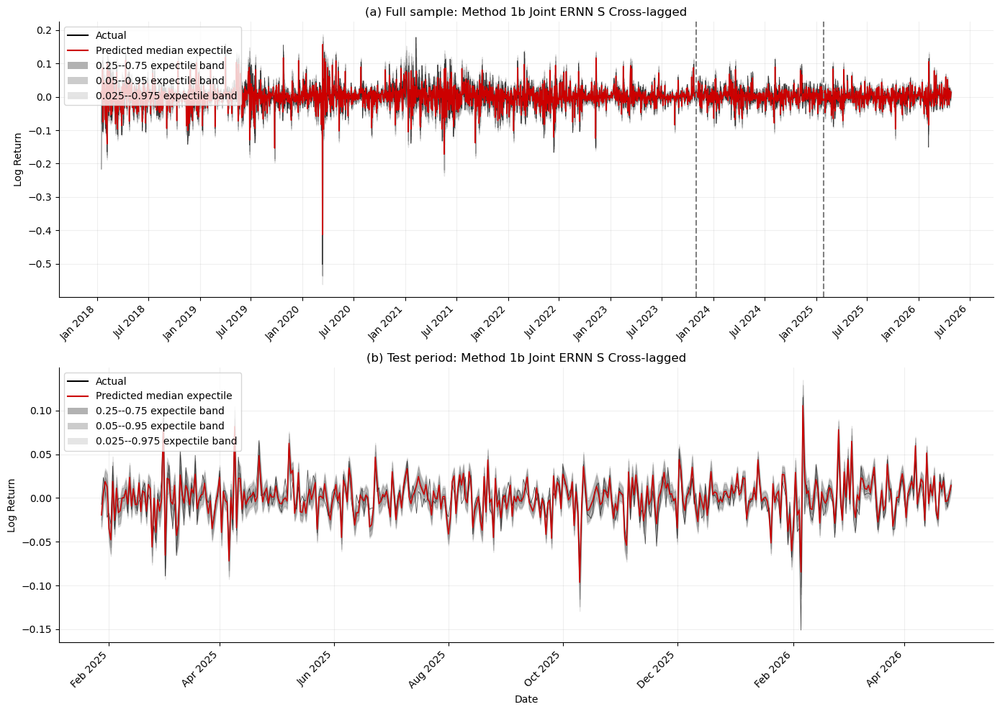

Plot saved to: method1b_joint_ernn_s_cross_predictions.png

TEST METRICS -- METHOD 1B JOINT ERNN S CROSS-LAGGED
 level       NLL      ASE    sigma
 0.025 -2.646123 0.000020 0.008006
 0.050 -2.721102 0.000030 0.010062
 0.250 -2.852153 0.000069 0.015555
 0.500 -2.882996 0.000075 0.017455
 0.750 -2.893312 0.000061 0.015274
 0.950 -2.806729 0.000023 0.009717
 0.975 -2.751466 0.000014 0.007746

Average NLL: -2.793412
Average ASE: 0.00004158

CROSSOVER ANALYSIS -- FINAL METHOD 1B FORECASTS
 Lower  Upper  Violations  Rate
 0.025  0.050           0   0.0
 0.050  0.250           0   0.0
 0.250  0.500           0   0.0
 0.500  0.750           0   0.0
 0.750  0.950           0   0.0
 0.950  0.975           0   0.0

Total violations: 0
Tail violations: 0

LEARNED SPACING DIAGNOSTICS -- TEST PERIOD
Spacing  Lower_Level  Upper_Level  Mean_Delta  Minimum_Delta  Maximum_Delta  Delta_Std  Near_Zero_Count  Near_Zero_Rate
delta12        0.025        0.050    0.002250       0.001248       0.005872   0.000

In [18]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from matplotlib.lines import Line2D
from matplotlib.patches import Patch


# ============================================================
# PLOT AND EVALUATE METHOD 1B -- ERNN S
# Cross-LAGGED
# ============================================================

m1b_plot_pairs = list(zip(m1b_levels[:-1], m1b_levels[1:]))
m1b_plot_tail_pairs = [(0.025, 0.050), (0.950, 0.975)]

if 'm1b_best_model' not in globals():
    m1b_plot_checkpoint_filename = f'{m1b_model_tag}_best.pt'
    m1b_plot_checkpoint = torch.load(
        m1b_plot_checkpoint_filename,
        map_location='cpu',
        weights_only=False,
    )
    m1b_best_model = Method1BJointHybrid(
        X_train.shape[1], m1b_plot_checkpoint['config']
    )
    m1b_best_model.load_state_dict(
        m1b_plot_checkpoint['model_state_dict']
    )

m1b_best_model.eval()

m1b_plot_X_all = torch.tensor(
    df[feature_cols].values, dtype=torch.float32
)
m1b_plot_y_all = torch.tensor(
    df['log_return'].values, dtype=torch.float32
)

with torch.no_grad():
    (
        m1b_plot_forecasts_all,
        m1b_plot_sigma,
        _,
        _,
        _,
        m1b_plot_spacings_all,
    ) = m1b_best_model(m1b_plot_y_all, m1b_plot_X_all)

m1b_plot_forecasts_np = m1b_plot_forecasts_all.cpu().numpy()
m1b_plot_spacings_np = m1b_plot_spacings_all.cpu().numpy()
m1b_plot_test_start = len(train_df) + len(val_df)
m1b_plot_forecasts_test = m1b_plot_forecasts_all[
    m1b_plot_test_start:
]
m1b_plot_spacings_test = m1b_plot_spacings_all[m1b_plot_test_start:]
m1b_plot_y_test = m1b_plot_y_all[m1b_plot_test_start:]

if len(m1b_plot_forecasts_test) != len(test_df):
    raise ValueError(
        'Test forecast length does not match test_df. Check the split.'
    )


def m1b_draw_panel(axis, dates, actual, forecasts):
    axis.plot(dates, actual, color='#000000', linewidth=0.6, alpha=0.7)
    axis.plot(
        dates, forecasts[:, 3], color='#CC0000', linewidth=1.1
    )
    axis.fill_between(
        dates, forecasts[:, 0], forecasts[:, 6],
        color='#808080', alpha=0.20,
    )
    axis.fill_between(
        dates, forecasts[:, 1], forecasts[:, 5],
        color='#808080', alpha=0.40,
    )
    axis.fill_between(
        dates, forecasts[:, 2], forecasts[:, 4],
        color='#808080', alpha=0.60,
    )
    axis.set_ylabel('Log Return')
    axis.grid(True, alpha=0.2)
    axis.spines['top'].set_visible(False)
    axis.spines['right'].set_visible(False)


m1b_plot_distribution_label = M1B_DISTRIBUTION.upper()
m1b_plot_form_label = M1B_FORM.upper()
m1b_plot_lag_label = M1B_LAG.title()
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

m1b_draw_panel(
    axes[0], df.index, df['log_return'].values, m1b_plot_forecasts_np
)
axes[0].axvline(train_df.index[-1], color='gray', linestyle='--')
axes[0].axvline(val_df.index[-1], color='gray', linestyle='--')
axes[0].set_title(
    f'(a) Full sample: Method 1b Joint {m1b_plot_distribution_label} '
    f'{m1b_plot_form_label} {m1b_plot_lag_label}-lagged'
)
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=6))

m1b_draw_panel(
    axes[1],
    test_df.index,
    test_df['log_return'].values,
    m1b_plot_forecasts_np[m1b_plot_test_start:],
)
axes[1].set_title(
    f'(b) Test period: Method 1b Joint '
    f'{m1b_plot_distribution_label} {m1b_plot_form_label} '
    f'{m1b_plot_lag_label}-lagged'
)
axes[1].set_xlabel('Date')
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=2))

if M1B_DISTRIBUTION == 'qrnn':
    median_label = 'Predicted Median (Q50)'
    band_labels = ['50% PI', '90% PI', '95% PI']
else:
    median_label = 'Predicted median expectile'
    band_labels = [
        '0.25--0.75 expectile band',
        '0.05--0.95 expectile band',
        '0.025--0.975 expectile band',
    ]

m1b_legend = [
    Line2D([0], [0], color='#000000', label='Actual'),
    Line2D([0], [0], color='#CC0000', label=median_label),
    Patch(facecolor='#808080', alpha=0.60, label=band_labels[0]),
    Patch(facecolor='#808080', alpha=0.40, label=band_labels[1]),
    Patch(facecolor='#808080', alpha=0.20, label=band_labels[2]),
]
for axis in axes:
    axis.legend(handles=m1b_legend, loc='upper left')
    plt.setp(
        axis.xaxis.get_majorticklabels(), rotation=45, ha='right'
    )

plt.tight_layout()
m1b_plot_png = f'{m1b_model_tag}_predictions.png'
plt.savefig(m1b_plot_png, dpi=300, bbox_inches='tight')
plt.show()
plt.close()
print(f'Plot saved to: {m1b_plot_png}')


# ============================================================
# Test metrics by level
# ============================================================

m1b_plot_metric_rows = []
for index, level in enumerate(m1b_levels):
    forecast = m1b_plot_forecasts_test[:, index]
    sigma = m1b_plot_sigma[index]
    residual = m1b_plot_y_test - forecast

    if M1B_DISTRIBUTION == 'qrnn':
        indicator = (residual < 0).to(residual.dtype)
        check_loss = residual * (level - indicator)
        nll = (
            -torch.log(residual.new_tensor(level * (1 - level)))
            + torch.log(sigma)
            + check_loss / sigma
        ).mean().item()
        hit_rate = (
            m1b_plot_y_test <= forecast
        ).float().mean().item()
        secondary = abs(hit_rate - level)
        row = {
            'level': level,
            'NLL': nll,
            'Hit_Rate': hit_rate,
            'HRE': secondary,
            'sigma': sigma.item(),
        }
    else:
        weight = torch.abs(
            residual.new_tensor(level)
            - (residual < 0).to(residual.dtype)
        )
        weighted_squared_error = weight * residual.square()
        constant = (
            torch.log(
                torch.sqrt(residual.new_tensor(torch.pi / level))
                + torch.sqrt(
                    residual.new_tensor(torch.pi / (1 - level))
                )
            )
            - np.log(2.0)
        )
        nll = (
            torch.log(sigma)
            + constant
            + weighted_squared_error / sigma.square()
        ).mean().item()
        secondary = weighted_squared_error.mean().item()
        row = {
            'level': level,
            'NLL': nll,
            'ASE': secondary,
            'sigma': sigma.item(),
        }

    m1b_plot_metric_rows.append(row)

m1b_plot_metrics_df = pd.DataFrame(m1b_plot_metric_rows)
m1b_plot_metric_column = (
    'HRE' if M1B_DISTRIBUTION == 'qrnn' else 'ASE'
)
print('\n' + '=' * 72)
print(
    f'TEST METRICS -- METHOD 1B JOINT '
    f'{m1b_plot_distribution_label} {m1b_plot_form_label} '
    f'{m1b_plot_lag_label.upper()}-LAGGED'
)
print('=' * 72)
print(m1b_plot_metrics_df.to_string(index=False))
print(f"\nAverage NLL: {m1b_plot_metrics_df['NLL'].mean():.6f}")
print(
    f'Average {m1b_plot_metric_column}: '
    f"{m1b_plot_metrics_df[m1b_plot_metric_column].mean():.8f}"
)


# ============================================================
# Crossover and learned-spacing diagnostics
# ============================================================

m1b_plot_crossover_rows = []
for index, (lower, upper) in enumerate(m1b_plot_pairs):
    count = int((
        m1b_plot_forecasts_test[:, index]
        > m1b_plot_forecasts_test[:, index + 1]
    ).sum().item())
    m1b_plot_crossover_rows.append({
        'Lower': lower,
        'Upper': upper,
        'Violations': count,
        'Rate': count / len(m1b_plot_y_test),
    })

m1b_plot_crossover_df = pd.DataFrame(m1b_plot_crossover_rows)
m1b_plot_total = int(m1b_plot_crossover_df['Violations'].sum())
m1b_plot_tail = int(
    m1b_plot_crossover_df.iloc[0]['Violations']
    + m1b_plot_crossover_df.iloc[-1]['Violations']
)
print('\n' + '=' * 72)
print('CROSSOVER ANALYSIS -- FINAL METHOD 1B FORECASTS')
print('=' * 72)
print(m1b_plot_crossover_df.to_string(index=False))
print(f'\nTotal violations: {m1b_plot_total}')
print(f'Tail violations: {m1b_plot_tail}')

m1b_plot_spacing_rows = []
for index, (name, pair) in enumerate(zip(
    m1b_spacing_names, m1b_plot_pairs
)):
    spacing = m1b_plot_spacings_test[:, index]
    m1b_plot_spacing_rows.append({
        'Spacing': name,
        'Lower_Level': pair[0],
        'Upper_Level': pair[1],
        'Mean_Delta': spacing.mean().item(),
        'Minimum_Delta': spacing.min().item(),
        'Maximum_Delta': spacing.max().item(),
        'Delta_Std': spacing.std(unbiased=False).item(),
        'Near_Zero_Count': int((spacing <= 1e-5).sum().item()),
        'Near_Zero_Rate': (
            spacing <= 1e-5
        ).float().mean().item(),
    })

m1b_plot_spacing_df = pd.DataFrame(m1b_plot_spacing_rows)
print('\n' + '=' * 72)
print('LEARNED SPACING DIAGNOSTICS -- TEST PERIOD')
print('=' * 72)
print(m1b_plot_spacing_df.to_string(index=False))


# ============================================================
# Detailed predictions and saved outputs
# ============================================================

m1b_plot_predictions_df = pd.DataFrame({
    'Date': pd.to_datetime(test_df.index),
    'Actual': test_df['log_return'].values,
})
m1b_plot_prefix = 'Q' if M1B_DISTRIBUTION == 'qrnn' else 'E'
for index, level in enumerate(m1b_levels):
    m1b_plot_predictions_df[f'{m1b_plot_prefix}_{level:.3f}'] = (
        m1b_plot_forecasts_np[m1b_plot_test_start:, index]
    )
for index, (lower, upper) in enumerate(m1b_plot_pairs):
    m1b_plot_predictions_df[
        f'Gap_{lower:.3f}_{upper:.3f}'
    ] = m1b_plot_spacings_np[m1b_plot_test_start:, index]

m1b_plot_metrics_file = f'{m1b_model_tag}_test_metrics.csv'
m1b_plot_crossover_file = f'{m1b_model_tag}_crossover.csv'
m1b_plot_spacing_file = f'{m1b_model_tag}_delta_summary.csv'
m1b_plot_predictions_file = f'{m1b_model_tag}_test_predictions.csv'

m1b_plot_metrics_df.to_csv(m1b_plot_metrics_file, index=False)
m1b_plot_crossover_df.to_csv(m1b_plot_crossover_file, index=False)
m1b_plot_spacing_df.to_csv(m1b_plot_spacing_file, index=False)
m1b_plot_predictions_df.to_csv(m1b_plot_predictions_file, index=False)

print('\nSaved Method 1b outputs:')
for filename in (
    m1b_plot_png,
    m1b_plot_metrics_file,
    m1b_plot_crossover_file,
    m1b_plot_spacing_file,
    m1b_plot_predictions_file,
):
    print(f'  {filename}')



# Cross over dealing 2

In [39]:
import copy

import numpy as np
import optuna
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from optuna.samplers import TPESampler


# ============================================================
# METHOD 2 -- SEQUENTIAL HYBRID ERNN S CROSS-LAGGED
# Seven separate models; 200 Optuna trials per level
# Selection: validation NLL rank + validation ASE rank
# ============================================================

m2_ernn_cross_s_levels = [
    0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975
]

m2_ernn_cross_s_order = [
    0.500, 0.750, 0.950, 0.975, 0.250, 0.050, 0.025
]

m2_ernn_cross_s_reference = {
    0.500: None,
    0.750: 0.500,
    0.950: 0.750,
    0.975: 0.950,
    0.250: 0.500,
    0.050: 0.250,
    0.025: 0.050,
}

m2_ernn_cross_s_direction = {
    0.500: None,
    0.750: 'upper',
    0.950: 'upper',
    0.975: 'upper',
    0.250: 'lower',
    0.050: 'lower',
    0.025: 'lower',
}

M2_ERNN_CROSS_S_DELTA = 1e-6
M2_ERNN_CROSS_S_SMOOTH_A = 1e-3
M2_ERNN_CROSS_S_PSI_MARGIN = 1e-4
M2_ERNN_CROSS_S_N_TRIALS = 200
M2_ERNN_CROSS_S_MAX_EPOCHS = 200
M2_ERNN_CROSS_S_BASE_SEED = 2026


def m2_ernn_cross_s_scaled_softplus(x):
    return M2_ERNN_CROSS_S_SMOOTH_A * F.softplus(
        x / M2_ERNN_CROSS_S_SMOOTH_A
    )


class M2SequentialERNNCrossS(nn.Module):
    def __init__(self, input_dim, config, direction=None):
        super().__init__()

        self.direction = direction

        self.gamma1_raw = nn.Parameter(torch.tensor(1.386))
        self.gamma2_raw = nn.Parameter(torch.tensor(0.3))
        self.psi_raw = nn.Parameter(torch.tensor(0.0))
        self.sigma_raw = nn.Parameter(torch.tensor(0.5))

        fnn_input_dim = input_dim if direction is None else input_dim + 1
        layers = []
        prev_dim = fnn_input_dim

        for i in range(config['n_hidden_layers']):
            hidden_dim = config[f'hidden_dim_{i}']
            layers.append(nn.Linear(prev_dim, hidden_dim))

            if config['layernorm']:
                layers.append(nn.LayerNorm(hidden_dim))

            layers.append(self._get_activation(config['activation']))

            if config['dropout'] > 0:
                layers.append(nn.Dropout(config['dropout']))

            prev_dim = hidden_dim

        layers.append(nn.Linear(prev_dim, 1))
        self.fnn = nn.Sequential(*layers)

        for module in self.fnn.modules():
            if isinstance(module, nn.Linear):
                if config['weight_init'] == 'glorot':
                    nn.init.xavier_uniform_(module.weight)
                elif config['weight_init'] == 'he':
                    nn.init.kaiming_uniform_(module.weight)

                if module.bias is not None:
                    nn.init.zeros_(module.bias)

    def _get_activation(self, name):
        return {
            'relu': nn.ReLU(),
            'elu': nn.ELU(),
            'gelu': nn.GELU(),
            'tanh': nn.Tanh(),
        }.get(name, nn.ReLU())

    def constrain_fnn(self, f_raw, care, e_reference, psi):
        denominator = 1.0 - psi

        if self.direction == 'upper':
            boundary = (
                e_reference
                + M2_ERNN_CROSS_S_DELTA
                - psi * care
            ) / denominator

            return boundary + m2_ernn_cross_s_scaled_softplus(
                f_raw - boundary
            )

        if self.direction == 'lower':
            boundary = (
                e_reference
                - M2_ERNN_CROSS_S_DELTA
                - psi * care
            ) / denominator

            return boundary - m2_ernn_cross_s_scaled_softplus(
                boundary - f_raw
            )

        return f_raw

    def forward(
        self,
        y,
        X,
        e_reference=None,
        initial_hybrid=None,
        initial_y=None,
    ):
        gamma1 = torch.sigmoid(self.gamma1_raw)
        gamma2 = F.softplus(self.gamma2_raw)
        psi = (
            1.0 - M2_ERNN_CROSS_S_PSI_MARGIN
        ) * torch.sigmoid(self.psi_raw)
        sigma = F.softplus(self.sigma_raw) + 1e-6

        if self.direction is None:
            X_fnn = X
        else:
            if e_reference is None:
                raise ValueError(
                    'Reference forecasts are required for non-median models.'
                )

            e_reference = e_reference.detach()
            X_fnn = torch.cat([X, e_reference.unsqueeze(1)], dim=1)

        f_raw = self.fnn(X_fnn).squeeze(-1)

        if (initial_hybrid is None) != (initial_y is None):
            raise ValueError(
                'initial_hybrid and initial_y must be supplied together.'
            )

        has_initial_state = initial_hybrid is not None
        previous_hybrid = (
            initial_hybrid
            if has_initial_state
            else torch.zeros((), dtype=y.dtype, device=y.device)
        )

        e_hybrid_list = []
        e_care_list = []
        f_constrained_list = []

        for t in range(len(y)):
            if t == 0 and not has_initial_state:
                care_t = torch.zeros((), dtype=y.dtype, device=y.device)

                if self.direction is None:
                    f_constrained_t = f_raw[t]
                    hybrid_t = torch.zeros((), dtype=y.dtype, device=y.device)
                else:
                    f_constrained_t = self.constrain_fnn(
                        f_raw[t], care_t, e_reference[t], psi
                    )
                    hybrid_t = (
                        psi * care_t
                        + (1.0 - psi) * f_constrained_t
                    )
            else:
                previous_y = initial_y if t == 0 else y[t - 1]

                # Symmetric cross-lagged CARE:
                # the lag is the previous final hybrid expectile.
                care_t = (
                    gamma1 * previous_hybrid
                    + gamma2 * torch.abs(previous_y)
                )

                if self.direction is None:
                    f_constrained_t = f_raw[t]
                else:
                    f_constrained_t = self.constrain_fnn(
                        f_raw[t], care_t, e_reference[t], psi
                    )

                hybrid_t = (
                    psi * care_t
                    + (1.0 - psi) * f_constrained_t
                )

            e_care_list.append(care_t)
            f_constrained_list.append(f_constrained_t)
            e_hybrid_list.append(hybrid_t)
            previous_hybrid = hybrid_t

        return (
            torch.stack(e_hybrid_list),
            torch.stack(e_care_list),
            f_raw,
            torch.stack(f_constrained_list),
            sigma,
        )


def m2_ernn_cross_s_loss(y, e, sigma, tau):
    return hybrid_ernn_loss(y, e, sigma, tau)

def m2_ernn_cross_s_ase(y, e, tau):
    residual = y - e
    weight = torch.where(
        residual >= 0,
        torch.full_like(residual, tau),
        torch.full_like(residual, 1.0 - tau),
    )
    return torch.mean(weight * residual.pow(2)).item()

def m2_ernn_cross_s_suggest_config(trial):
    config = {
        'n_hidden_layers': trial.suggest_int('n_hidden_layers', 1, 3),
        'activation': trial.suggest_categorical(
            'activation', ['relu', 'elu', 'gelu', 'tanh']
        ),
        'dropout': trial.suggest_float('dropout', 0.0, 0.5),
        'layernorm': trial.suggest_categorical('layernorm', [True, False]),
        'weight_init': trial.suggest_categorical(
            'weight_init', ['glorot', 'he']
        ),
        'lr': trial.suggest_float('lr', 1e-4, 5e-2, log=True),
        'optimizer': trial.suggest_categorical(
            'optimizer', ['adam', 'adamw']
        ),
        'weight_decay': trial.suggest_float('weight_decay', 0.0, 1e-4),
        'gradient_clip': trial.suggest_categorical(
            'gradient_clip', [0.1, 1.0, 5.0]
        ),
        'patience': trial.suggest_categorical('patience', [10, 20, 30]),
    }

    for i in range(config['n_hidden_layers']):
        config[f'hidden_dim_{i}'] = trial.suggest_int(
            f'hidden_dim_{i}', 32, 256
        )

    return config


def m2_ernn_cross_s_make_optimizer(model, config):
    optimizer_class = (
        torch.optim.Adam
        if config['optimizer'] == 'adam'
        else torch.optim.AdamW
    )
    return optimizer_class(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay'],
    )


def m2_ernn_cross_s_train_config(
    config,
    tau,
    direction,
    e_reference_train=None,
    e_reference_val=None,
    seed=2026,
):
    torch.manual_seed(seed)

    model = M2SequentialERNNCrossS(
        input_dim=X_train.shape[1],
        config=config,
        direction=direction,
    )
    optimizer = m2_ernn_cross_s_make_optimizer(model, config)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=10, factor=0.5, min_lr=1e-6
    )

    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(M2_ERNN_CROSS_S_MAX_EPOCHS):
        model.train()
        optimizer.zero_grad()

        q_train, _, _, _, sigma = model(
            y_train, X_train, e_reference_train
        )
        train_loss = m2_ernn_cross_s_loss(
            y_train[1:], q_train[1:], sigma, tau
        )

        if torch.isnan(train_loss) or torch.isinf(train_loss):
            return None

        train_loss.backward()
        nn.utils.clip_grad_norm_(
            model.parameters(), config['gradient_clip']
        )
        optimizer.step()

        model.eval()
        with torch.no_grad():
            e_train_state, _, _, _, _ = model(
                y_train, X_train, e_reference_train
            )
            q_val, _, _, _, sigma_val = model(
                y_val,
                X_val,
                e_reference_val,
                initial_hybrid=e_train_state[-1],
                initial_y=y_train[-1],
            )
            val_loss = m2_ernn_cross_s_loss(
                y_val, q_val, sigma_val, tau
            )

        scheduler.step(val_loss.item())

        if val_loss.item() < best_val_loss:
            best_val_loss = val_loss.item()
            patience_counter = 0
            best_model_state = copy.deepcopy(model.state_dict())
        else:
            patience_counter += 1
            if patience_counter >= config['patience']:
                break

    if best_model_state is None:
        return None

    model.load_state_dict(best_model_state)
    return model


def m2_ernn_cross_s_predict_train_val(
    model,
    e_reference_train=None,
    e_reference_val=None,
):
    model.eval()
    with torch.no_grad():
        q_train, _, _, _, _ = model(
            y_train, X_train, e_reference_train
        )
        q_val, _, _, _, sigma = model(
            y_val,
            X_val,
            e_reference_val,
            initial_hybrid=q_train[-1],
            initial_y=y_train[-1],
        )

    return q_train.detach(), q_val.detach(), sigma.detach()


def m2_ernn_cross_s_evaluate(
    model,
    tau,
    e_reference_train=None,
    e_reference_val=None,
):
    _, q_val, sigma = m2_ernn_cross_s_predict_train_val(
        model, e_reference_train, e_reference_val
    )
    nll = m2_ernn_cross_s_loss(y_val, q_val, sigma, tau).item()
    ase = m2_ernn_cross_s_ase(y_val, q_val, tau)

    return {
        'nll': nll,
        'ase': ase,
        'gamma1': torch.sigmoid(model.gamma1_raw).item(),
        'gamma2': F.softplus(model.gamma2_raw).item(),
        'psi': (
            (1.0 - M2_ERNN_CROSS_S_PSI_MARGIN)
            * torch.sigmoid(model.psi_raw)
        ).item(),
        'sigma': (F.softplus(model.sigma_raw) + 1e-6).item(),
    }


def m2_ernn_cross_s_select_by_rank(study):
    trials = [
        trial
        for trial in study.trials
        if trial.state == optuna.trial.TrialState.COMPLETE
        and trial.value is not None
        and np.isfinite(trial.value)
        and 'nll' in trial.user_attrs
        and 'ase' in trial.user_attrs
    ]

    if not trials:
        raise RuntimeError('No valid completed Optuna trials.')

    for trial in trials:
        trial._nll = trial.user_attrs['nll']
        trial._ase = trial.user_attrs['ase']

    for rank, trial in enumerate(
        sorted(trials, key=lambda item: item._nll), start=1
    ):
        trial._rank_nll = rank

    for rank, trial in enumerate(
        sorted(trials, key=lambda item: item._ase), start=1
    ):
        trial._rank_ase = rank

    best = min(
        trials,
        key=lambda trial: (
            trial._rank_nll + trial._rank_ase,
            trial._nll,
            trial._ase,
            trial.number,
        ),
    )
    return best, trials


# ============================================================
# Sequential tuning
# ============================================================

m2_ernn_cross_s_final_models = {}
m2_ernn_cross_s_best_configs = {}
m2_ernn_cross_s_validation_metrics = {}
m2_ernn_cross_s_train_predictions = {}
m2_ernn_cross_s_val_predictions = {}


for level_index, tau in enumerate(m2_ernn_cross_s_order):
    direction = m2_ernn_cross_s_direction[tau]
    reference_tau = m2_ernn_cross_s_reference[tau]
    level_seed = M2_ERNN_CROSS_S_BASE_SEED + level_index

    if reference_tau is None:
        e_reference_train = None
        e_reference_val = None
    else:
        e_reference_train = m2_ernn_cross_s_train_predictions[
            reference_tau
        ]
        e_reference_val = m2_ernn_cross_s_val_predictions[
            reference_tau
        ]

    def m2_ernn_cross_s_objective(trial):
        config = m2_ernn_cross_s_suggest_config(trial)
        model = m2_ernn_cross_s_train_config(
            config=config,
            tau=tau,
            direction=direction,
            e_reference_train=e_reference_train,
            e_reference_val=e_reference_val,
            seed=level_seed,
        )

        if model is None:
            return float('inf')

        metrics = m2_ernn_cross_s_evaluate(
            model,
            tau,
            e_reference_train,
            e_reference_val,
        )

        for name, value in metrics.items():
            trial.set_user_attr(name, value)

        print(
            f"Trial {trial.number}: tau={tau:.3f} | "
            f"NLL={metrics['nll']:.6f} | "
            f"ASE={metrics['ase']:.8f}"
        )
        return metrics['nll']

    print('\n' + '=' * 70)
    print(
        f'Tuning Method 2 ERNN S Cross-lagged: tau={tau:.3f} | '
        f'direction={direction}'
    )
    print('=' * 70)

    sampler = TPESampler(seed=level_seed)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(
        m2_ernn_cross_s_objective,
        n_trials=M2_ERNN_CROSS_S_N_TRIALS,
        show_progress_bar=True,
    )

    best_trial, all_trials = m2_ernn_cross_s_select_by_rank(study)
    best_config = best_trial.params.copy()

    ranking_records = []
    for trial in all_trials:
        record = {
            'tau': tau,
            'trial': trial.number,
            'nll': trial._nll,
            'ase': trial._ase,
            'rank_nll': trial._rank_nll,
            'rank_ase': trial._rank_ase,
            'sum_rank': trial._rank_nll + trial._rank_ase,
            'gamma1': trial.user_attrs['gamma1'],
            'gamma2': trial.user_attrs['gamma2'],
            'psi': trial.user_attrs['psi'],
            'sigma': trial.user_attrs['sigma'],
        }
        record.update(trial.params)
        ranking_records.append(record)

    ranking_df = pd.DataFrame(ranking_records).sort_values(
        ['sum_rank', 'nll', 'ase']
    )
    ranking_file = (
        f'method2_sequential_ernn_s_cross_ranking_tau_{tau:.3f}.csv'
    )
    ranking_df.to_csv(ranking_file, index=False)

    final_model = m2_ernn_cross_s_train_config(
        config=best_config,
        tau=tau,
        direction=direction,
        e_reference_train=e_reference_train,
        e_reference_val=e_reference_val,
        seed=level_seed,
    )
    final_metrics = m2_ernn_cross_s_evaluate(
        final_model,
        tau,
        e_reference_train,
        e_reference_val,
    )
    q_train_final, q_val_final, _ = (
        m2_ernn_cross_s_predict_train_val(
            final_model,
            e_reference_train,
            e_reference_val,
        )
    )

    m2_ernn_cross_s_final_models[tau] = final_model
    m2_ernn_cross_s_best_configs[tau] = best_config
    m2_ernn_cross_s_validation_metrics[tau] = final_metrics
    m2_ernn_cross_s_train_predictions[tau] = q_train_final
    m2_ernn_cross_s_val_predictions[tau] = q_val_final

    print(f'Best trial: #{best_trial.number}')
    print(
        f"NLL rank={best_trial._rank_nll} | "
        f"ASE rank={best_trial._rank_ase} | "
        f"Sum={best_trial._rank_nll + best_trial._rank_ase}"
    )
    print(
        f"Validation NLL={final_metrics['nll']:.6f} | "
        f"ASE={final_metrics['ase']:.8f}"
    )
    print(f'Ranking saved to: {ranking_file}')


# Save every fitted level and all information needed for plotting.
torch.save(
    {
        'model_state_dicts': {
            tau: model.state_dict()
            for tau, model in m2_ernn_cross_s_final_models.items()
        },
        'configs': m2_ernn_cross_s_best_configs,
        'directions': m2_ernn_cross_s_direction,
        'reference_levels': m2_ernn_cross_s_reference,
        'estimation_order': m2_ernn_cross_s_order,
        'tau_levels': m2_ernn_cross_s_levels,
        'validation_metrics': m2_ernn_cross_s_validation_metrics,
        'delta': M2_ERNN_CROSS_S_DELTA,
        'smooth_a': M2_ERNN_CROSS_S_SMOOTH_A,
    },
    'method2_sequential_ernn_s_cross_best.pt',
)


print('\n' + '=' * 70)
print('TUNING COMPLETE -- METHOD 2 ERNN S CROSS-LAGGED')
print('=' * 70)

for tau in m2_ernn_cross_s_levels:
    metrics = m2_ernn_cross_s_validation_metrics[tau]
    print(
        f"tau={tau:.3f} | NLL={metrics['nll']:.6f} | "
        f"ASE={metrics['ase']:.8f}"
    )

print('\nSaved: method2_sequential_ernn_s_cross_best.pt')

[I 2026-08-09 16:33:20,367] A new study created in memory with name: no-name-a8cc8e75-1009-42da-822b-c791c20b5bfa



Tuning Method 2 ERNN S Cross-lagged: tau=0.500 | direction=None


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.500 | NLL=0.801023 | ASE=0.00256788
[I 2026-08-09 16:33:51,675] Trial 0 finished with value: 0.8010231256484985 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.0006552020421842752, 'optimizer': 'adam', 'weight_decay': 8.940884610144999e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 38}. Best is trial 0 with value: 0.8010231256484985.
Trial 1: tau=0.500 | NLL=-0.232132 | ASE=0.00038024
[I 2026-08-09 16:34:17,678] Trial 1 finished with value: -0.23213183879852295 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.07458356653667625, 'layernorm': False, 'weight_init': 'he', 'lr': 0.006969178688110181, 'optimizer': 'adam', 'weight_decay': 2.574006001095316e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 102}. Best is trial 1 with value: -0.23213183879852295.
Trial 2: tau=0.500 | NLL=0.906290 | ASE=0.01309824
[I 2026-08-09 16:34:20,901] Tri

[I 2026-08-09 19:17:09,857] A new study created in memory with name: no-name-414ff31b-f942-498c-bd9e-5a1610c21584


Best trial: #133
NLL rank=1 | ASE rank=1 | Sum=2
Validation NLL=-2.630007 | ASE=0.00013525
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.500.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.750 | direction=upper


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.750 | NLL=0.868492 | ASE=0.00012367
[I 2026-08-09 19:17:58,708] Trial 0 finished with value: 0.8684920072555542 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.05498225107357002, 'layernorm': True, 'weight_init': 'he', 'lr': 0.001007193483885585, 'optimizer': 'adam', 'weight_decay': 5.273500806799822e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 146, 'hidden_dim_1': 251, 'hidden_dim_2': 82}. Best is trial 0 with value: 0.8684920072555542.
Trial 1: tau=0.750 | NLL=0.982285 | ASE=0.00012367
[I 2026-08-09 19:18:42,705] Trial 1 finished with value: 0.9822849035263062 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.025049491897366605, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.00015333527280501685, 'optimizer': 'adam', 'weight_decay': 1.7649100996182442e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 55}. Best is trial 0 with value: 0.8684920072555542.
Trial 2: tau=0.750 | NLL=-2.203349 | ASE

[I 2026-08-09 21:05:16,491] A new study created in memory with name: no-name-7cf664ce-e043-43d0-81d8-10569f18ca6a


Best trial: #112
NLL rank=16 | ASE rank=22 | Sum=38
Validation NLL=-2.616668 | ASE=0.00012367
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.750.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.950 | direction=upper


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.950 | NLL=1.529379 | ASE=0.00011440
[I 2026-08-09 21:06:01,820] Trial 0 finished with value: 1.5293790102005005 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.16735790150049712, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.00021817327615682693, 'optimizer': 'adamw', 'weight_decay': 1.8728142576828257e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 153}. Best is trial 0 with value: 1.5293790102005005.
Trial 1: tau=0.950 | NLL=-2.069614 | ASE=0.00011440
[I 2026-08-09 21:06:38,467] Trial 1 finished with value: -2.0696144104003906 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.16523551215002763, 'layernorm': True, 'weight_init': 'he', 'lr': 0.03513192693765672, 'optimizer': 'adam', 'weight_decay': 8.393147658894028e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 151, 'hidden_dim_1': 164}. Best is trial 1 with value: -2.0696144104003906.
Trial 2: tau=0.950 | NLL=0.800420 | ASE=0.00011440
[I 202

[I 2026-08-09 22:59:10,953] A new study created in memory with name: no-name-0b5d488c-be30-40f0-94bf-3e42a7906b91


Best trial: #73
NLL rank=1 | ASE rank=1 | Sum=2
Validation NLL=-2.148601 | ASE=0.00008790
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.950.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.975 | direction=upper


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.975 | NLL=0.718994 | ASE=0.00007376
[I 2026-08-09 22:59:54,655] Trial 0 finished with value: 0.7189938426017761 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.2759148998079755, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.007024831190142553, 'optimizer': 'adamw', 'weight_decay': 4.1560787907729995e-05, 'gradient_clip': 1.0, 'patience': 10, 'hidden_dim_0': 247}. Best is trial 0 with value: 0.7189938426017761.
Trial 1: tau=0.975 | NLL=-2.038374 | ASE=0.00007376
[I 2026-08-09 23:00:30,965] Trial 1 finished with value: -2.038374423980713 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.4187938977063561, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.03427756963192871, 'optimizer': 'adam', 'weight_decay': 6.657050304270963e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 246}. Best is trial 1 with value: -2.038374423980713.
Trial 2: tau=0.975 | NLL=-1.111302 | ASE=0.00007376
[I 2026-08-09 23:01:11,614] Tr

[I 2026-08-10 12:31:25,335] A new study created in memory with name: no-name-8b67e55b-b1cb-4d17-b7a5-c8f7bd8247df


Best trial: #162
NLL rank=7 | ASE rank=3 | Sum=10
Validation NLL=-2.038574 | ASE=0.00007376
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.975.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.250 | direction=lower


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.250 | NLL=0.366071 | ASE=0.00014681
[I 2026-08-10 12:32:06,317] Trial 0 finished with value: 0.36607086658477783 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11794446303511014, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.004456352949789044, 'optimizer': 'adam', 'weight_decay': 9.18884108501482e-05, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 171, 'hidden_dim_1': 72}. Best is trial 0 with value: 0.36607086658477783.
Trial 1: tau=0.250 | NLL=0.988325 | ASE=0.00014681
[I 2026-08-10 12:32:48,651] Trial 1 finished with value: 0.9883247017860413 and parameters: {'n_hidden_layers': 3, 'activation': 'gelu', 'dropout': 0.030560119781983197, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.00010374739355459913, 'optimizer': 'adamw', 'weight_decay': 5.825305061215891e-06, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 106, 'hidden_dim_1': 96, 'hidden_dim_2': 171}. Best is trial 0 with value: 0.36607086658477783.
Trial 2: tau=

[I 2026-08-10 14:34:14,928] A new study created in memory with name: no-name-76e69864-86aa-4cab-a63b-6431ac8d6ec7


Best trial: #11
NLL rank=27 | ASE rank=14 | Sum=41
Validation NLL=-2.537387 | ASE=0.00014681
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.250.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.050 | direction=lower


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.050 | NLL=0.504460 | ASE=0.00009361
[I 2026-08-10 14:34:56,696] Trial 0 finished with value: 0.5044595003128052 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11155263989652436, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.007027131382827591, 'optimizer': 'adam', 'weight_decay': 1.3627456384020455e-05, 'gradient_clip': 0.1, 'patience': 20, 'hidden_dim_0': 210, 'hidden_dim_1': 162}. Best is trial 0 with value: 0.5044595003128052.
Trial 1: tau=0.050 | NLL=-0.768337 | ASE=0.00009380
[I 2026-08-10 14:35:39,207] Trial 1 finished with value: -0.7683369517326355 and parameters: {'n_hidden_layers': 3, 'activation': 'elu', 'dropout': 0.09630890988459678, 'layernorm': False, 'weight_init': 'he', 'lr': 0.014080280114638532, 'optimizer': 'adam', 'weight_decay': 6.431370011304687e-05, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 88, 'hidden_dim_1': 196, 'hidden_dim_2': 94}. Best is trial 1 with value: -0.7683369517326355.
Trial 2: tau=0.050

[I 2026-08-10 21:32:37,912] A new study created in memory with name: no-name-4444461c-56bc-4280-86aa-e327b740bdde


Best trial: #165
NLL rank=1 | ASE rank=1 | Sum=2
Validation NLL=-2.380033 | ASE=0.00005537
Ranking saved to: method2_sequential_ernn_s_cross_ranking_tau_0.050.csv

Tuning Method 2 ERNN S Cross-lagged: tau=0.025 | direction=lower


  0%|          | 0/200 [00:00<?, ?it/s]

Trial 0: tau=0.025 | NLL=0.644985 | ASE=0.00003573
[I 2026-08-10 21:33:21,591] Trial 0 finished with value: 0.6449849009513855 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.11110238679748752, 'layernorm': False, 'weight_init': 'he', 'lr': 0.007412946243424984, 'optimizer': 'adam', 'weight_decay': 2.0378044529961404e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 189, 'hidden_dim_1': 194, 'hidden_dim_2': 105}. Best is trial 0 with value: 0.6449849009513855.
Trial 1: tau=0.025 | NLL=1.552159 | ASE=0.00003573
[I 2026-08-10 21:34:04,711] Trial 1 finished with value: 1.5521588325500488 and parameters: {'n_hidden_layers': 3, 'activation': 'elu', 'dropout': 0.40125521853112683, 'layernorm': False, 'weight_init': 'he', 'lr': 0.002129411642087111, 'optimizer': 'adamw', 'weight_decay': 1.3495676574961092e-06, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 133, 'hidden_dim_1': 222, 'hidden_dim_2': 66}. Best is trial 0 with value: 0.6449849009513855.
T

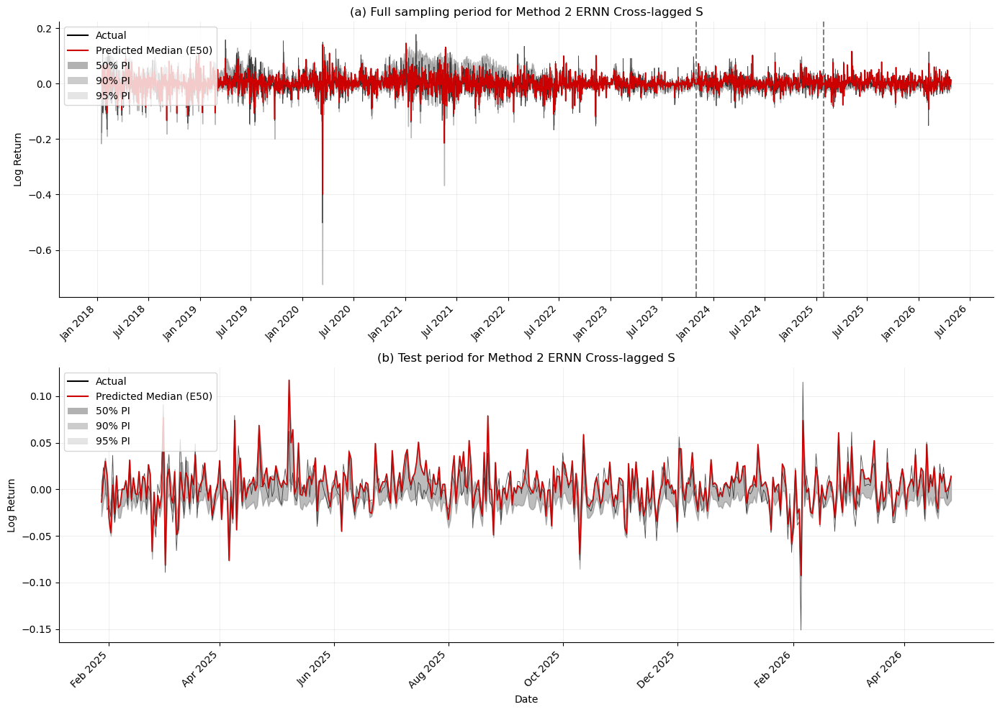

Plot saved to method2_sequential_ernn_s_cross_predictions.png

TEST METRICS -- METHOD 2 ERNN S CROSS-LAGGED
  tau       NLL      ASE
0.025 -2.538870 0.000026
0.050 -2.465625 0.000037
0.250 -2.615564 0.000122
0.500 -2.712803 0.000097
0.750 -2.790072 0.000072
0.950 -2.276498 0.000044
0.975 -2.275780 0.000039

Average NLL: -2.525031
Average ASE: 0.00006249

CROSSOVER ANALYSIS -- FINAL METHOD 2 HYBRID OUTPUT
(0.025, 0.050): 0 (0.00%) <-- TAIL
(0.050, 0.250): 0 (0.00%)
(0.250, 0.500): 0 (0.00%)
(0.500, 0.750): 0 (0.00%)
(0.750, 0.950): 0 (0.00%)
(0.950, 0.975): 0 (0.00%) <-- TAIL

Total violations: 0 (0.00%)
Tail violations: 0 (0.00%)

CONSTRAINT-BINDING RATE -- TEST PERIOD
tau=0.750 | reference=0.500 | 454/454 (100.00%)
tau=0.950 | reference=0.750 | 300/454 (66.08%)
tau=0.975 | reference=0.950 | 454/454 (100.00%)
tau=0.250 | reference=0.500 | 454/454 (100.00%)
tau=0.050 | reference=0.250 | 7/454 (1.54%)
tau=0.025 | reference=0.050 | 454/454 (100.00%)

Saved Method 2 outputs:
  method2_sequ

In [43]:
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from matplotlib.lines import Line2D
from matplotlib.patches import Patch


# ============================================================
# PLOT AND EVALUATE METHOD 2 ERNN S CROSS-LAGGED
# Run the tuning cell/file first. If the in-memory model dictionary
# is unavailable, this code reloads the saved checkpoint.
# ============================================================

m2_ernn_cross_s_plot_levels = [
    0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975
]

m2_ernn_cross_s_plot_order = [
    0.500, 0.750, 0.950, 0.975, 0.250, 0.050, 0.025
]

m2_ernn_cross_s_plot_reference = {
    0.500: None,
    0.750: 0.500,
    0.950: 0.750,
    0.975: 0.950,
    0.250: 0.500,
    0.050: 0.250,
    0.025: 0.050,
}

m2_ernn_cross_s_plot_direction = {
    0.500: None,
    0.750: 'upper',
    0.950: 'upper',
    0.975: 'upper',
    0.250: 'lower',
    0.050: 'lower',
    0.025: 'lower',
}


# ============================================================
# Restore models if the tuning dictionary is not in memory
# ============================================================

if 'm2_ernn_cross_s_final_models' not in globals():
    checkpoint = torch.load(
        'method2_sequential_ernn_s_cross_best.pt',
        map_location='cpu',
        weights_only=False,
    )

    m2_ernn_cross_s_final_models = {}

    for tau in checkpoint['estimation_order']:
        model = M2SequentialERNNCrossS(
            input_dim=X_train.shape[1],
            config=checkpoint['configs'][tau],
            direction=checkpoint['directions'][tau],
        )
        model.load_state_dict(checkpoint['model_state_dicts'][tau])
        model.eval()
        m2_ernn_cross_s_final_models[tau] = model


# ============================================================
# Generate all seven full-sample forecasts sequentially
# ============================================================

def m2_ernn_cross_s_generate_all_predictions(models, y, X):
    predictions = {}
    caviar_outputs = {}
    raw_fnn_outputs = {}
    constrained_fnn_outputs = {}
    sigma_values = {}

    for tau in m2_ernn_cross_s_plot_order:
        reference_tau = m2_ernn_cross_s_plot_reference[tau]
        reference = (
            None
            if reference_tau is None
            else predictions[reference_tau]
        )

        model = models[tau]
        model.eval()

        with torch.no_grad():
            (
                predictions[tau],
                caviar_outputs[tau],
                raw_fnn_outputs[tau],
                constrained_fnn_outputs[tau],
                sigma_values[tau],
            ) = model(y, X, reference)

    return (
        predictions,
        caviar_outputs,
        raw_fnn_outputs,
        constrained_fnn_outputs,
        sigma_values,
    )


m2_ernn_cross_s_X_all = torch.tensor(
    df[feature_cols].values,
    dtype=torch.float32,
)

m2_ernn_cross_s_y_all = torch.tensor(
    df['log_return'].values,
    dtype=torch.float32,
)

(
    m2_ernn_cross_s_all_preds_tensor,
    m2_ernn_cross_s_all_caviar,
    m2_ernn_cross_s_all_raw_fnn,
    m2_ernn_cross_s_all_constrained_fnn,
    m2_ernn_cross_s_sigma,
) = m2_ernn_cross_s_generate_all_predictions(
    models=m2_ernn_cross_s_final_models,
    y=m2_ernn_cross_s_y_all,
    X=m2_ernn_cross_s_X_all,
)

m2_ernn_cross_s_all_preds = {
    tau: prediction.detach().cpu().numpy()
    for tau, prediction in m2_ernn_cross_s_all_preds_tensor.items()
}


# ============================================================
# Plot full and test periods
# ============================================================

m2_ernn_cross_s_all_dates = df.index
m2_ernn_cross_s_test_dates = test_df.index
m2_ernn_cross_s_test_start = len(train_df) + len(val_df)

m2_ernn_cross_s_actual = df['log_return'].values
m2_ernn_cross_s_actual_test = test_df['log_return'].values

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

actual_color = '#000000'
median_color = '#CC0000'
interval_color = '#808080'


def m2_ernn_cross_s_draw_panel(ax, dates, actual, start=None):
    def values(tau):
        series = m2_ernn_cross_s_all_preds[tau]
        return series if start is None else series[start:]

    ax.plot(dates, actual, color=actual_color, linewidth=0.6, alpha=0.7)
    ax.plot(
        dates,
        values(0.500),
        color=median_color,
        linewidth=1.1,
    )
    ax.fill_between(
        dates,
        values(0.025),
        values(0.975),
        color=interval_color,
        alpha=0.20,
    )
    ax.fill_between(
        dates,
        values(0.050),
        values(0.950),
        color=interval_color,
        alpha=0.40,
    )
    ax.fill_between(
        dates,
        values(0.250),
        values(0.750),
        color=interval_color,
        alpha=0.60,
    )
    ax.set_ylabel('Log Return')
    ax.grid(True, alpha=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


m2_ernn_cross_s_draw_panel(
    axes[0],
    m2_ernn_cross_s_all_dates,
    m2_ernn_cross_s_actual,
)
axes[0].axvline(train_df.index[-1], color='gray', linestyle='--')
axes[0].axvline(val_df.index[-1], color='gray', linestyle='--')
axes[0].set_title(
    '(a) Full sampling period for Method 2 ERNN Cross-lagged S'
)
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=6))

m2_ernn_cross_s_draw_panel(
    axes[1],
    m2_ernn_cross_s_test_dates,
    m2_ernn_cross_s_actual_test,
    start=m2_ernn_cross_s_test_start,
)
axes[1].set_title('(b) Test period for Method 2 ERNN Cross-lagged S')
axes[1].set_xlabel('Date')
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=2))

legend_elements = [
    Line2D([0], [0], color=actual_color, label='Actual'),
    Line2D([0], [0], color=median_color, label='Predicted Median (E50)'),
    Patch(facecolor=interval_color, alpha=0.60, label='50% PI'),
    Patch(facecolor=interval_color, alpha=0.40, label='90% PI'),
    Patch(facecolor=interval_color, alpha=0.20, label='95% PI'),
]

for axis in axes:
    axis.legend(handles=legend_elements, loc='upper left')
    plt.setp(axis.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.tight_layout()

m2_ernn_cross_s_plot_name = (
    'method2_sequential_ernn_s_cross_predictions.png'
)
plt.savefig(m2_ernn_cross_s_plot_name, dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print(f'Plot saved to {m2_ernn_cross_s_plot_name}')


# ============================================================
# Test metrics
# ============================================================

m2_ernn_cross_s_y_test = m2_ernn_cross_s_y_all[
    m2_ernn_cross_s_test_start:
]
m2_ernn_cross_s_metric_rows = []

for tau in m2_ernn_cross_s_plot_levels:
    q_test = m2_ernn_cross_s_all_preds_tensor[tau][
        m2_ernn_cross_s_test_start:
    ]
    sigma = m2_ernn_cross_s_sigma[tau]
    nll = m2_ernn_cross_s_loss(
        m2_ernn_cross_s_y_test, q_test, sigma, tau
    ).item()
    ase = m2_ernn_cross_s_ase(
        m2_ernn_cross_s_y_test,
        q_test,
        tau,
    )

    m2_ernn_cross_s_metric_rows.append(
        {
            'tau': tau,
            'NLL': nll,
            'ASE': ase,
        }
    )

m2_ernn_cross_s_metrics_df = pd.DataFrame(m2_ernn_cross_s_metric_rows)
m2_ernn_cross_s_average_nll = m2_ernn_cross_s_metrics_df['NLL'].mean()
m2_ernn_cross_s_average_ase = m2_ernn_cross_s_metrics_df['ASE'].mean()

print('\n' + '=' * 68)
print('TEST METRICS -- METHOD 2 ERNN S CROSS-LAGGED')
print('=' * 68)
print(m2_ernn_cross_s_metrics_df.to_string(index=False))
print(f'\nAverage NLL: {m2_ernn_cross_s_average_nll:.6f}')
print(f'Average ASE: {m2_ernn_cross_s_average_ase:.8f}')


# ============================================================
# Crossover analysis
# ============================================================

m2_ernn_cross_s_pairs = [
    (0.025, 0.050),
    (0.050, 0.250),
    (0.250, 0.500),
    (0.500, 0.750),
    (0.750, 0.950),
    (0.950, 0.975),
]
m2_ernn_cross_s_tail_pairs = [(0.025, 0.050), (0.950, 0.975)]

m2_ernn_cross_s_total = 0
m2_ernn_cross_s_tail_total = 0
m2_ernn_cross_s_crossover_rows = []

print('\n' + '=' * 68)
print('CROSSOVER ANALYSIS -- FINAL METHOD 2 HYBRID OUTPUT')
print('=' * 68)

for lower, upper in m2_ernn_cross_s_pairs:
    lower_test = m2_ernn_cross_s_all_preds_tensor[lower][
        m2_ernn_cross_s_test_start:
    ]
    upper_test = m2_ernn_cross_s_all_preds_tensor[upper][
        m2_ernn_cross_s_test_start:
    ]
    violations = int((lower_test > upper_test).sum().item())
    rate = violations / len(lower_test)

    m2_ernn_cross_s_total += violations
    if (lower, upper) in m2_ernn_cross_s_tail_pairs:
        m2_ernn_cross_s_tail_total += violations

    m2_ernn_cross_s_crossover_rows.append(
        {
            'Lower': lower,
            'Upper': upper,
            'Violations': violations,
            'Rate': rate,
        }
    )

    tail_label = (
        ' <-- TAIL'
        if (lower, upper) in m2_ernn_cross_s_tail_pairs
        else ''
    )
    print(
        f'({lower:.3f}, {upper:.3f}): '
        f'{violations} ({100 * rate:.2f}%){tail_label}'
    )

m2_ernn_cross_s_total_rate = m2_ernn_cross_s_total / (
    len(m2_ernn_cross_s_y_test) * len(m2_ernn_cross_s_pairs)
)
m2_ernn_cross_s_tail_rate = m2_ernn_cross_s_tail_total / (
    len(m2_ernn_cross_s_y_test) * len(m2_ernn_cross_s_tail_pairs)
)

print(
    f'\nTotal violations: {m2_ernn_cross_s_total} '
    f'({100 * m2_ernn_cross_s_total_rate:.2f}%)'
)
print(
    f'Tail violations: {m2_ernn_cross_s_tail_total} '
    f'({100 * m2_ernn_cross_s_tail_rate:.2f}%)'
)


# ============================================================
# Constraint-binding diagnostic
# ============================================================

m2_ernn_cross_s_binding_rows = []

print('\n' + '=' * 68)
print('CONSTRAINT-BINDING RATE -- TEST PERIOD')
print('=' * 68)

for tau in m2_ernn_cross_s_plot_order:
    direction = m2_ernn_cross_s_plot_direction[tau]
    reference_tau = m2_ernn_cross_s_plot_reference[tau]

    if direction is None:
        continue

    model = m2_ernn_cross_s_final_models[tau]
    psi = (
        (1.0 - M2_ERNN_CROSS_S_PSI_MARGIN)
        * torch.sigmoid(model.psi_raw)
    )
    caviar = m2_ernn_cross_s_all_caviar[tau][
        m2_ernn_cross_s_test_start:
    ]
    raw_fnn = m2_ernn_cross_s_all_raw_fnn[tau][
        m2_ernn_cross_s_test_start:
    ]
    reference = m2_ernn_cross_s_all_preds_tensor[reference_tau][
        m2_ernn_cross_s_test_start:
    ]
    raw_hybrid = psi * caviar + (1.0 - psi) * raw_fnn

    if direction == 'upper':
        binding = raw_hybrid < (
            reference + M2_ERNN_CROSS_S_DELTA
        )
    else:
        binding = raw_hybrid > (
            reference - M2_ERNN_CROSS_S_DELTA
        )

    binding_count = int(binding.sum().item())
    binding_rate = binding.float().mean().item()

    m2_ernn_cross_s_binding_rows.append(
        {
            'Tau': tau,
            'Reference': reference_tau,
            'Direction': direction,
            'Binding_Count': binding_count,
            'Binding_Rate': binding_rate,
        }
    )
    print(
        f'tau={tau:.3f} | reference={reference_tau:.3f} | '
        f'{binding_count}/{len(binding)} ({100 * binding_rate:.2f}%)'
    )


# ============================================================
# Save outputs
# ============================================================

m2_ernn_cross_s_metrics_df.to_csv(
    'method2_sequential_ernn_s_cross_test_metrics.csv',
    index=False,
)
pd.DataFrame(m2_ernn_cross_s_crossover_rows).to_csv(
    'method2_sequential_ernn_s_cross_crossover.csv',
    index=False,
)
pd.DataFrame(m2_ernn_cross_s_binding_rows).to_csv(
    'method2_sequential_ernn_s_cross_binding_rates.csv',
    index=False,
)

print('\nSaved Method 2 outputs:')
print('  method2_sequential_ernn_s_cross_predictions.png')
print('  method2_sequential_ernn_s_cross_test_metrics.csv')
print('  method2_sequential_ernn_s_cross_crossover.csv')
print('  method2_sequential_ernn_s_cross_binding_rates.csv')

# Cross over dealing 3

In [46]:
"""Method 3, Specification 1: Hybrid ERNN S cross-lagged.

Run this after the notebook has created the four tensors
``y_train``, ``X_train``, ``y_val`` and ``X_val``.

The median is the corresponding original hybrid model.  Every non-median
network predicts a raw adjacent gap; ``softplus`` makes that gap positive and
the target level is reconstructed from its already-fitted adjacent reference.
There is no fixed epsilon boundary, max/min projection, or crossover penalty.
"""

from __future__ import annotations

import copy
from pathlib import Path

import numpy as np
import optuna
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from optuna.samplers import TPESampler


# ---------------------------------------------------------------------------
# User settings
# ---------------------------------------------------------------------------

LEVELS = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
ESTIMATION_ORDER = [0.500, 0.750, 0.950, 0.975, 0.250, 0.050, 0.025]
REFERENCE_LEVEL = {
    0.500: None,
    0.750: 0.500,
    0.950: 0.750,
    0.975: 0.950,
    0.250: 0.500,
    0.050: 0.250,
    0.025: 0.050,
}
DIRECTION = {
    0.500: None,
    0.750: "upper",
    0.950: "upper",
    0.975: "upper",
    0.250: "lower",
    0.050: "lower",
    0.025: "lower",
}

N_TRIALS = 200
MAX_EPOCHS = 200
BASE_SEED = 2026
PSI_MARGIN = 1e-4
INITIAL_DELTA_BIAS = -4.6  # softplus(-4.6) is about 0.01; trainable.
OUTPUT_DIR = Path("method3_spacing_ernn_s_cross_results")

# This standalone chunk estimates only the model supplied by the user:
# Hybrid ERNN, symmetric form, cross-lagged recursion.
MODELS_TO_RUN = [("ernn", "s", "cross")]


def validate_notebook_inputs():
    required = ("y_train", "X_train", "y_val", "X_val")
    missing = [name for name in required if name not in globals()]
    if missing:
        raise NameError(
            "Create these notebook tensors before running Method 3: "
            + ", ".join(missing)
        )
    for y_name, x_name in (("y_train", "X_train"), ("y_val", "X_val")):
        y_value, x_value = globals()[y_name], globals()[x_name]
        if not isinstance(y_value, torch.Tensor) or not isinstance(x_value, torch.Tensor):
            raise TypeError(f"{y_name} and {x_name} must be torch tensors.")
        if y_value.ndim != 1 or x_value.ndim != 2 or len(y_value) != len(x_value):
            raise ValueError(f"{y_name} must be (T,) and {x_name} must be (T,p).")


# ---------------------------------------------------------------------------
# Generic Method 3 model
# ---------------------------------------------------------------------------

class Method3SpacingModel(nn.Module):
    """One sequential level model.

    direction=None is the median hybrid model.  Otherwise the network is a
    pure learned-spacing model and deliberately has no redundant statistical
    or mixing parameters.
    """

    def __init__(self, input_dim, config, distribution, form, lag, direction=None):
        super().__init__()
        if distribution not in {"qrnn", "ernn"}:
            raise ValueError("distribution must be 'qrnn' or 'ernn'.")
        if form not in {"s", "a", "si"}:
            raise ValueError("form must be 's', 'a', or 'si'.")
        if lag not in {"self", "cross"}:
            raise ValueError("lag must be 'self' or 'cross'.")

        self.distribution = distribution
        self.form = form
        self.lag = lag
        self.direction = direction

        # Statistical and mixing parameters are identifiable only for median.
        if direction is None:
            self.persistence_raw = nn.Parameter(torch.tensor(1.386))
            self.news1_raw = nn.Parameter(torch.tensor(0.3))
            if form in {"a", "si"}:
                self.news2_raw = nn.Parameter(torch.tensor(0.3))
            self.psi_raw = nn.Parameter(torch.tensor(0.0))

        self.sigma_raw = nn.Parameter(torch.tensor(0.5))
        fnn_input_dim = input_dim if direction is None else input_dim + 1
        layers = []
        previous_dim = fnn_input_dim
        for index in range(config["n_hidden_layers"]):
            hidden_dim = config[f"hidden_dim_{index}"]
            layers.append(nn.Linear(previous_dim, hidden_dim))
            if config["layernorm"]:
                layers.append(nn.LayerNorm(hidden_dim))
            layers.append(self._activation(config["activation"]))
            if config["dropout"] > 0:
                layers.append(nn.Dropout(config["dropout"]))
            previous_dim = hidden_dim
        layers.append(nn.Linear(previous_dim, 1))
        self.fnn = nn.Sequential(*layers)
        self._initialise_fnn(config["weight_init"])

        if direction is not None:
            nn.init.constant_(self.fnn[-1].bias, INITIAL_DELTA_BIAS)

    @staticmethod
    def _activation(name):
        return {
            "relu": nn.ReLU(),
            "elu": nn.ELU(),
            "gelu": nn.GELU(),
            "tanh": nn.Tanh(),
        }[name]

    def _initialise_fnn(self, method):
        for module in self.fnn.modules():
            if isinstance(module, nn.Linear):
                if method == "glorot":
                    nn.init.xavier_uniform_(module.weight)
                else:
                    nn.init.kaiming_uniform_(module.weight)
                if module.bias is not None:
                    nn.init.zeros_(module.bias)

    def _statistical_update(self, previous_state, previous_y):
        persistence = torch.sigmoid(self.persistence_raw)
        news1 = F.softplus(self.news1_raw)
        if self.form == "s":
            return persistence * previous_state + news1 * torch.abs(previous_y)
        if self.form == "a":
            news2 = F.softplus(self.news2_raw)
            return (
                persistence * previous_state
                + news1 * torch.clamp(previous_y, min=0)
                + news2 * torch.clamp(-previous_y, min=0)
            )
        news2 = F.softplus(self.news2_raw)
        absolute_y = torch.abs(previous_y)
        return (
            persistence * previous_state
            + news1 * absolute_y
            + news2 * previous_state * absolute_y
        )

    def forward(self, y, X, q_reference=None, initial_state=None, initial_y=None):
        sigma = F.softplus(self.sigma_raw) + 1e-6

        # Six non-median models: directly learn a positive adjacent spacing.
        if self.direction is not None:
            if q_reference is None:
                raise ValueError("Non-median levels require q_reference.")
            reference = q_reference.detach()
            raw_delta = self.fnn(
                torch.cat((X, reference.unsqueeze(1)), dim=1)
            ).squeeze(-1)
            delta = F.softplus(raw_delta)
            prediction = reference + delta if self.direction == "upper" else reference - delta
            return prediction, torch.zeros_like(prediction), raw_delta, delta, sigma

        # Median: original hybrid statistical-neural specification.
        if (initial_state is None) != (initial_y is None):
            raise ValueError("initial_state and initial_y must be supplied together.")
        has_initial_state = initial_state is not None
        previous_state = initial_state if has_initial_state else y.new_zeros(())
        fnn_median = self.fnn(X).squeeze(-1)
        psi = (1.0 - PSI_MARGIN) * torch.sigmoid(self.psi_raw)
        predictions, statistical_outputs = [], []

        for t in range(len(y)):
            if t == 0 and not has_initial_state:
                statistical_t = y.new_zeros(())
                hybrid_t = y.new_zeros(())
            else:
                previous_y = initial_y if t == 0 else y[t - 1]
                statistical_t = self._statistical_update(previous_state, previous_y)
                hybrid_t = psi * statistical_t + (1.0 - psi) * fnn_median[t]
            statistical_outputs.append(statistical_t)
            predictions.append(hybrid_t)
            # Settled convention used by the earlier code:
            # self -> previous pure statistical output; cross -> previous hybrid.
            previous_state = statistical_t if self.lag == "self" else hybrid_t

        prediction = torch.stack(predictions)
        statistical = torch.stack(statistical_outputs)
        return prediction, statistical, fnn_median, None, sigma


# ---------------------------------------------------------------------------
# Distribution-specific objectives and calibration metrics
# ---------------------------------------------------------------------------

def single_level_nll(y, location, sigma, level, distribution):
    residual = y - location
    level_tensor = torch.tensor(level, dtype=y.dtype, device=y.device)
    if distribution == "qrnn":
        indicator = (residual < 0).to(y.dtype)
        rho = residual * (level_tensor - indicator)
        return (
            -torch.log(level_tensor * (1.0 - level_tensor))
            + torch.log(sigma)
            + rho / sigma
        ).mean()

    weight = torch.abs(level_tensor - (residual < 0).to(y.dtype))
    omega = weight * residual.square()
    constant = (
        torch.log(
            torch.sqrt(torch.pi / level_tensor)
            + torch.sqrt(torch.pi / (1.0 - level_tensor))
        )
        - np.log(2.0)
    )
    return (torch.log(sigma) + constant + omega / sigma.square()).mean()


def qrnn_calibration(y, location, level):
    if level <= 0.5:
        empirical = (y <= location).float().mean().item()
        target = level
    else:
        empirical = (y > location).float().mean().item()
        target = 1.0 - level
    crp = empirical / target
    return {"hit_rate": (y <= location).float().mean().item(),
            "hre": abs((y <= location).float().mean().item() - level),
            "calibration": crp,
            "calibration_penalty": (crp - 1.0) ** 2}


def ernn_calibration(y, location, level):
    residual = y - location
    weights = torch.where(
        residual >= 0,
        torch.full_like(residual, level),
        torch.full_like(residual, 1.0 - level),
    )
    ase = (weights * residual.square()).mean().item()
    return {"ase": ase, "calibration": ase, "calibration_penalty": ase}


# ---------------------------------------------------------------------------
# Tuning helpers
# ---------------------------------------------------------------------------

def suggest_config(trial):
    config = {
        "n_hidden_layers": trial.suggest_int("n_hidden_layers", 1, 3),
        "activation": trial.suggest_categorical("activation", ["relu", "elu", "gelu", "tanh"]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.5),
        "layernorm": trial.suggest_categorical("layernorm", [True, False]),
        "weight_init": trial.suggest_categorical("weight_init", ["glorot", "he"]),
        "lr": trial.suggest_float("lr", 1e-4, 5e-2, log=True),
        "optimizer": trial.suggest_categorical("optimizer", ["adam", "adamw"]),
        "weight_decay": trial.suggest_float("weight_decay", 0.0, 1e-4),
        "gradient_clip": trial.suggest_categorical("gradient_clip", [0.1, 1.0, 5.0]),
        "patience": trial.suggest_categorical("patience", [10, 20, 30]),
    }
    for index in range(config["n_hidden_layers"]):
        config[f"hidden_dim_{index}"] = trial.suggest_int(f"hidden_dim_{index}", 32, 256)
    return config


def make_optimizer(model, config):
    optimizer_class = torch.optim.Adam if config["optimizer"] == "adam" else torch.optim.AdamW
    return optimizer_class(model.parameters(), lr=config["lr"], weight_decay=config["weight_decay"])


def median_validation_state(model, statistical_train, prediction_train):
    return statistical_train[-1] if model.lag == "self" else prediction_train[-1]


def predict_train_val(model, direction, q_reference_train=None, q_reference_val=None):
    model.eval()
    with torch.no_grad():
        q_train, stat_train, _, delta_train, _ = model(
            y_train, X_train, q_reference_train
        )
        if direction is None:
            q_val, _, _, delta_val, sigma = model(
                y_val,
                X_val,
                initial_state=median_validation_state(model, stat_train, q_train),
                initial_y=y_train[-1],
            )
        else:
            q_val, _, _, delta_val, sigma = model(y_val, X_val, q_reference_val)
    return q_train.detach(), q_val.detach(), delta_train, delta_val, sigma.detach()


def train_config(spec, config, level, direction, q_ref_train, q_ref_val, seed):
    distribution, form, lag = spec
    torch.manual_seed(seed)
    model = Method3SpacingModel(
        X_train.shape[1], config, distribution, form, lag, direction
    )
    optimizer = make_optimizer(model, config)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", patience=10, factor=0.5, min_lr=1e-6
    )
    best_loss, counter, best_state = float("inf"), 0, None

    for _ in range(MAX_EPOCHS):
        model.train()
        optimizer.zero_grad()
        q_train, _, _, _, sigma = model(y_train, X_train, q_ref_train)
        loss = single_level_nll(y_train[1:], q_train[1:], sigma, level, distribution)
        if not torch.isfinite(loss):
            return None
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), config["gradient_clip"])
        optimizer.step()

        model.eval()
        with torch.no_grad():
            _, q_val, _, _, sigma_val = predict_train_val(
                model, direction, q_ref_train, q_ref_val
            )
            val_loss = single_level_nll(y_val, q_val, sigma_val, level, distribution)
        scheduler.step(val_loss.item())
        if val_loss.item() < best_loss:
            best_loss, counter = val_loss.item(), 0
            best_state = copy.deepcopy(model.state_dict())
        else:
            counter += 1
            if counter >= config["patience"]:
                break

    if best_state is None:
        return None
    model.load_state_dict(best_state)
    return model


def transformed_median_parameters(model):
    if model.direction is not None:
        return {}
    result = {
        "persistence": torch.sigmoid(model.persistence_raw).item(),
        "news1": F.softplus(model.news1_raw).item(),
        "psi": ((1.0 - PSI_MARGIN) * torch.sigmoid(model.psi_raw)).item(),
    }
    result["news2"] = (
        F.softplus(model.news2_raw).item() if hasattr(model, "news2_raw") else np.nan
    )
    return result


def evaluate(model, level, direction, q_ref_train, q_ref_val):
    _, q_val, _, delta_val, sigma = predict_train_val(
        model, direction, q_ref_train, q_ref_val
    )
    metrics = {
        "nll": single_level_nll(
            y_val, q_val, sigma, level, model.distribution
        ).item(),
        "sigma": (F.softplus(model.sigma_raw) + 1e-6).item(),
        "mean_delta": np.nan if delta_val is None else delta_val.mean().item(),
        "min_delta": np.nan if delta_val is None else delta_val.min().item(),
        "max_delta": np.nan if delta_val is None else delta_val.max().item(),
        "sd_delta": np.nan if delta_val is None else delta_val.std(unbiased=False).item(),
    }
    metrics.update(
        qrnn_calibration(y_val, q_val, level)
        if model.distribution == "qrnn"
        else ernn_calibration(y_val, q_val, level)
    )
    metrics.update(transformed_median_parameters(model))
    return metrics


def select_trial(study):
    trials = [
        trial for trial in study.trials
        if trial.state == optuna.trial.TrialState.COMPLETE
        and trial.value is not None
        and np.isfinite(trial.value)
        and "calibration_penalty" in trial.user_attrs
    ]
    if not trials:
        raise RuntimeError("No valid completed Optuna trials.")
    for rank, trial in enumerate(sorted(trials, key=lambda x: x.user_attrs["nll"]), 1):
        trial._rank_nll = rank
    for rank, trial in enumerate(
        sorted(trials, key=lambda x: x.user_attrs["calibration_penalty"]), 1
    ):
        trial._rank_calibration = rank
    best = min(
        trials,
        key=lambda x: (
            x._rank_nll + x._rank_calibration,
            x.user_attrs["nll"],
            x.user_attrs["calibration_penalty"],
            x.number,
        ),
    )
    return best, trials


def count_crossovers(predictions):
    matrix = torch.stack([predictions[level] for level in LEVELS], dim=1)
    violations = matrix[:, :-1] > matrix[:, 1:]
    pair_counts = violations.sum(dim=0)
    return {
        "crossover": int(violations.sum().item()),
        "tail": int((pair_counts[0] + pair_counts[-1]).item()),
    }


def run_one_model(spec):
    distribution, form, lag = spec
    model_key = f"{distribution}_{form}_{lag}"
    model_dir = OUTPUT_DIR / model_key
    model_dir.mkdir(parents=True, exist_ok=True)
    print("\n" + "=" * 78)
    print(f"METHOD 3 SPACING: {distribution.upper()} {form.upper()} {lag.upper()}")
    print("=" * 78)

    models, configs, metrics_by_level = {}, {}, {}
    train_predictions, val_predictions = {}, {}
    train_deltas, val_deltas = {}, {}

    for order_index, level in enumerate(ESTIMATION_ORDER):
        reference_level = REFERENCE_LEVEL[level]
        direction = DIRECTION[level]
        q_ref_train = None if reference_level is None else train_predictions[reference_level]
        q_ref_val = None if reference_level is None else val_predictions[reference_level]
        seed = BASE_SEED + 1000 * MODELS_TO_RUN.index(spec) + order_index

        def objective(trial):
            config = suggest_config(trial)
            model = train_config(
                spec, config, level, direction, q_ref_train, q_ref_val, seed
            )
            if model is None:
                return float("inf")
            trial_metrics = evaluate(model, level, direction, q_ref_train, q_ref_val)
            for name, value in trial_metrics.items():
                trial.set_user_attr(name, value)
            return trial_metrics["nll"]

        print(
            f"Level={level:.3f} | reference={reference_level} | "
            f"direction={direction} | trials={N_TRIALS}"
        )
        study = optuna.create_study(
            direction="minimize", sampler=TPESampler(seed=seed)
        )
        study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=True)
        best_trial, valid_trials = select_trial(study)

        ranking_records = []
        for trial in valid_trials:
            record = {
                "distribution": distribution,
                "form": form,
                "lag": lag,
                "level": level,
                "reference_level": reference_level,
                "direction": direction,
                "trial": trial.number,
                "nll": trial.user_attrs["nll"],
                "calibration": trial.user_attrs["calibration"],
                "calibration_penalty": trial.user_attrs["calibration_penalty"],
                "rank_nll": trial._rank_nll,
                "rank_calibration": trial._rank_calibration,
                "sum_rank": trial._rank_nll + trial._rank_calibration,
            }
            record.update(trial.user_attrs)
            record.update(trial.params)
            ranking_records.append(record)
        pd.DataFrame(ranking_records).sort_values(
            ["sum_rank", "nll", "calibration_penalty"]
        ).to_csv(model_dir / f"ranking_level_{level:.3f}.csv", index=False)

        best_config = best_trial.params.copy()
        final_model = train_config(
            spec, best_config, level, direction, q_ref_train, q_ref_val, seed
        )
        if final_model is None:
            raise RuntimeError(f"Selected refit failed for {model_key}, level={level}.")
        final_metrics = evaluate(
            final_model, level, direction, q_ref_train, q_ref_val
        )
        q_train, q_val, delta_train, delta_val, _ = predict_train_val(
            final_model, direction, q_ref_train, q_ref_val
        )
        models[level], configs[level] = final_model, best_config
        metrics_by_level[level] = final_metrics
        train_predictions[level], val_predictions[level] = q_train, q_val
        train_deltas[level], val_deltas[level] = delta_train, delta_val

        print(
            f"Selected trial #{best_trial.number} | "
            f"val NLL={final_metrics['nll']:.6f} | "
            f"calibration={final_metrics['calibration']:.6f} | "
            f"mean delta={final_metrics['mean_delta']:.6f}"
        )

    crossing = count_crossovers(val_predictions)
    average_nll = float(np.mean([metrics_by_level[x]["nll"] for x in LEVELS]))
    if distribution == "qrnn":
        average_secondary = float(np.mean([metrics_by_level[x]["hre"] for x in LEVELS]))
        secondary_name = "hre"
    else:
        average_secondary = float(np.mean([metrics_by_level[x]["ase"] for x in LEVELS]))
        secondary_name = "ase"

    checkpoint = {
        "model_name": f"Method 3 spacing {distribution.upper()} {form.upper()} {lag}",
        "specification": "learned_positive_time_varying_adjacent_spacing",
        "distribution": distribution,
        "form": form,
        "lag": lag,
        "levels": LEVELS,
        "estimation_order": ESTIMATION_ORDER,
        "reference_level": REFERENCE_LEVEL,
        "direction": DIRECTION,
        "configs": configs,
        "model_state_dicts": {level: model.state_dict() for level, model in models.items()},
        "validation_metrics": metrics_by_level,
        "validation_summary": {
            "average_nll": average_nll,
            f"average_{secondary_name}": average_secondary,
            **crossing,
        },
    }
    checkpoint_path = model_dir / f"method3_spacing_{model_key}_best.pt"
    torch.save(checkpoint, checkpoint_path)

    level_rows = []
    for level in LEVELS:
        level_rows.append({"level": level, **metrics_by_level[level]})
    pd.DataFrame(level_rows).to_csv(model_dir / "validation_by_level.csv", index=False)

    summary = {
        "distribution": distribution,
        "form": form.upper(),
        "lag": lag,
        "average_nll": average_nll,
        "average_hre": average_secondary if distribution == "qrnn" else np.nan,
        "average_ase": average_secondary if distribution == "ernn" else np.nan,
        **crossing,
        "checkpoint": str(checkpoint_path),
    }
    pd.DataFrame([summary]).to_csv(model_dir / "validation_summary.csv", index=False)
    print(f"Saved {checkpoint_path}")
    return summary


def main():
    validate_notebook_inputs()
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    summaries = []
    for spec in MODELS_TO_RUN:
        summaries.append(run_one_model(spec))
        pd.DataFrame(summaries).to_csv(
            OUTPUT_DIR / "method3_ernn_s_cross_validation_summary.csv", index=False
        )
    print("\nMethod 3 ERNN S cross-lagged estimation is complete.")
    print(pd.DataFrame(summaries).to_string(index=False))


if __name__ == "__main__":
    main()

[I 2026-08-16 16:42:36,329] A new study created in memory with name: no-name-d1596e6c-6a6c-4df1-8f25-912698ad23c8



METHOD 3 SPACING: ERNN S CROSS
Level=0.500 | reference=None | direction=None | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 16:43:45,126] Trial 0 finished with value: 0.8010232448577881 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.49377524711883497, 'layernorm': False, 'weight_init': 'he', 'lr': 0.0006552020421842752, 'optimizer': 'adam', 'weight_decay': 8.940884610144999e-05, 'gradient_clip': 5.0, 'patience': 30, 'hidden_dim_0': 38}. Best is trial 0 with value: 0.8010232448577881.
[I 2026-08-16 16:44:49,240] Trial 1 finished with value: -0.23213183879852295 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.07458356653667625, 'layernorm': False, 'weight_init': 'he', 'lr': 0.006969178688110181, 'optimizer': 'adam', 'weight_decay': 2.574006001095316e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 102}. Best is trial 1 with value: -0.23213183879852295.
[I 2026-08-16 16:44:57,299] Trial 2 finished with value: 0.9062902927398682 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.37112272198735796, 'layernorm': Tru

[I 2026-08-16 18:48:43,225] A new study created in memory with name: no-name-7d040076-7d41-4772-891a-b4a6b890f090


Selected trial #196 | val NLL=-2.622237 | calibration=0.000140 | mean delta=nan
Level=0.750 | reference=0.5 | direction=upper | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 18:48:49,387] Trial 0 finished with value: 0.8684863448143005 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.05498225107357002, 'layernorm': True, 'weight_init': 'he', 'lr': 0.001007193483885585, 'optimizer': 'adam', 'weight_decay': 5.273500806799822e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 146, 'hidden_dim_1': 251, 'hidden_dim_2': 82}. Best is trial 0 with value: 0.8684863448143005.
[I 2026-08-16 18:48:50,569] Trial 1 finished with value: 0.982307493686676 and parameters: {'n_hidden_layers': 1, 'activation': 'tanh', 'dropout': 0.025049491897366605, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.00015333527280501685, 'optimizer': 'adam', 'weight_decay': 1.7649100996182442e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 55}. Best is trial 0 with value: 0.8684863448143005.
[I 2026-08-16 18:48:54,038] Trial 2 finished with value: -2.1827328205108643 and parameters: {'n_hidden_layers': 2, 'activation': 'elu', 'dropo

[I 2026-08-16 18:53:40,210] A new study created in memory with name: no-name-cf3a3abe-514f-4fc0-b9ba-ef5767e612ab


Selected trial #162 | val NLL=-2.746426 | calibration=0.000094 | mean delta=0.006313
Level=0.950 | reference=0.75 | direction=upper | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 18:53:41,364] Trial 0 finished with value: 1.529293179512024 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.16735790150049712, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.00021817327615682693, 'optimizer': 'adamw', 'weight_decay': 1.8728142576828257e-05, 'gradient_clip': 1.0, 'patience': 30, 'hidden_dim_0': 153}. Best is trial 0 with value: 1.529293179512024.
[I 2026-08-16 18:53:44,088] Trial 1 finished with value: -2.454667568206787 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.16523551215002763, 'layernorm': True, 'weight_init': 'he', 'lr': 0.03513192693765672, 'optimizer': 'adam', 'weight_decay': 8.393147658894028e-05, 'gradient_clip': 1.0, 'patience': 20, 'hidden_dim_0': 151, 'hidden_dim_1': 164}. Best is trial 1 with value: -2.454667568206787.
[I 2026-08-16 18:53:46,239] Trial 2 finished with value: 0.7999324202537537 and parameters: {'n_hidden_layers': 1, 'activation': 'relu', 'dropout': 0.40467624618546

[I 2026-08-16 19:01:20,941] A new study created in memory with name: no-name-e5d71b15-4e38-40a0-a1f3-4a0e86485bc4


Selected trial #193 | val NLL=-2.704353 | calibration=0.000034 | mean delta=0.010221
Level=0.975 | reference=0.95 | direction=upper | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 19:01:23,394] Trial 0 finished with value: 0.7189080715179443 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.2759148998079755, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.007024831190142553, 'optimizer': 'adamw', 'weight_decay': 4.1560787907729995e-05, 'gradient_clip': 1.0, 'patience': 10, 'hidden_dim_0': 247}. Best is trial 0 with value: 0.7189080715179443.
[I 2026-08-16 19:01:25,617] Trial 1 finished with value: -2.6270501613616943 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.4187938977063561, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.03427756963192871, 'optimizer': 'adam', 'weight_decay': 6.657050304270963e-05, 'gradient_clip': 0.1, 'patience': 30, 'hidden_dim_0': 246}. Best is trial 1 with value: -2.6270501613616943.
[I 2026-08-16 19:01:26,556] Trial 2 finished with value: -1.1472089290618896 and parameters: {'n_hidden_layers': 1, 'activation': 'elu', 'dropout': 0.12720587027501107, 'layernorm': F

[I 2026-08-16 20:08:42,036] A new study created in memory with name: no-name-4877a3c1-427d-4286-af92-832304a31fbe


Selected trial #116 | val NLL=-2.672556 | calibration=0.000021 | mean delta=0.003314
Level=0.250 | reference=0.5 | direction=lower | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 20:08:44,427] Trial 0 finished with value: 0.36806416511535645 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11794446303511014, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.004456352949789044, 'optimizer': 'adam', 'weight_decay': 9.18884108501482e-05, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 171, 'hidden_dim_1': 72}. Best is trial 0 with value: 0.36806416511535645.
[I 2026-08-16 20:08:47,835] Trial 1 finished with value: 0.9886722564697266 and parameters: {'n_hidden_layers': 3, 'activation': 'gelu', 'dropout': 0.030560119781983197, 'layernorm': True, 'weight_init': 'glorot', 'lr': 0.00010374739355459913, 'optimizer': 'adamw', 'weight_decay': 5.825305061215891e-06, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 106, 'hidden_dim_1': 96, 'hidden_dim_2': 171}. Best is trial 0 with value: 0.36806416511535645.
[I 2026-08-16 20:08:52,419] Trial 2 finished with value: 0.7614073753356934 and parameters: {'n_hidden_layers': 3, 

[I 2026-08-16 21:28:37,901] A new study created in memory with name: no-name-e3c65032-8fe8-4b1d-a826-4d4b05f4acb6


Selected trial #171 | val NLL=-2.711095 | calibration=0.000102 | mean delta=0.008400
Level=0.050 | reference=0.25 | direction=lower | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 21:28:40,671] Trial 0 finished with value: 0.5040253400802612 and parameters: {'n_hidden_layers': 2, 'activation': 'tanh', 'dropout': 0.11155263989652436, 'layernorm': False, 'weight_init': 'glorot', 'lr': 0.007027131382827591, 'optimizer': 'adam', 'weight_decay': 1.3627456384020455e-05, 'gradient_clip': 0.1, 'patience': 20, 'hidden_dim_0': 210, 'hidden_dim_1': 162}. Best is trial 0 with value: 0.5040253400802612.
[I 2026-08-16 21:28:43,805] Trial 1 finished with value: -0.7739521861076355 and parameters: {'n_hidden_layers': 3, 'activation': 'elu', 'dropout': 0.09630890988459678, 'layernorm': False, 'weight_init': 'he', 'lr': 0.014080280114638532, 'optimizer': 'adam', 'weight_decay': 6.431370011304687e-05, 'gradient_clip': 0.1, 'patience': 10, 'hidden_dim_0': 88, 'hidden_dim_1': 196, 'hidden_dim_2': 94}. Best is trial 1 with value: -0.7739521861076355.
[I 2026-08-16 21:28:45,528] Trial 2 finished with value: 1.4520660638809204 and parameters: {'n_hidden_layers': 2, 'activ

[I 2026-08-16 23:11:13,704] A new study created in memory with name: no-name-c654133b-28f1-42dc-91d8-fda53bccfee0


Selected trial #154 | val NLL=-2.597408 | calibration=0.000043 | mean delta=0.008507
Level=0.025 | reference=0.05 | direction=lower | trials=200


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-08-16 23:11:17,010] Trial 0 finished with value: 0.6448416709899902 and parameters: {'n_hidden_layers': 3, 'activation': 'relu', 'dropout': 0.11110238679748752, 'layernorm': False, 'weight_init': 'he', 'lr': 0.007412946243424984, 'optimizer': 'adam', 'weight_decay': 2.0378044529961404e-05, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 189, 'hidden_dim_1': 194, 'hidden_dim_2': 105}. Best is trial 0 with value: 0.6448416709899902.
[I 2026-08-16 23:11:20,049] Trial 1 finished with value: 1.5522007942199707 and parameters: {'n_hidden_layers': 3, 'activation': 'elu', 'dropout': 0.40125521853112683, 'layernorm': False, 'weight_init': 'he', 'lr': 0.002129411642087111, 'optimizer': 'adamw', 'weight_decay': 1.3495676574961092e-06, 'gradient_clip': 5.0, 'patience': 20, 'hidden_dim_0': 133, 'hidden_dim_1': 222, 'hidden_dim_2': 66}. Best is trial 0 with value: 0.6448416709899902.
[I 2026-08-16 23:11:21,219] Trial 2 finished with value: 1.6965930461883545 and parameters: {'n_hidden_

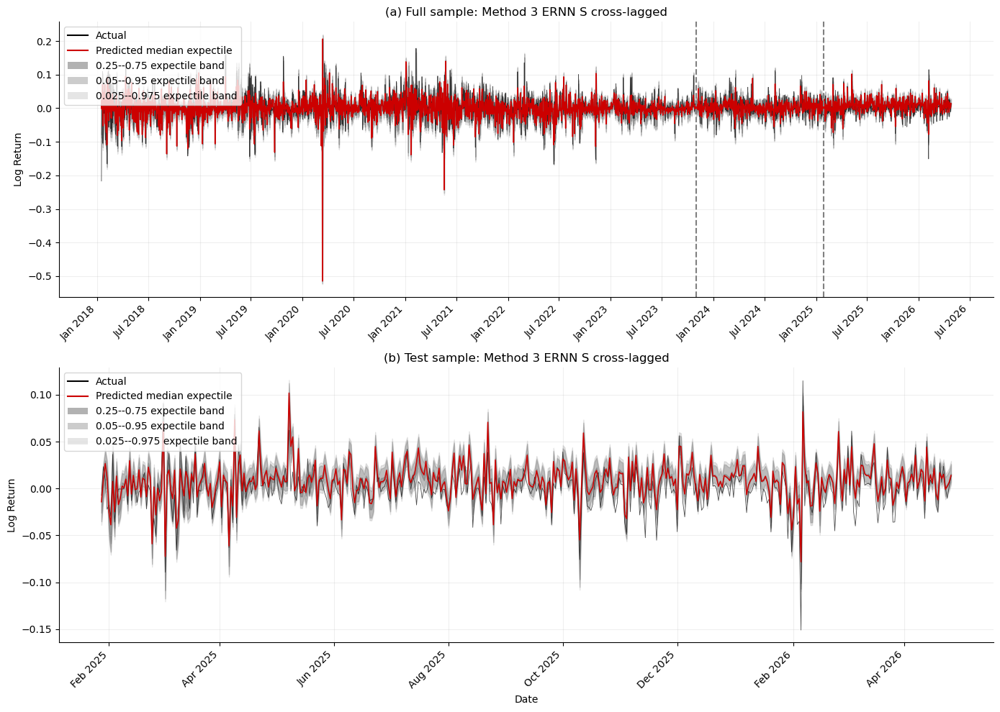


METHOD 3 ERNN S CROSS-LAGGED -- TEST RESULTS
                model  test_T  average_nll  average_ase  crossover  tail
Method 3 ERNN S Cross     454    -2.577144      0.00007          0     0

Per-level results:
  tau       nll      ase    sigma
0.025 -2.255296 0.000044 0.007832
0.050 -2.311369 0.000064 0.008725
0.250 -2.599329 0.000130 0.015615
0.500 -2.672377 0.000118 0.021232
0.750 -2.804898 0.000080 0.015589
0.950 -2.721898 0.000033 0.008776
0.975 -2.674840 0.000020 0.006872

Learned-spacing diagnostics:
  tau  reference_tau direction  mean_delta    min_delta  max_delta     sd_delta  near_zero_count  near_zero_rate
0.025           0.05     lower    0.003028 2.375870e-03   0.003890 2.992605e-04                0        0.000000
0.050           0.25     lower    0.007997 5.320188e-03   0.009243 1.012997e-03                0        0.000000
0.250           0.50     lower    0.003231 1.426085e-07   0.041989 5.600385e-03                4        0.008811
0.750           0.50     upper    

In [48]:
"""Plot and evaluate Method 3 ERNN S cross-lagged on the test sample.

Run after the tuning/data-preparation code. Expected notebook objects:
df, train_df, val_df, test_df, feature_cols, X_train and Method3SpacingModel.
"""

from pathlib import Path

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from matplotlib.lines import Line2D
from matplotlib.patches import Patch


LEVELS = [0.025, 0.050, 0.250, 0.500, 0.750, 0.950, 0.975]
ORDER = [0.500, 0.750, 0.950, 0.975, 0.250, 0.050, 0.025]
REFERENCE = {
    0.500: None,
    0.750: 0.500,
    0.950: 0.750,
    0.975: 0.950,
    0.250: 0.500,
    0.050: 0.250,
    0.025: 0.050,
}
DIRECTION = {
    0.500: None,
    0.750: "upper",
    0.950: "upper",
    0.975: "upper",
    0.250: "lower",
    0.050: "lower",
    0.025: "lower",
}

RESULT_DIR = Path("method3_spacing_ernn_s_cross_results")
MODEL_DIR = RESULT_DIR / "ernn_s_cross"
CHECKPOINT_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross_best.pt"
PLOT_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross.png"
METRICS_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross_test_metrics.csv"
SUMMARY_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross_test_summary.csv"
DELTA_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross_delta_summary.csv"
PREDICTIONS_PATH = MODEL_DIR / "method3_spacing_ernn_s_cross_test_predictions.csv"


required_objects = (
    "df", "train_df", "val_df", "test_df", "feature_cols", "X_train"
)
missing = [name for name in required_objects if name not in globals()]
if missing:
    raise NameError("Run the data-preparation cells first. Missing: " + ", ".join(missing))

if "Method3SpacingModel" not in globals():
    from method3_spacing_ernn_s_cross_tuning import Method3SpacingModel

if not CHECKPOINT_PATH.exists():
    raise FileNotFoundError(
        f"Checkpoint not found: {CHECKPOINT_PATH}. Run the tuning code first."
    )


# ---------------------------------------------------------------------------
# Reload all seven selected level models
# ---------------------------------------------------------------------------

checkpoint = torch.load(CHECKPOINT_PATH, map_location="cpu", weights_only=False)
if checkpoint.get("distribution") != "ernn":
    raise ValueError("The checkpoint is not an ERNN checkpoint.")
if checkpoint.get("form") != "s" or checkpoint.get("lag") != "cross":
    raise ValueError("The checkpoint is not the ERNN S cross-lagged model.")

models = {}
for level in ORDER:
    model = Method3SpacingModel(
        input_dim=X_train.shape[1],
        config=checkpoint["configs"][level],
        distribution="ernn",
        form="s",
        lag="cross",
        direction=checkpoint["direction"][level],
    )
    model.load_state_dict(checkpoint["model_state_dicts"][level])
    model.eval()
    models[level] = model


# ---------------------------------------------------------------------------
# Generate full-sample forecasts sequentially from the median outwards
# ---------------------------------------------------------------------------

X_all = torch.tensor(df[feature_cols].values, dtype=torch.float32)
y_all = torch.tensor(df["log_return"].values, dtype=torch.float32)
predictions, deltas, sigmas = {}, {}, {}

for level in ORDER:
    reference_level = REFERENCE[level]
    reference = None if reference_level is None else predictions[reference_level]
    with torch.no_grad():
        prediction, _, _, delta, sigma = models[level](y_all, X_all, reference)
    predictions[level] = prediction.detach()
    deltas[level] = None if delta is None else delta.detach()
    sigmas[level] = sigma.detach()

test_start = len(train_df) + len(val_df)
y_test = y_all[test_start:]
test_dates = test_df.index

if len(y_test) != len(test_dates):
    raise ValueError("The calculated test slice does not match test_df.")


# ---------------------------------------------------------------------------
# Plot full sample and test sample
# ---------------------------------------------------------------------------

prediction_np = {level: predictions[level].cpu().numpy() for level in LEVELS}
actual_np = df["log_return"].to_numpy()


def draw_panel(axis, dates, actual, start=None):
    def values(level):
        series = prediction_np[level]
        return series if start is None else series[start:]

    axis.plot(dates, actual, color="#000000", linewidth=0.6, alpha=0.70)
    axis.plot(dates, values(0.500), color="#CC0000", linewidth=1.1)
    axis.fill_between(dates, values(0.025), values(0.975), color="#808080", alpha=0.20)
    axis.fill_between(dates, values(0.050), values(0.950), color="#808080", alpha=0.40)
    axis.fill_between(dates, values(0.250), values(0.750), color="#808080", alpha=0.60)
    axis.set_ylabel("Log Return")
    axis.grid(True, alpha=0.20)
    axis.spines["top"].set_visible(False)
    axis.spines["right"].set_visible(False)


figure, axes = plt.subplots(2, 1, figsize=(14, 10))
draw_panel(axes[0], df.index, actual_np)
axes[0].axvline(train_df.index[-1], color="gray", linestyle="--")
axes[0].axvline(val_df.index[-1], color="gray", linestyle="--")
axes[0].set_title("(a) Full sample: Method 3 ERNN S cross-lagged")
axes[0].xaxis.set_major_locator(mdates.MonthLocator(interval=6))
axes[0].xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))

draw_panel(axes[1], test_dates, test_df["log_return"].to_numpy(), start=test_start)
axes[1].set_title("(b) Test sample: Method 3 ERNN S cross-lagged")
axes[1].set_xlabel("Date")
axes[1].xaxis.set_major_locator(mdates.MonthLocator(interval=2))
axes[1].xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))

legend = [
    Line2D([0], [0], color="#000000", label="Actual"),
    Line2D([0], [0], color="#CC0000", label="Predicted median expectile"),
    Patch(facecolor="#808080", alpha=0.60, label="0.25--0.75 expectile band"),
    Patch(facecolor="#808080", alpha=0.40, label="0.05--0.95 expectile band"),
    Patch(facecolor="#808080", alpha=0.20, label="0.025--0.975 expectile band"),
]
for axis in axes:
    axis.legend(handles=legend, loc="upper left")
    plt.setp(axis.xaxis.get_majorticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.savefig(PLOT_PATH, dpi=300, bbox_inches="tight")
plt.show()
plt.close()


# ---------------------------------------------------------------------------
# Test AGD NLL and asymmetric squared error
# ---------------------------------------------------------------------------


def agd_nll(y, expectile, sigma, tau):
    residual = y - expectile
    tau_tensor = torch.tensor(tau, dtype=y.dtype, device=y.device)
    weight = torch.abs(tau_tensor - (residual < 0).to(y.dtype))
    constant = (
        torch.log(
            torch.sqrt(torch.pi / tau_tensor)
            + torch.sqrt(torch.pi / (1.0 - tau_tensor))
        )
        - np.log(2.0)
    )
    return (
        torch.log(sigma)
        + constant
        + weight * residual.square() / sigma.square()
    ).mean()


def asymmetric_squared_error(y, expectile, tau):
    residual = y - expectile
    weight = torch.where(
        residual >= 0,
        torch.full_like(residual, tau),
        torch.full_like(residual, 1.0 - tau),
    )
    return (weight * residual.square()).mean()


metric_rows = []
for level in LEVELS:
    prediction_test = predictions[level][test_start:]
    metric_rows.append({
        "tau": level,
        "nll": agd_nll(y_test, prediction_test, sigmas[level], level).item(),
        "ase": asymmetric_squared_error(y_test, prediction_test, level).item(),
        "sigma": sigmas[level].item(),
    })

metrics_df = pd.DataFrame(metric_rows)
metrics_df.to_csv(METRICS_PATH, index=False)


# ---------------------------------------------------------------------------
# Crossover and learned-spacing diagnostics
# ---------------------------------------------------------------------------

test_matrix = torch.stack(
    [predictions[level][test_start:] for level in LEVELS], dim=1
)
violations = test_matrix[:, :-1] > test_matrix[:, 1:]
pair_counts = violations.sum(dim=0)
total_crossover = int(violations.sum().item())
tail_crossover = int((pair_counts[0] + pair_counts[-1]).item())

delta_rows = []
for level in LEVELS:
    if deltas[level] is None:
        continue
    delta_test = deltas[level][test_start:]
    delta_rows.append({
        "tau": level,
        "reference_tau": REFERENCE[level],
        "direction": DIRECTION[level],
        "mean_delta": delta_test.mean().item(),
        "min_delta": delta_test.min().item(),
        "max_delta": delta_test.max().item(),
        "sd_delta": delta_test.std(unbiased=False).item(),
        "near_zero_count": int((delta_test < 1e-6).sum().item()),
        "near_zero_rate": (delta_test < 1e-6).float().mean().item(),
    })

delta_df = pd.DataFrame(delta_rows)
delta_df.to_csv(DELTA_PATH, index=False)

summary_df = pd.DataFrame([{
    "model": "Method 3 ERNN S Cross",
    "test_T": len(y_test),
    "average_nll": metrics_df["nll"].mean(),
    "average_ase": metrics_df["ase"].mean(),
    "crossover": total_crossover,
    "tail": tail_crossover,
}])
summary_df.to_csv(SUMMARY_PATH, index=False)


# ---------------------------------------------------------------------------
# Detailed test predictions and adjacent gaps
# ---------------------------------------------------------------------------

prediction_table = pd.DataFrame({
    "date": test_dates,
    "actual": y_test.cpu().numpy(),
})
for level in LEVELS:
    prediction_table[f"e_{level:.3f}"] = predictions[level][test_start:].cpu().numpy()
for left, right in zip(LEVELS[:-1], LEVELS[1:]):
    prediction_table[f"gap_{left:.3f}_{right:.3f}"] = (
        predictions[right][test_start:] - predictions[left][test_start:]
    ).cpu().numpy()
prediction_table["min_adjacent_gap"] = prediction_table[
    [column for column in prediction_table if column.startswith("gap_")]
].min(axis=1)
prediction_table.to_csv(PREDICTIONS_PATH, index=False)


print("\nMETHOD 3 ERNN S CROSS-LAGGED -- TEST RESULTS")
print(summary_df.to_string(index=False))
print("\nPer-level results:")
print(metrics_df.to_string(index=False))
print("\nLearned-spacing diagnostics:")
print(delta_df.to_string(index=False))
print(f"\nPlot saved to: {PLOT_PATH}")
print(f"Detailed predictions saved to: {PREDICTIONS_PATH}")